In [2]:
import snapatac2 as snap    
import nbformat as nbf
import umap
import scvi
import numpy as np
import scanpy as sc
import anndata as ad

In [6]:
data = snap.pp.import_fragments(
    "/mnt/claw-raid/elliot/P002_mtscATAC-seq/data/raw/brain_epilepsy/data/outs/fragments.tsv.gz",
    chrom_sizes=snap.genome.hg38,  #
    sorted_by_barcode=False,
)
data          

AnnData object with n_obs × n_vars = 4824 × 0
    obs: 'n_fragment', 'frac_dup', 'frac_mito'
    uns: 'reference_sequences'
    obsm: 'fragment_paired'

In [5]:
## Bit of extra information:
'''
1. Nucleosome-Free Region (NFR): The majority of fragments are short, typically around 80-300 base pairs (bp) in length. 
These short fragments represent regions of open chromatin where DNA is relatively accessible and not bound to nucleosomes. 
These regions are often referred to as nucleosome-free regions (NFRs) and correspond to regions of active transcriptional 
regulation.

2. Mono-Nucleosome Peaks: There is often a peak in the fragment size distribution at around 147-200 bp, 
which corresponds to the size of a single nucleosome wrapped DNA. These fragments result from the 
cutting of DNA by the transposase enzyme when it encounters a nucleosome, 
causing the DNA to be protected and resulting in fragments of the same size.

3. Di-Nucleosome Peaks: In addition to the mono-nucleosome peak, you may also observe 
a smaller peak at approximately 300-400 bp, corresponding to di-nucleosome fragments. 
These fragments occur when transposase cuts the DNA between two neighboring nucleosomes.

4. Large Fragments: Some larger fragments, greater than 500 bp in size, may be observed. 
These fragments can result from various sources, such as the presence of 
longer stretches of open chromatin or technical artifacts.
'''

#Idk why this isn't wokring something to do with chrome wtf

snap.pl.frag_size_distr(data, interactive=False)

ValueError: 
Image export using the "kaleido" engine requires the Kaleido package,
which can be installed using pip:

    $ pip install --upgrade kaleido


In [ ]:
## Same plot with axis to log scale
fig = snap.pl.frag_size_distr(data, show=False)
fig.update_yaxes(type="log")
fig.show()

2025-11-20 20:01:09 - INFO - Computing fragment size distribution...
/home/elliot/miniconda3/envs/atac_env_new2/lib/python3.9/site-packages/kaleido/_sync_server.py:11: UserWarning:




This means that static image generation (e.g. `fig.write_image()`) will not work.

Please upgrade Plotly to version 6.1.1 or greater, or downgrade Kaleido to version 0.2.1.




: 

In [7]:
## TSS enrichment implies there is an increased accessibility or fragmentation of chromatin around the TSS
## Often indicative of promoter regions
snap.metrics.tsse(data, snap.genome.hg38)

In [8]:
## To identify usable/high-quality cells, we can plot TSSe scores against number of unique fragments for each cell.
snap.pl.tsse(data, interactive=True)
data
##The cells in the upper right represent valid or high-quality cells, whereas those in the lower left represent low-quality 
# cells or empty droplets. Based on this plot, 
#we decided to set a minimum TSS enrichment of 10 and a minimum number of fragments of 5,000 to filter the cells.

/home/elliot/miniconda3/envs/atac_env/lib/python3.9/site-packages/snapatac2/plotting/__init__.py:97: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  x = adata.obs["n_fragment"][selected_cells]
/home/elliot/miniconda3/envs/atac_env/lib/python3.9/site-packages/snapatac2/plotting/__init__.py:98: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y = adata.obs["tsse"][selected_cells]
/home/elliot/miniconda3/envs/atac_env/lib/python3.9/site-packages/kaleido/_sync_server.py:11: UserWarning:




This means that static image generation (e.g. `fig.write_image()`) will not work.

Please upgrade Plotly to version 6.1.1 or greater, or 

AnnData object with n_obs × n_vars = 4824 × 0
    obs: 'n_fragment', 'frac_dup', 'frac_mito', 'tsse'
    uns: 'reference_sequences', 'library_tsse', 'frac_overlap_TSS', 'TSS_profile'
    obsm: 'fragment_paired'

In [9]:
## OprionL - Filtering cells here results in fewer mitochondrial variants deteced
snap.pp.filter_cells(data, min_counts=1000, min_tsse=10, max_counts=100000)
data

/home/elliot/miniconda3/envs/atac_env/lib/python3.9/site-packages/anndata/_core/aligned_df.py:67: ImplicitModificationWarning:

Transforming to str index.

/home/elliot/miniconda3/envs/atac_env/lib/python3.9/site-packages/anndata/_core/aligned_df.py:67: ImplicitModificationWarning:

Transforming to str index.



AnnData object with n_obs × n_vars = 3507 × 0
    obs: 'n_fragment', 'frac_dup', 'frac_mito', 'tsse'
    uns: 'reference_sequences', 'library_tsse', 'frac_overlap_TSS', 'TSS_profile'
    obsm: 'fragment_paired'

In [10]:
## Cell by bin matrix containng insertion counts across 500bp bins across the genome
snap.pp.add_tile_matrix(data)

In [11]:
## Feature selection, which will be stored in data.var['selected'] this is particularly relevant for scrublet and spectral
## Selects most accessible features 
## n_features determines number of features, experiment with n_features to find the optimal number for your dataset
snap.pp.select_features(data, n_features=250000)

2025-12-09 18:29:40 - INFO - Selected 250000 features.


In [12]:

## Scrublet is used to remove potential dublets. It will assign probabilities to each cell, and then we can filter
snap.pp.scrublet(data)
#snap.pp.scrublet(data)
snap.pp.filter_doublets(data)
data

2025-12-09 18:29:41 - INFO - Simulating doublets...
2025-12-09 18:29:42 - INFO - Spectral embedding ...
2025-12-09 18:32:38 - INFO - Calculating doublet scores...
2025-12-09 18:32:42 - INFO - Detected doublet rate = 4.591%


AnnData object with n_obs × n_vars = 3346 × 6062095
    obs: 'n_fragment', 'frac_dup', 'frac_mito', 'tsse', 'doublet_probability', 'doublet_score'
    var: 'count', 'selected'
    uns: 'reference_sequences', 'library_tsse', 'frac_overlap_TSS', 'TSS_profile', 'scrublet_sim_doublet_score', 'doublet_rate'
    obsm: 'fragment_paired'

In [13]:
## Spectral embedding is used for dimensionality reduction
## Stored in data.obsm['X_spectral']
snap.tl.spectral(data)
snap.tl.umap(data)

/home/elliot/miniconda3/envs/atac_env/lib/python3.9/site-packages/umap/umap_.py:1952: UserWarning:

n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.



In [14]:
## Perform graph based clustering, build k-nearest neighbour graph then use leiden algorithm to identify clusters
snap.pp.knn(data)
snap.tl.leiden(data, resolution=0.7)  # Adjust resolution for more or fewer clusters

In [17]:
snap.pl.umap(data, color='leiden', interactive=True, height=500)


In [18]:
data.write_h5ad("/mnt/claw-raid/elliot/P002_mtscATAC-seq/data/processed/atac_surg_Ctx/atac_surg_ctx.h5ad")

... storing 'leiden' as categorical


In [16]:
#ELLIOT - lucas' Clustering done annotation begins 
## Annotate the clusters and assign them to known cell types
## Compute gene activities for each cell using pp.make_gene_matrix

gene_matrix = snap.pp.make_gene_matrix(
    data, 
    gene_anno=snap.genome.hg38,
    gene_name_key='gene_name'  # Use Ensembl IDs instead of gene symbols
)

# Remove version numbers from Ensembl IDs
#gene_matrix.var_names = gene_matrix.var_names.str.replace(r'\.\d+$', '', regex=True)



thread '<unnamed>' panicked at /root/.cargo/registry/src/index.crates.io-6f17d22bba15001f/pyanndata-0.4.1/src/anndata/memory.rs:148:33:
called `Result::unwrap()` on an `Err` value: PyErr { type: <class 'KeyboardInterrupt'>, value: KeyboardInterrupt(), traceback: Some(<traceback object at 0x7fa707fcfd40>) }
note: run with `RUST_BACKTRACE=1` environment variable to display a backtrace


PanicException: called `Result::unwrap()` on an `Err` value: PyErr { type: <class 'KeyboardInterrupt'>, value: KeyboardInterrupt(), traceback: Some(<traceback object at 0x7fa707fcfd40>) }

... storing 'leiden' as categorical


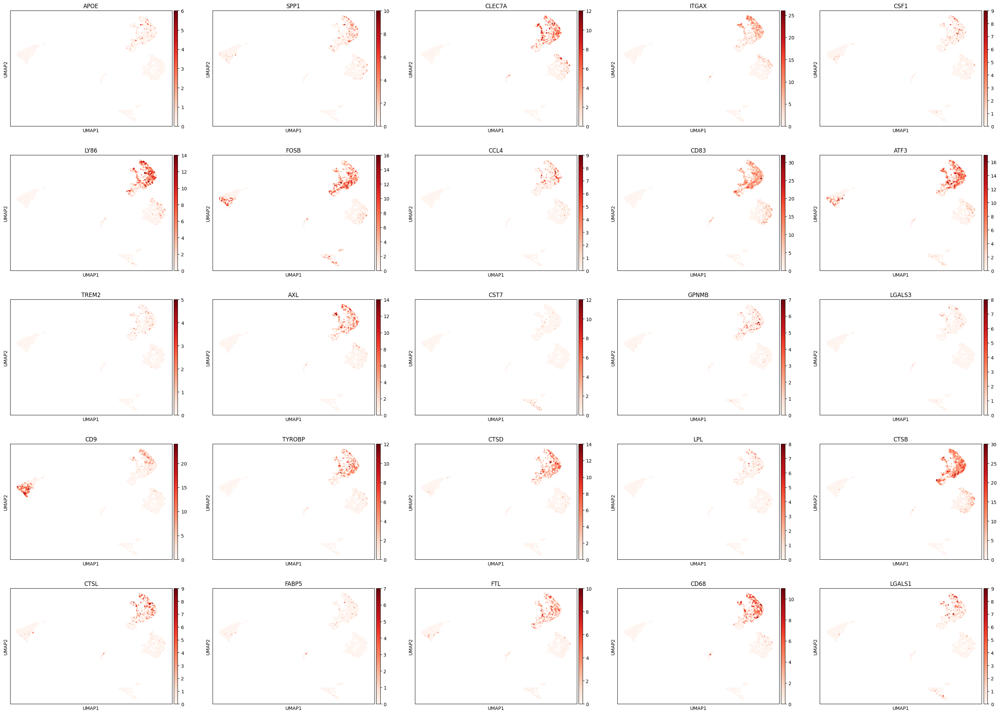

In [27]:
import matplotlib.pyplot as plt

# Copy UMAP coordinates from original data
gene_matrix.obsm['X_umap'] = data.obsm['X_umap']

# Plot all 25 DAM genes (remove cmap and ncols - not supported by snapatac2)
all_dam_genes = ['APOE', 'SPP1', 'CLEC7A', 'ITGAX', 'CSF1', 'LY86', 
                 'FOSB', 'CCL4', 'CD83', 'ATF3', 'TREM2', 'AXL', 'CST7',
                 'GPNMB', 'LGALS3', 'CD9', 'TYROBP', 'CTSD', 'LPL',
                 'CTSB', 'CTSL', 'FABP5', 'FTL', 'CD68', 'LGALS1']

# Plot one at a time or use scanpy instead
import scanpy as sc

sc.pl.umap(gene_matrix, color=all_dam_genes, cmap='Reds', ncols=5)

In [ ]:
#ELLIOT - Lucas' annotation method 
#import RNA reference data

reference = sc.read_h5ad('/mnt/claw-raid/elliot/brainvasc_ref.h5ad')
reference = reference.raw.to_adata() #mkaes sure ref is raw data also not nomrlised
reference


# Check the cell type column name in your reference
print(reference.obs.columns)  # Find which column has cell types


Index(['author_cell_type', 'cell_type_ontology_term_id', 'donor_id',
       'development_stage_ontology_term_id', 'sex_ontology_term_id',
       'disease_ontology_term_id', 'is_primary_data', 'suspension_type',
       'tissue_ontology_term_id', 'tissue_type', 'assay_ontology_term_id',
       'self_reported_ethnicity_ontology_term_id', 'cell_type', 'assay',
       'disease', 'sex', 'tissue', 'self_reported_ethnicity',
       'development_stage', 'observation_joinid'],
      dtype='object')


In [ ]:
#ELLIOT - Merge reference data and query data

# CRITICAL: Convert reference to use Ensembl IDs
reference.var_names = reference.var['ensembl_id'].values
reference.var_names_make_unique()

# Now merge
gene_matrix.obs['cell_type'] = 'Unknown'
integrated = ad.concat(  # ← Fixed typo: intergrated → integrated
    [reference, gene_matrix],
    join='inner',
    label='batch',
    keys=["reference", "query"],
    index_unique='_',
)

print(f"Combined shape: {integrated.shape}")

Combined shape: (66691, 30704)


In [16]:
# scanpy finds highly variable genes (batch correction)
#if you ask callum he will say this is shit because this is porabbly just to make it faster
sc.pp.filter_genes(integrated, min_cells=5)
#find hvg
sc.pp.highly_variable_genes(
    integrated,
    n_top_genes = 5000,
    flavor="seurat_v3",
    batch_key="batch",
    subset=True
)

In [17]:
#set up machine learning 
scvi.model.SCVI.setup_anndata(integrated, batch_key="batch")
vae = scvi.model.SCVI(
    integrated,
    n_layers=2,
    n_latent=30,
    gene_likelihood="nb",
    dispersion="gene-batch",
)

2025-11-22 15:52:09 - INFO - Unable to initialize backend 'cuda': 
2025-11-22 15:52:09 - INFO - Unable to initialize backend 'rocm': module 'jaxlib.xla_extension' has no attribute 'GpuAllocatorConfig'
2025-11-22 15:52:09 - INFO - Unable to initialize backend 'tpu': INTERNAL: Failed to open libtpu.so: libtpu.so: cannot open shared object file: No such file or directory


In [18]:
#pretraining model?
vae.train(max_epochs=100, early_stopping=True, enable_progress_bar=True)
#if it's taking forever, maybe subset your ref dataset or uncrease that batch size


/home/elliot/miniconda3/envs/atac_env/lib/python3.9/site-packages/lightning/fabric/plugins/environments/slurm.py:204: PossibleUserWarning:

The `srun` command is available on your system but is not used. HINT: If your intention is to run Lightning on SLURM, prepend your python command with `srun` like so: srun python /home/elliot/miniconda3/envs/atac_env/lib/python3.9/ ...

INFO: GPU available: False, used: False
2025-11-22 15:52:17 - INFO - GPU available: False, used: False
INFO: TPU available: False, using: 0 TPU cores
2025-11-22 15:52:17 - INFO - TPU available: False, using: 0 TPU cores
/home/elliot/miniconda3/envs/atac_env/lib/python3.9/site-packages/lightning/fabric/plugins/environments/slurm.py:204: PossibleUserWarning:

The `srun` command is available on your system but is not used. HINT: If your intention is to run Lightning on SLURM, prepend your python command with `srun` like so: srun python /home/elliot/miniconda3/envs/atac_env/lib/python3.9/ ...

/home/elliot/miniconda3/en

Epoch 100/100: 100%|██████████| 100/100 [17:50<00:00, 10.61s/it, v_num=1, train_loss_step=971, train_loss_epoch=1e+3]     

INFO: `Trainer.fit` stopped: `max_epochs=100` reached.
2025-11-22 16:10:07 - INFO - `Trainer.fit` stopped: `max_epochs=100` reached.


Epoch 100/100: 100%|██████████| 100/100 [17:50<00:00, 10.70s/it, v_num=1, train_loss_step=971, train_loss_epoch=1e+3]


<Axes: xlabel='epoch'>

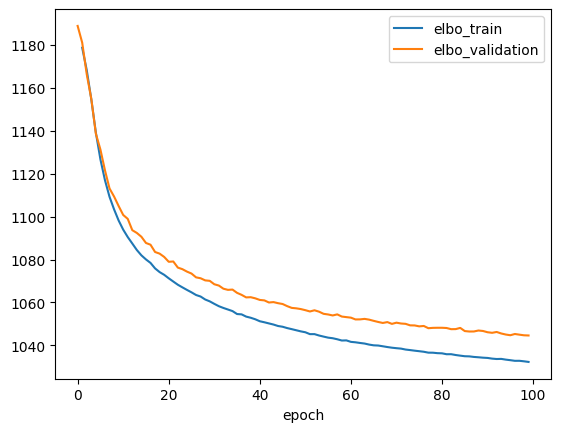

In [19]:
#plot training model to make sure it has converged 
ax = vae.history['elbo_train'][1:].plot()
vae.history['elbo_validation'].plot(ax=ax)


In [20]:
#setting up training model, check the 'class' or quivalent column is presetn in the refernce an merged object 
integrated.obs["celltype_scanvi"] = 'Unknown'
ref_idx = integrated.obs['batch'] == "reference"
integrated.obs.loc[ref_idx, "celltype_scanvi"] = integrated.obs.loc[ref_idx, 'cell_type'].astype(str) 


In [21]:
#who knows what this does maybe callum 
lvae = scvi.model.SCANVI.from_scvi_model(
    vae,
    adata=integrated,
    labels_key="celltype_scanvi",
    unlabeled_category="Unknown",
)

In [22]:
lvae.train(max_epochs=100, n_samples_per_label=100, early_stopping=True)

INFO     Training for 100 epochs.                                                                                  


/home/elliot/miniconda3/envs/atac_env/lib/python3.9/site-packages/lightning/fabric/plugins/environments/slurm.py:204: PossibleUserWarning:

The `srun` command is available on your system but is not used. HINT: If your intention is to run Lightning on SLURM, prepend your python command with `srun` like so: srun python /home/elliot/miniconda3/envs/atac_env/lib/python3.9/ ...

INFO: GPU available: False, used: False
2025-11-22 16:10:43 - INFO - GPU available: False, used: False
INFO: TPU available: False, using: 0 TPU cores
2025-11-22 16:10:43 - INFO - TPU available: False, using: 0 TPU cores
/home/elliot/miniconda3/envs/atac_env/lib/python3.9/site-packages/lightning/fabric/plugins/environments/slurm.py:204: PossibleUserWarning:

The `srun` command is available on your system but is not used. HINT: If your intention is to run Lightning on SLURM, prepend your python command with `srun` like so: srun python /home/elliot/miniconda3/envs/atac_env/lib/python3.9/ ...

/home/elliot/miniconda3/en

Epoch 100/100: 100%|██████████| 100/100 [41:59<00:00, 25.22s/it, v_num=1, train_loss_step=972, train_loss_epoch=999]    

INFO: `Trainer.fit` stopped: `max_epochs=100` reached.
2025-11-22 16:52:43 - INFO - `Trainer.fit` stopped: `max_epochs=100` reached.


Epoch 100/100: 100%|██████████| 100/100 [41:59<00:00, 25.19s/it, v_num=1, train_loss_step=972, train_loss_epoch=999]


<Axes: xlabel='epoch'>

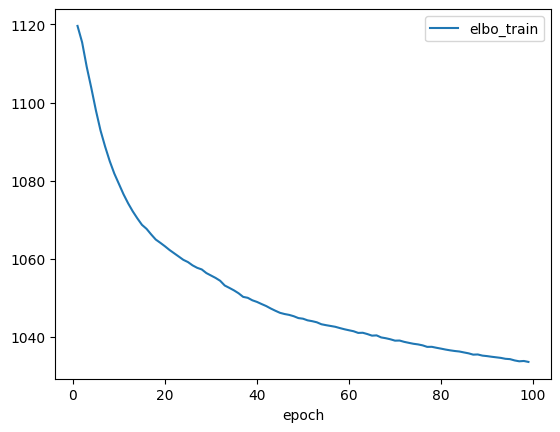

In [23]:
#plotting history as normal (if not saved)
lvae.history['elbo_train'][1:].plot()


In [24]:
# Now you can use the model
integrated.obs["C_scANVI"] = lvae.predict()
integrated.obsm["X_scANVI"] = lvae.get_latent_representation()

In [25]:
#generating uMAP
sc.pp.neighbors(integrated, use_rep="X_scANVI")
sc.tl.umap(integrated)

... storing 'cell_type' as categorical
... storing 'celltype_scanvi' as categorical
... storing 'C_scANVI' as categorical


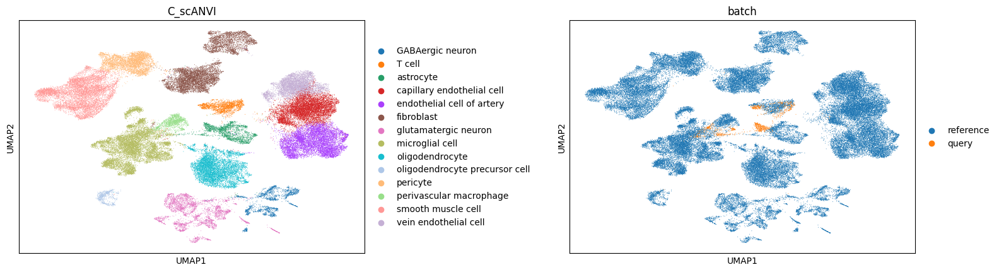

In [26]:
#Plotting uMAP querey and reference
sc.pl.umap(integrated, color=['C_scANVI', "batch"], wspace=0.45)


In [27]:
# Transfer predicted cell types back to original SnapATAC2 object
data.obs['cell_type'] = integrated.obs.loc[data.obs_names + '_query', 'C_scANVI'].to_numpy()

... storing 'leiden' as categorical
... storing 'cell_type' as categorical


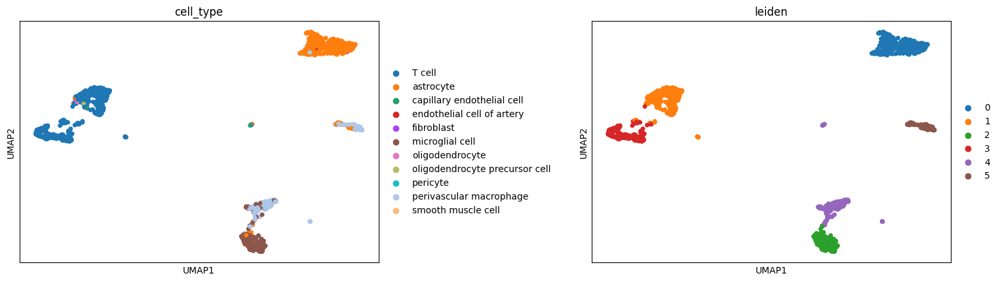

In [28]:
sc.pl.umap(data  , color=['cell_type', "leiden"], wspace=0.45)


In [ ]:
#save annotated data as h5ad file
data.write("annotated_PM.h5ad")


In [14]:
import matplotlib.pyplot as plt

# Define marker genes for each cell type
celltype_markers = {
    #'PBMCs': ["CD4","CD8A","CD3D","NCAM1","FCGR3A","CD14","CD1C","CLEC9A","IL3RA","GZMB","C5AR1","CD34","CD19","MS4A1"], ## PTPRC is CD45, sample should be 70/30 CD4+/CD4-
    'cortex': ["SPI1","P2RY12","RBFOX3","SYT1","SNAP25","OLIG1","GFAP","CD3D","CD14","CD68","PTPRC"],
  
}

# Plot UMAPs for each cell type's marker genes
for celltype, genes in celltype_markers.items():
    sc.pl.umap(
        gene_matrix, 
        color=genes, 
        ncols=2, 
        cmap='coolwarm',
        vmax='p95',
        size=10,
        title=[f"{celltype}: {gene}" for gene in genes],
        show=True
    )
plt.show()


... storing 'leiden' as categorical


KeyError: "Could not find 'umap' or 'X_umap' in .obsm"

In [ ]:
#Elliot - mkaing a DEGs list actually, gene_matrix is an object NOT an acutal matrix 

# Get the number of top genes (should be 20 based on your plot)
n_genes = len(gene_matrix.uns['rank_genes_groups']['names'])

# Create a dictionary with DEG lists for each cluster
deg_lists = {}
for i in range(n_genes):
    for j, cluster in enumerate(gene_matrix.uns['rank_genes_groups']['names'].dtype.names):
        if cluster not in deg_lists:
            deg_lists[cluster] = []
        deg_lists[cluster].append(gene_matrix.uns['rank_genes_groups']['names'][i][j])

# Now deg_lists contains clean lists of top DEGs for each cluster
for cluster, genes in deg_lists.items():
    print(f"Cluster {cluster}: {genes[:20]}...")  # Show first 5 genes

Cluster 0: ['LRP1B', 'GRID2', 'ENSG00000231918', 'CNTN5', 'CNTNAP2', 'DPP10', 'ENSG00000251574', 'EYS', 'ROBO2', 'ERBB4', 'DMD', 'NAALADL2', 'CSMD3', 'ENSG00000254394', 'CDH18', 'RBMS3', 'ROBO1', 'ENSG00000248752', 'SPAG16', 'CADM2']...
Cluster 1: ['PELATON', 'CDH23', 'ENSG00000285565', 'RAD51B', 'PSAP', 'DAPK1', 'SLC24A4', 'PGS1', 'ENSG00000234261', 'PFKFB3', 'ZMIZ1', 'ENSG00000273112', 'HSPD1', 'MGAT1', 'BAG3', 'MBP', 'HSPH1', 'ENSG00000285016', 'DNAJB6', 'XYLT1']...
Cluster 2: ['ENSG00000234261', 'LINC00877', 'SCIRT', 'ENSG00000258137', 'HK2', 'JARID2', 'ZMIZ1', 'ENSG00000258086', 'CUX1', 'PRKAG2', 'RBM47', 'RIN2', 'SLCO3A1', 'GAS7', 'RFX2', 'NCOR2', 'TIMP2', 'ENSG00000289728', 'DMXL2', 'FNDC3B']...
Cluster 3: ['HK2', 'CUX1', 'FNDC3B', 'RUNX1', 'PRKAG2', 'MAML3', 'JARID2', 'ASAP1', 'ENSG00000289728', 'DOCK5', 'ENSG00000259345', 'SLCO3A1', 'RPTOR', 'SLC24A4', 'ENSG00000286022', 'IGF2BP2', 'DOCK2', 'PPARG', 'LUCAT1', 'NIBAN2']...
Cluster 4: ['BCL11B', 'RORA', 'RORA-AS1', 'SCML4', 'ITK

... storing 'leiden' as categorical


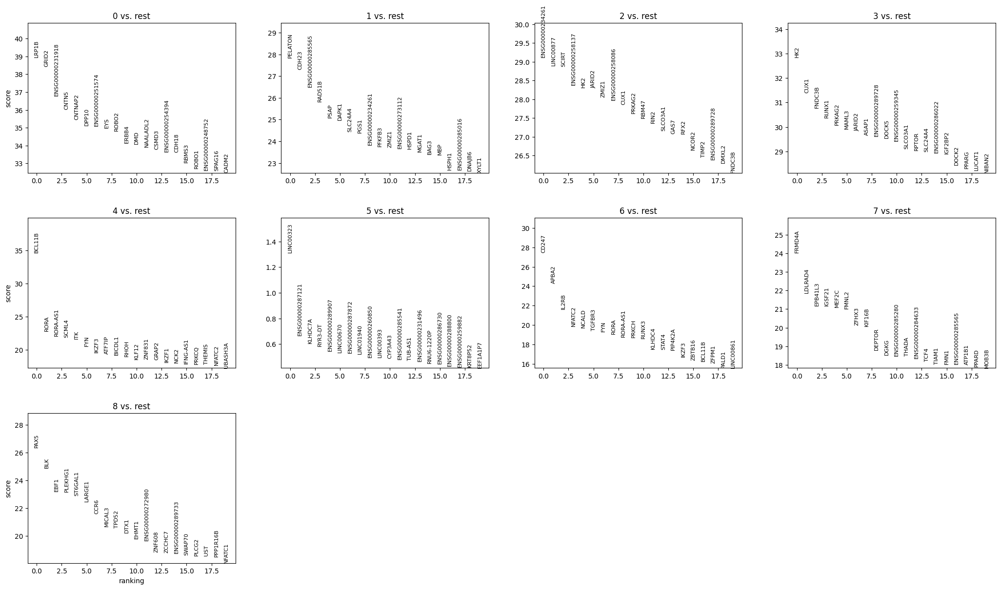

In [ ]:
# Run differential expression analysis between clusters (e.g., 'leiden' clusters)
sc.tl.rank_genes_groups(gene_matrix, groupby='leiden', method='wilcoxon')

# Show the top marker genes for each cluster
sc.pl.rank_genes_groups(gene_matrix, n_genes=20, sharey=False)



In [ ]:
# !!!!!!!!!!!!!!!!!! !!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!OK SO NOW THE MT VARIANT CALLING BEGINS STOP HERE !!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!

In [4]:
import anndata as ad

data = ad.read_h5ad("/mnt/claw-raid/elliot/P002_mtscATAC-seq/data/processed/atac_surg_Ctx/atac_surg_ctx.h5ad")



In [5]:
import sys
sys.path.insert(0, '/mnt/claw-raid/elliot/P002_mtscATAC-seq/scripts/Py_mTCall_tools')
from Py_mTCall_tools import variant_calling_fast as vc
mgatk = vc.process_variants_fast("/mnt/claw-raid/elliot/P002_mtscATAC-seq/data/raw/brain_epilepsy/data/mgatk_output/final", data, min_strand_count=1, coverage_threshold=20)


=== Fast Variant Calling Pipeline ===
Loaded counts data: (131835, 4028)
Loaded coverage data: (63327769, 3)
Identifying variants (memory-optimized chunked method)...
Processing all 98699 variant observations
Extracting unique cells...
Found 4025 cells, processing 17 chunks...
  Processing chunk 0/17...
  Processing chunk 5/17...
  Processing chunk 10/17...
  Processing chunk 15/17...
Integrating with AnnData...
Matched 3303 cells out of 3346 in adata
=== Pipeline Complete ===
Processed 44436 variants in 3303 cells
Matrix shapes: (3346, 44436) (cells x variants)


In [ ]:
~just looking for enricehd variants 
import numpy as np
from scipy.stats import fisher_exact
import pandas as pd

# Settings
min_cells_total = 10
max_prevalence = 0.5

results = []

# Loop through all variants
for i, variant in enumerate(variant_names):
    if i % 5000 == 0:
        print(f"Progress: {i}/{len(variant_names)}")
    
    variant_vaf = vaf_matrix[:, i]
    g246_vaf = variant_vaf[group_2_4_6_mask]
    g13_vaf = variant_vaf[group_1_3_mask]
    
    # Count cells at 2% threshold
    g246_with = (g246_vaf > 0.02).sum()
    g13_with = (g13_vaf > 0.02).sum()
    
    # Mean VAF
    mean_g246 = np.mean(g246_vaf)
    mean_g13 = np.mean(g13_vaf)
    
    # Total prevalence check (at 1% threshold)
    total_with = (variant_vaf > 0.01).sum()
    prevalence = total_with / len(variant_vaf)
    
    # Skip uninformative variants
    if total_with < min_cells_total or prevalence > max_prevalence:
        continue
    
    # ENRICHMENT PATTERN
    # ≥10 cells at 2% in 246, ≤5 cells at 2% in 13, 1.5x mean enrichment
    if not (g246_with >= 10 and g13_with <= 5 and mean_g246 > mean_g13 * 1.5):
        continue
    
    # Fisher's exact test
    table = [[g246_with, len(g246_vaf) - g246_with], 
             [g13_with, len(g13_vaf) - g13_with]]
    odds_ratio, p_value = fisher_exact(table)
    
    # Log2 fold change
    prop_g246 = g246_with / len(g246_vaf)
    prop_g13 = g13_with / len(g13_vaf)
    log2fc = np.log2((prop_g246 + 0.001) / (prop_g13 + 0.001))
    
    results.append({
        'variant': variant,
        'n_246': g246_with,
        'n_13': g13_with,
        'mean_246': mean_g246,
        'mean_13': mean_g13,
        'log2FC': log2fc,
        'odds_ratio': odds_ratio,
        'p_value': p_value
    })

df = pd.DataFrame(results)

# Filter significant, then sort by effect size
df_sig = df[df['p_value'] < 0.05].sort_values('log2FC', ascending=False)

print(f"\nFound {len(df)} enriched variants")
print(f"Significant (p<0.05): {len(df_sig)}")
print("\n=== TOP 20 SIGNIFICANT VARIANTS (by log2FC) ===")
print(df_sig.head(20))
print("\n=== ALL VARIANTS (by p-value) ===")
print(df.sort_values('p_value').head(20))


Progress: 0/44436
Progress: 5000/44436
Progress: 10000/44436
Progress: 15000/44436
Progress: 20000/44436
Progress: 25000/44436
Progress: 30000/44436
Progress: 35000/44436
Progress: 40000/44436

Found 412 enriched variants
Significant (p<0.05): 125

=== TOP 20 SIGNIFICANT VARIANTS (by log2FC) ===
       variant  n_246  n_13  mean_246   mean_13    log2FC  odds_ratio  \
300  C-11175-A     13     0  0.000378  0.000050  3.473639         inf   
135   C-9633-T     12     0  0.000417  0.000000  3.368944         inf   
274  C-10891-A     12     0  0.000467  0.000019  3.368944         inf   
86    C-9891-T     11     0  0.000269  0.000061  3.256053         inf   
150  C-11859-T     11     0  0.000366  0.000024  3.256053         inf   
304  G-10283-A     11     0  0.000327  0.000000  3.256053         inf   
309   G-1276-A     11     0  0.000379  0.000016  3.256053         inf   
59    C-7913-T     10     0  0.000277  0.000027  3.133572         inf   
91    T-7816-C     10     0  0.000238  0.00000

Plotting top 12 variants:
  C-12188-T: High_cluster | 246=10 vs 13=4 cells | p=0.290
  C-948-T: High_cluster | 246=10 vs 13=5 cells | p=0.448
  T-16256-C: Moderate_enrich | 246=17 vs 13=3 cells | p=0.011
  C-13356-T: Moderate_enrich | 246=14 vs 13=4 cells | p=0.093
  C-8376-T: High_cluster | 246=10 vs 13=5 cells | p=0.448
  C-10242-T: High_cluster | 246=10 vs 13=0 cells | p=0.003
  C-13856-T: Moderate_enrich | 246=22 vs 13=4 cells | p=0.003
  C-2007-T: Moderate_enrich | 246=13 vs 13=5 cells | p=0.233
  C-10992-T: Moderate_enrich | 246=12 vs 13=5 cells | p=0.327
  G-12999-A: High_cluster | 246=22 vs 13=3 cells | p=0.001
  A-13958-G: Moderate_enrich | 246=10 vs 13=1 cells | p=0.029
  T-4393-c: Moderate_enrich | 246=13 vs 13=4 cells | p=0.139


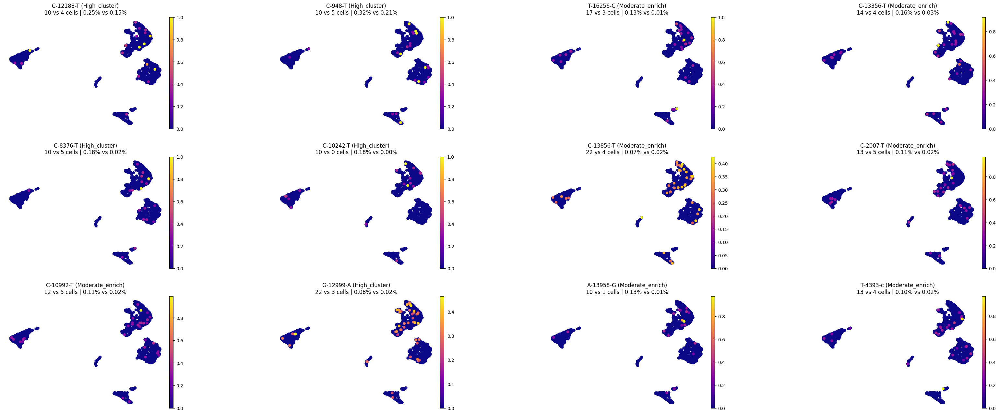


✓ These should show cluster-specific enrichment if real!


In [79]:
# just plotting the most enriched variants now
import scanpy as sc
import matplotlib.pyplot as plt

# Take top 12 variants by pattern score
top_variants = df_filtered.head(12)['variant'].tolist()

print(f"Plotting top {len(top_variants)} variants:")
for v in top_variants:
    row = df_filtered[df_filtered['variant'] == v].iloc[0]
    print(f"  {v}: {row['pattern']} | 246={row['group_2_4_6_with_2pct']} vs 13={row['group_1_3_with_2pct']} cells | p={row['p_value']:.3f}")

# Add to mgatk object with cube root transformation to enhance low signals
for variant in top_variants:
    variant_idx = variant_names.index(variant)
    vaf_values = mgatk.obsm['variant_vaf'][:, variant_idx]
    # Cube root transform (more aggressive than sqrt for low VAF)
    mgatk.obs[f'vaf_{variant}'] = np.power(vaf_values, 1/3)

# Create informative titles
titles = []
for v in top_variants:
    row = df_filtered[df_filtered['variant'] == v].iloc[0]
    pattern = row['pattern']
    n_246 = int(row['group_2_4_6_with_2pct'])
    n_13 = int(row['group_1_3_with_2pct'])
    mean_246 = row['mean_group_2_4_6'] * 100
    mean_13 = row['mean_group_1_3'] * 100
    titles.append(f"{v} ({pattern})\n{n_246} vs {n_13} cells | {mean_246:.2f}% vs {mean_13:.2f}%")

# Plot with high contrast
sc.pl.umap(mgatk, 
           color=[f'vaf_{v}' for v in top_variants],
           cmap='plasma',
           size=150,
           frameon=False,
           ncols=4,
           wspace=0.5,
           title=titles,
           vmin=0)

print("\n✓ These should show cluster-specific enrichment if real!")


In [ ]:
#identify good pathogenic variants
import numpy as np
from scipy.stats import fisher_exact
import pandas as pd

# Settings
min_cells_total = 10
max_prevalence = 0.5

results = []

# Loop through variants WITH pathogenicity scores only
for i, variant in enumerate(variant_names):
    if i % 5000 == 0:
        print(f"Progress: {i}/{len(variant_names)}")
    
    # FILTER: Only analyze variants with MitoTIP scores
    if variant_info[variant]['pathogenicity'] == 0:
        continue
    
    variant_vaf = vaf_matrix[:, i]
    g246_vaf = variant_vaf[group_2_4_6_mask]
    g13_vaf = variant_vaf[group_1_3_mask]
    
    # Count cells at 2% threshold
    g246_with = (g246_vaf > 0.02).sum()
    g13_with = (g13_vaf > 0.02).sum()
    
    # Mean VAF
    mean_g246 = np.mean(g246_vaf)
    mean_g13 = np.mean(g13_vaf)
    
    # Total prevalence check (at 1% threshold)
    total_with = (variant_vaf > 0.01).sum()
    prevalence = total_with / len(variant_vaf)
    
    # Skip uninformative variants
    if total_with < min_cells_total or prevalence > max_prevalence:
        continue
    
    # ENRICHMENT PATTERN
    # ≥10 cells at 2% in 246, ≤5 cells at 2% in 13, 1.5x mean enrichment
    if not (g246_with >= 10 and g13_with <= 5 and mean_g246 > mean_g13 * 1.5):
        continue
    
    # Fisher's exact test
    table = [[g246_with, len(g246_vaf) - g246_with], 
             [g13_with, len(g13_vaf) - g13_with]]
    odds_ratio, p_value = fisher_exact(table)
    
    # Log2 fold change
    prop_g246 = g246_with / len(g246_vaf)
    prop_g13 = g13_with / len(g13_vaf)
    log2fc = np.log2((prop_g246 + 0.001) / (prop_g13 + 0.001))
    
    # Get pathogenicity score
    pathogenicity = variant_info[variant]['pathogenicity']
    
    results.append({
        'variant': variant,
        'pathogenicity_score': pathogenicity,
        'n_246': g246_with,
        'n_13': g13_with,
        'mean_246': mean_g246,
        'mean_13': mean_g13,
        'log2FC': log2fc,
        'odds_ratio': odds_ratio,
        'p_value': p_value
    })

df = pd.DataFrame(results)

# Filter significant, then sort by pathogenicity score
df_sig = df[df['p_value'] < 0.05].sort_values('pathogenicity_score', ascending=False)

print(f"\nFound {len(df)} enriched variants with pathogenicity scores")
print(f"Significant (p<0.05): {len(df_sig)}")
print("\n=== TOP 20 BY PATHOGENICITY SCORE ===")
print(df_sig[['variant', 'pathogenicity_score', 'n_246', 'n_13', 'log2FC', 'p_value']].head(20))
print("\n=== TOP 20 BY LOG2FC ===")
print(df_sig.sort_values('log2FC', ascending=False)[['variant', 'pathogenicity_score', 'n_246', 'n_13', 'log2FC', 'p_value']].head(20))


Progress: 0/44436
Progress: 5000/44436
Progress: 10000/44436
Progress: 15000/44436
Progress: 20000/44436
Progress: 25000/44436
Progress: 30000/44436
Progress: 35000/44436
Progress: 40000/44436

Found 15 enriched variants with pathogenicity scores
Significant (p<0.05): 5

=== TOP 20 BY PATHOGENICITY SCORE ===
      variant  pathogenicity_score  n_246  n_13    log2FC   p_value
7   A-12275-G              18.2387     13     1  2.477948  0.005188
6    C-4468-T              18.1548     10     1  2.137880  0.028521
1   T-12258-C              17.1627     10     1  2.137880  0.028521
3    C-5886-T              13.5032     13     2  1.894425  0.017826
12    G-581-A              11.6371     10     1  2.137880  0.028521

=== TOP 20 BY LOG2FC ===
      variant  pathogenicity_score  n_246  n_13    log2FC   p_value
7   A-12275-G              18.2387     13     1  2.477948  0.005188
6    C-4468-T              18.1548     10     1  2.137880  0.028521
1   T-12258-C              17.1627     10     1  2.1


=== PLOTTING TOP 5 PATHOGENIC ENRICHED VARIANTS ===
  A-12275-G: pathogenicity=18.2, 13 vs 1 cells, log2FC=2.48, p=0.005
  C-4468-T: pathogenicity=18.2, 10 vs 1 cells, log2FC=2.14, p=0.029
  T-12258-C: pathogenicity=17.2, 10 vs 1 cells, log2FC=2.14, p=0.029
  C-5886-T: pathogenicity=13.5, 13 vs 2 cells, log2FC=1.89, p=0.018
  G-581-A: pathogenicity=11.6, 10 vs 1 cells, log2FC=2.14, p=0.029


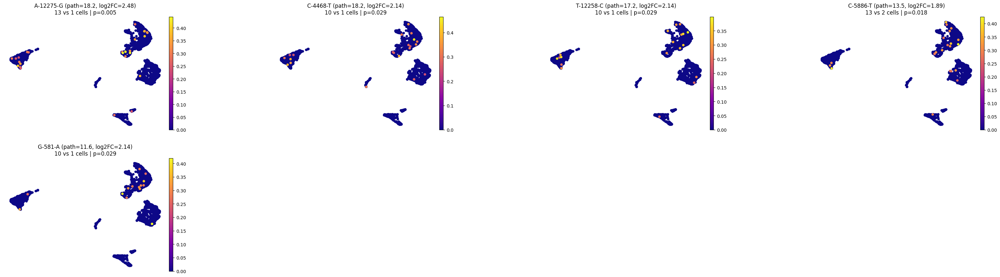


✓ Plotted top pathogenic enriched variants on UMAP


In [ ]:
#plot pathogenic variants 
import scanpy as sc
import matplotlib.pyplot as plt
import numpy as np

# After running your analysis code, plot the top pathogenic enriched variants
if len(df_sig) > 0:
    # Take top 12 by pathogenicity score
    top_variants = df_sig.head(12)['variant'].tolist()
    
    print(f"\n=== PLOTTING TOP {len(top_variants)} PATHOGENIC ENRICHED VARIANTS ===")
    for v in top_variants:
        row = df_sig[df_sig['variant'] == v].iloc[0]
        print(f"  {v}: pathogenicity={row['pathogenicity_score']:.1f}, {row['n_246']} vs {row['n_13']} cells, log2FC={row['log2FC']:.2f}, p={row['p_value']:.3f}")
    
    # Add sqrt-transformed VAF to mgatk object for visualization
    for variant in top_variants:
        variant_idx = variant_names.index(variant)
        vaf_values = mgatk.obsm['variant_vaf'][:, variant_idx]
        # Cube root transform to enhance low signals
        mgatk.obs[f'vaf_{variant}'] = np.power(vaf_values, 1/3)
    
    # Create titles with pathogenicity info AND log2FC
    titles = []
    for v in top_variants:
        row = df_sig[df_sig['variant'] == v].iloc[0]
        path_score = row['pathogenicity_score']
        n_246 = int(row['n_246'])
        n_13 = int(row['n_13'])
        log2fc = row['log2FC']
        titles.append(f"{v} (path={path_score:.1f}, log2FC={log2fc:.2f})\n{n_246} vs {n_13} cells | p={row['p_value']:.3f}")
    
    # Plot on UMAP
    sc.pl.umap(mgatk, 
               color=[f'vaf_{v}' for v in top_variants],
               cmap='plasma',
               size=120,
               frameon=False,
               ncols=4,
               wspace=0.5,
               title=titles,
               vmin=0)
    
    print("\n✓ Plotted top pathogenic enriched variants on UMAP")
    
else:
    print("\n❌ No significant pathogenic variants to plot")


In [155]:
# Identify pathogenic variants enriched in HOMEOSTATIC cluster
import numpy as np
from scipy.stats import fisher_exact
import pandas as pd

# Settings
min_cells_total = 10
max_prevalence = 0.5

results = []

# Loop through variants WITH pathogenicity scores only
for i, variant in enumerate(variant_names):
    if i % 5000 == 0:
        print(f"Progress: {i}/{len(variant_names)}")
    
    # FILTER: Only analyze variants with MitoTIP scores
    if variant_info[variant]['pathogenicity'] == 0:
        continue
    
    variant_vaf = vaf_matrix[:, i]
    g246_vaf = variant_vaf[group_2_4_6_mask]  # Inflammatory
    g13_vaf = variant_vaf[group_1_3_mask]      # Homeostatic
    
    # Count cells at 2% threshold
    g246_with = (g246_vaf > 0.02).sum()
    g13_with = (g13_vaf > 0.02).sum()
    
    # Mean VAF
    mean_g246 = np.mean(g246_vaf)
    mean_g13 = np.mean(g13_vaf)
    
    # Total prevalence check (at 1% threshold)
    total_with = (variant_vaf > 0.01).sum()
    prevalence = total_with / len(variant_vaf)
    
    # Skip uninformative variants
    if total_with < min_cells_total or prevalence > max_prevalence:
        continue
    
    # HOMEOSTATIC ENRICHMENT PATTERN (REVERSED)
    # ≥10 cells at 2% in 13 (homeostatic), ≤5 cells at 2% in 246 (inflammatory), 1.5x mean enrichment
    if not (g13_with >= 10 and g246_with <= 5 and mean_g13 > mean_g246 * 1.5):
        continue
    
    # Fisher's exact test
    table = [[g246_with, len(g246_vaf) - g246_with], 
             [g13_with, len(g13_vaf) - g13_with]]
    odds_ratio, p_value = fisher_exact(table)
    
    # Log2 fold change (INFLAMMATORY / HOMEOSTATIC for consistency)
    # Negative values = homeostatic enriched
    prop_g246 = g246_with / len(g246_vaf)
    prop_g13 = g13_with / len(g13_vaf)
    log2fc = np.log2((prop_g246 + 0.001) / (prop_g13 + 0.001))
    
    # Get pathogenicity score
    pathogenicity = variant_info[variant]['pathogenicity']
    
    results.append({
        'variant': variant,
        'pathogenicity_score': pathogenicity,
        'n_246': g246_with,
        'n_13': g13_with,
        'mean_246': mean_g246,
        'mean_13': mean_g13,
        'log2FC': log2fc,
        'odds_ratio': odds_ratio,
        'p_value': p_value
    })

df = pd.DataFrame(results)

# Filter significant, then sort by pathogenicity score
df_sig = df[df['p_value'] < 0.05].sort_values('pathogenicity_score', ascending=False)

print(f"\nFound {len(df)} HOMEOSTATIC-enriched variants with pathogenicity scores")
print(f"Significant (p<0.05): {len(df_sig)}")

if len(df_sig) > 0:
    print("\n=== TOP 20 BY PATHOGENICITY SCORE ===")
    print(df_sig[['variant', 'pathogenicity_score', 'n_246', 'n_13', 'log2FC', 'p_value']].head(20))
    print("\n=== TOP 20 BY LOG2FC (most homeostatic-enriched) ===")
    print(df_sig.sort_values('log2FC', ascending=True)[['variant', 'pathogenicity_score', 'n_246', 'n_13', 'log2FC', 'p_value']].head(20))
else:
    print("\n⚠️  NO homeostatic-enriched pathogenic variants found with these criteria")
    print("\nTrying relaxed criteria...")
    
    # Show what exists with relaxed criteria
    df_relaxed = df[(df['p_value'] < 0.10) | (df['n_13'] >= 5)]
    if len(df_relaxed) > 0:
        print(f"\nFound {len(df_relaxed)} candidates with relaxed criteria (p<0.10 or n_13≥5):")
        print(df_relaxed.sort_values('pathogenicity_score', ascending=False)[['variant', 'pathogenicity_score', 'n_246', 'n_13', 'log2FC', 'p_value']].head(20))
    else:
        print("\n⚠️  ZERO pathogenic variants show homeostatic enrichment at any threshold")


Progress: 0/44436
Progress: 5000/44436
Progress: 10000/44436
Progress: 15000/44436
Progress: 20000/44436
Progress: 25000/44436
Progress: 30000/44436
Progress: 35000/44436
Progress: 40000/44436

Found 1 HOMEOSTATIC-enriched variants with pathogenicity scores
Significant (p<0.05): 1

=== TOP 20 BY PATHOGENICITY SCORE ===
     variant  pathogenicity_score  n_246  n_13    log2FC   p_value
0  C-12145-T              12.6289      5    13 -1.510091  0.017294

=== TOP 20 BY LOG2FC (most homeostatic-enriched) ===
     variant  pathogenicity_score  n_246  n_13    log2FC   p_value
0  C-12145-T              12.6289      5    13 -1.510091  0.017294



=== PLOTTING HOMEOSTATIC-ENRICHED PATHOGENIC VARIANT ===
  C-12145-T: pathogenicity=12.6, 5 vs 13 cells, log2FC=-1.51, p=0.017


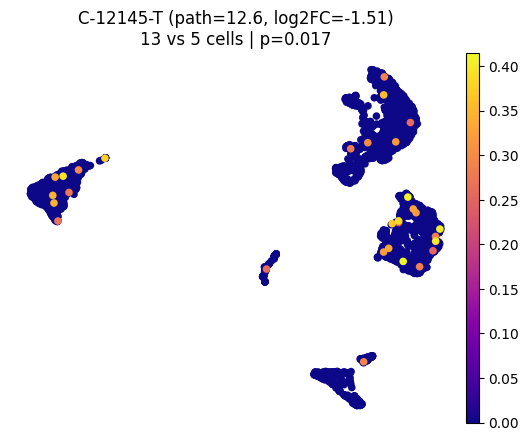


✓ Plotted C-12145-T on UMAP
  Note: This variant is enriched in HOMEOSTATIC cells (13>13, 246=5)
  Negative log2FC (-1.51) indicates homeostatic enrichment


In [156]:
# Plot the single homeostatic-enriched pathogenic variant on UMAP
import scanpy as sc
import matplotlib.pyplot as plt
import numpy as np

# The single homeostatic-enriched variant
variant = "C-12145-T"

print(f"\n=== PLOTTING HOMEOSTATIC-ENRICHED PATHOGENIC VARIANT ===")
row = df_sig.iloc[0]
print(f"  {variant}: pathogenicity={row['pathogenicity_score']:.1f}, {row['n_246']} vs {row['n_13']} cells, log2FC={row['log2FC']:.2f}, p={row['p_value']:.3f}")

# Add cube root-transformed VAF to mgatk object for visualization
variant_idx = variant_names.index(variant)
vaf_values = mgatk.obsm['variant_vaf'][:, variant_idx]
mgatk.obs[f'vaf_{variant}'] = np.power(vaf_values, 1/3)

# Create title with pathogenicity info
path_score = row['pathogenicity_score']
n_246 = int(row['n_246'])
n_13 = int(row['n_13'])
log2fc = row['log2FC']
p_val = row['p_value']

title = f"{variant} (path={path_score:.1f}, log2FC={log2fc:.2f})\n{n_13} vs {n_246} cells | p={p_val:.3f}"

# Plot on UMAP
sc.pl.umap(mgatk, 
           color=f'vaf_{variant}',
           cmap='plasma',
           size=120,
           frameon=False,
           title=title,
           vmin=0)

print(f"\n✓ Plotted {variant} on UMAP")
print(f"  Note: This variant is enriched in HOMEOSTATIC cells (13>{n_13}, 246={n_246})")
print(f"  Negative log2FC ({log2fc:.2f}) indicates homeostatic enrichment")


PATHOGENIC VARIANTS (MitoTIP ≥12) - VAF THRESHOLD SENSITIVITY

Total variants: 44436
Likely PATHOGENIC (≥12): 1812

VAF THRESHOLD: ≥0%
Median burden - 246: 1.6980, 13: 1.4550
Fold change: 1.167x
P-value: 0.045415 ✓ SIGNIFICANT
Cells with burden >0 - 246: 862/1286 (67.0%)
                       13: 630/1006 (62.6%)

VAF THRESHOLD: ≥1%
Median burden - 246: 1.6935, 13: 1.4501
Fold change: 1.168x
P-value: 0.044436 ✓ SIGNIFICANT
Cells with burden >0 - 246: 862/1286 (67.0%)
                       13: 630/1006 (62.6%)

VAF THRESHOLD: ≥2%
Median burden - 246: 1.4582, 13: 1.2532
Fold change: 1.164x
P-value: 0.022637 ✓ SIGNIFICANT
Cells with burden >0 - 246: 854/1286 (66.4%)
                       13: 624/1006 (62.0%)

VAF THRESHOLD: ≥3%
Median burden - 246: 0.9718, 13: 0.7852
Fold change: 1.238x
P-value: 0.070234 ✗ NOT SIGNIFICANT
Cells with burden >0 - 246: 762/1286 (59.3%)
                       13: 572/1006 (56.9%)

VAF THRESHOLD: ≥5%
Median burden - 246: 0.0000, 13: 0.0000
Fold change: nanx

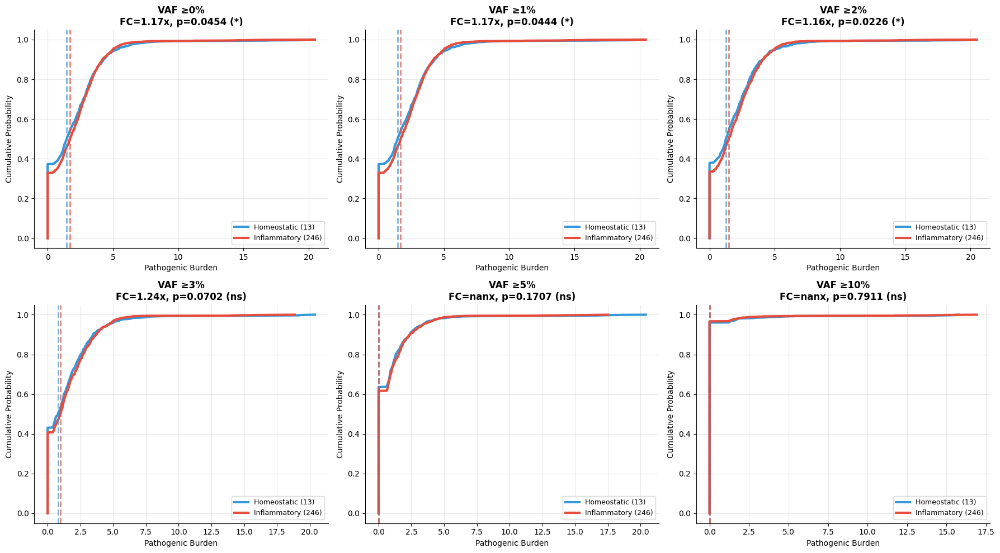


SUMMARY TABLE
 vaf_threshold  median_246  median_13  fold_change  p_value  cells_246_pct  cells_13_pct
          0.00    1.697965   1.455049     1.166946 0.045415      67.029549     62.624254
          0.01    1.693528   1.450148     1.167831 0.044436      67.029549     62.624254
          0.02    1.458214   1.253230     1.163565 0.022637      66.407465     62.027833
          0.03    0.971849   0.785189     1.237726 0.070234      59.253499     56.858847
          0.05    0.000000   0.000000          NaN 0.170709      38.335925     36.381710
          0.10    0.000000   0.000000          NaN 0.791064       3.343701      3.976143


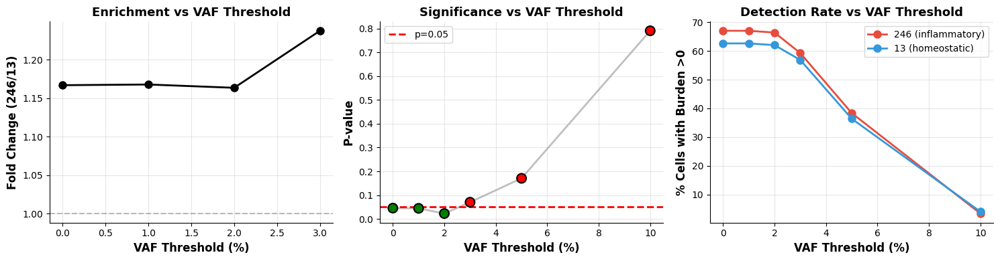


✓ Sensitivity analysis complete!


In [ ]:
#are pathoneic varinats GENERALLY enriched in infalmmatory cluster
import numpy as np
from scipy.stats import mannwhitneyu
import scanpy as sc
import matplotlib.pyplot as plt
import seaborn as sns

print("=" * 70)
print("PATHOGENIC VARIANTS (MitoTIP ≥12) - VAF THRESHOLD SENSITIVITY")
print("=" * 70)

# Test multiple VAF thresholds
vaf_thresholds = [0, 0.01, 0.02, 0.03, 0.05, 0.10]

# Filter to ONLY likely pathogenic variants (score ≥ 12)
pathogenic_mask = np.array([variant_info[v]['pathogenicity'] >= 12.0 for v in variant_names])
pathogenic_scores = pathogenicity_scores.copy()
pathogenic_scores[~pathogenic_mask] = 0

print(f"\nTotal variants: {len(variant_names)}")
print(f"Likely PATHOGENIC (≥12): {pathogenic_mask.sum()}")

# Add group labels if not already present
if 'group' not in mgatk.obs.columns:
    mgatk.obs['group'] = 'other'
    mgatk.obs.loc[group_2_4_6_mask, 'group'] = '246_inflammatory'
    mgatk.obs.loc[group_1_3_mask, 'group'] = '13_homeostatic'

# Store results
results = []

# Create figure with subplots
n_thresholds = len(vaf_thresholds)
fig, axes = plt.subplots(2, 3, figsize=(18, 10))
axes = axes.flatten()

for idx, min_vaf in enumerate(vaf_thresholds):
    print(f"\n{'='*70}")
    print(f"VAF THRESHOLD: ≥{min_vaf*100:.0f}%")
    print(f"{'='*70}")
    
    # Filter VAF matrix
    vaf_matrix_filtered = vaf_matrix.copy()
    vaf_matrix_filtered[vaf_matrix_filtered < min_vaf] = 0
    
    # Calculate burden
    weighted_pathogenicity = vaf_matrix_filtered @ pathogenic_scores
    
    # Compare groups
    path_246 = weighted_pathogenicity[group_2_4_6_mask]
    path_13 = weighted_pathogenicity[group_1_3_mask]
    
    # Stats
    stat, p_value = mannwhitneyu(path_246, path_13, alternative='greater')
    
    median_246 = np.median(path_246)
    median_13 = np.median(path_13)
    mean_246 = np.mean(path_246)
    mean_13 = np.mean(path_13)
    
    if median_13 > 0:
        fold_change = median_246 / median_13
    else:
        fold_change = np.nan
    
    cells_246 = (path_246 > 0).sum()
    cells_13 = (path_13 > 0).sum()
    
    # Store results
    results.append({
        'vaf_threshold': min_vaf,
        'median_246': median_246,
        'median_13': median_13,
        'fold_change': fold_change,
        'p_value': p_value,
        'cells_246_pct': 100*cells_246/len(path_246),
        'cells_13_pct': 100*cells_13/len(path_13)
    })
    
    # Print
    print(f"Median burden - 246: {median_246:.4f}, 13: {median_13:.4f}")
    print(f"Fold change: {fold_change:.3f}x")
    print(f"P-value: {p_value:.6f} {'✓ SIGNIFICANT' if p_value < 0.05 else '✗ NOT SIGNIFICANT'}")
    print(f"Cells with burden >0 - 246: {cells_246}/{len(path_246)} ({100*cells_246/len(path_246):.1f}%)")
    print(f"                       13: {cells_13}/{len(path_13)} ({100*cells_13/len(path_13):.1f}%)")
    
    # Plot cumulative distribution
    ax = axes[idx]
    
    path_13_sorted = np.sort(path_13)
    path_246_sorted = np.sort(path_246)
    
    ax.plot(path_13_sorted, np.linspace(0, 1, len(path_13)), 
            linewidth=3, label='Homeostatic (13)', color='#3498db')
    ax.plot(path_246_sorted, np.linspace(0, 1, len(path_246)), 
            linewidth=3, label='Inflammatory (246)', color='#e74c3c')
    
    # Median lines
    ax.axvline(median_13, color='#3498db', linestyle='--', alpha=0.7, linewidth=2)
    ax.axvline(median_246, color='#e74c3c', linestyle='--', alpha=0.7, linewidth=2)
    
    # Title with stats
    sig_marker = '***' if p_value < 0.001 else '**' if p_value < 0.01 else '*' if p_value < 0.05 else 'ns'
    ax.set_title(f'VAF ≥{min_vaf*100:.0f}%\nFC={fold_change:.2f}x, p={p_value:.4f} ({sig_marker})', 
                 fontsize=12, fontweight='bold')
    ax.set_xlabel('Pathogenic Burden', fontsize=10)
    ax.set_ylabel('Cumulative Probability', fontsize=10)
    ax.legend(fontsize=9, loc='lower right')
    ax.grid(alpha=0.3)
    ax.spines['top'].set_visible(False)
    ax.spines['right'].set_visible(False)

plt.tight_layout()
plt.show()

# Summary table
print("\n" + "="*70)
print("SUMMARY TABLE")
print("="*70)
df_results = pd.DataFrame(results)
print(df_results.to_string(index=False))

# Plot summary
fig, axes = plt.subplots(1, 3, figsize=(15, 4))

# Fold change vs threshold
ax = axes[0]
ax.plot(df_results['vaf_threshold']*100, df_results['fold_change'], 
        marker='o', linewidth=2, markersize=8, color='black')
ax.axhline(1, color='gray', linestyle='--', alpha=0.5)
ax.set_xlabel('VAF Threshold (%)', fontsize=12, fontweight='bold')
ax.set_ylabel('Fold Change (246/13)', fontsize=12, fontweight='bold')
ax.set_title('Enrichment vs VAF Threshold', fontsize=13, fontweight='bold')
ax.grid(alpha=0.3)
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)

# P-value vs threshold
ax = axes[1]
colors = ['green' if p < 0.05 else 'red' for p in df_results['p_value']]
ax.scatter(df_results['vaf_threshold']*100, df_results['p_value'], 
          s=100, c=colors, edgecolor='black', linewidth=1.5, zorder=3)
ax.plot(df_results['vaf_threshold']*100, df_results['p_value'], 
        linewidth=2, color='gray', alpha=0.5, zorder=1)
ax.axhline(0.05, color='red', linestyle='--', linewidth=2, label='p=0.05', zorder=2)
ax.set_xlabel('VAF Threshold (%)', fontsize=12, fontweight='bold')
ax.set_ylabel('P-value', fontsize=12, fontweight='bold')
ax.set_title('Significance vs VAF Threshold', fontsize=13, fontweight='bold')
ax.legend()
ax.grid(alpha=0.3)
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)

# Cells detected vs threshold
ax = axes[2]
ax.plot(df_results['vaf_threshold']*100, df_results['cells_246_pct'], 
        marker='o', linewidth=2, markersize=8, label='246 (inflammatory)', color='#e74c3c')
ax.plot(df_results['vaf_threshold']*100, df_results['cells_13_pct'], 
        marker='o', linewidth=2, markersize=8, label='13 (homeostatic)', color='#3498db')
ax.set_xlabel('VAF Threshold (%)', fontsize=12, fontweight='bold')
ax.set_ylabel('% Cells with Burden >0', fontsize=12, fontweight='bold')
ax.set_title('Detection Rate vs VAF Threshold', fontsize=13, fontweight='bold')
ax.legend()
ax.grid(alpha=0.3)
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)

plt.tight_layout()
plt.show()

print("\n✓ Sensitivity analysis complete!")


VARIANT BURDEN BY MITOCHONDRIAL GENE - RAW P-VALUES

Mapping variants to genes...
Found 39 unique genes/regions

Analyzing VAF threshold: 1%...

Analyzing VAF threshold: 3%...

Analyzing VAF threshold: 5%...
  VAF 1%: 38 genes tested, 17 significant
  VAF 3%: 38 genes tested, 16 significant
  VAF 5%: 38 genes tested, 9 significant


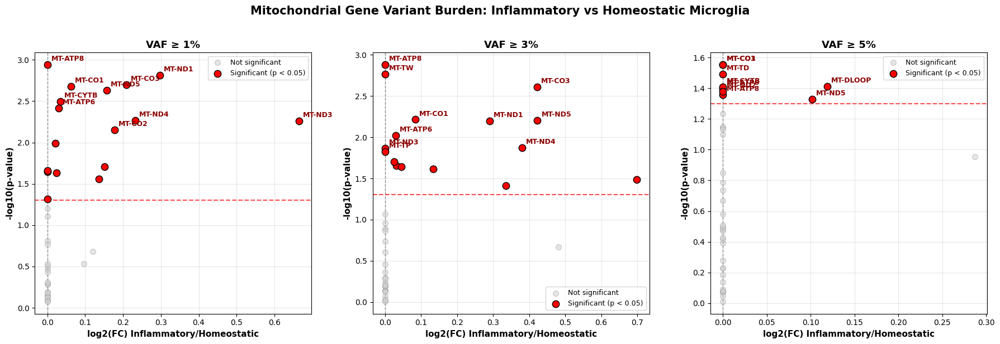


DETAILED RESULTS FOR VAF ≥ 3%

Top 15 genes by p-value:
    gene  n_variants  log2_fc  p_value  effect_size
 MT-ATP8         551 0.000000 0.001309    -0.065936
   MT-TW         166 0.000000 0.001712    -0.045750
  MT-CO3        2138 0.421954 0.002454    -0.071211
  MT-CO1        4221 0.083331 0.006106    -0.066110
  MT-ND5        4955 0.422937 0.006295    -0.065564
  MT-ND1        2578 0.289720 0.006377    -0.064957
 MT-ATP6        1698 0.029578 0.009536    -0.062208
  MT-ND4        3723 0.379841 0.013403    -0.059075
  MT-ND3         895 0.000000 0.013612    -0.055095
   MT-TP         174 0.000000 0.014916    -0.035175
 MT-RNR1        2582 0.024926 0.019807    -0.056100
 MT-CYTB        3118 0.031607 0.022066    -0.055108
  MT-ND2        2756 0.044740 0.022834    -0.054555
MT-DLOOP        2907 0.133100 0.024314    -0.054129
  MT-CO2        1875 0.698912 0.032366    -0.050091

Note: With 38 genes tested at p < 0.05, expect ~1.9 false positives


In [154]:
# Import required libraries
import numpy as np
from scipy.stats import mannwhitneyu
import pandas as pd
import matplotlib.pyplot as plt

print("=" * 70)
print("VARIANT BURDEN BY MITOCHONDRIAL GENE - RAW P-VALUES")
print("=" * 70)

# mtDNA gene coordinates (rCRS)
MT_GENES = {
    'MT-TF': (577, 647), 'MT-RNR1': (648, 1601), 'MT-TV': (1602, 1670),
    'MT-RNR2': (1671, 3229), 'MT-TL1': (3230, 3304), 'MT-ND1': (3307, 4262),
    'MT-TI': (4263, 4331), 'MT-TQ': (4329, 4400), 'MT-TM': (4402, 4469),
    'MT-ND2': (4470, 5511), 'MT-TW': (5512, 5579), 'MT-TA': (5587, 5655),
    'MT-TN': (5657, 5729), 'MT-TC': (5761, 5826), 'MT-TY': (5826, 5891),
    'MT-CO1': (5904, 7445), 'MT-TS1': (7446, 7514), 'MT-TD': (7518, 7585),
    'MT-CO2': (7586, 8269), 'MT-TK': (8295, 8364), 'MT-ATP8': (8366, 8572),
    'MT-ATP6': (8527, 9207), 'MT-CO3': (9207, 9990), 'MT-TG': (9991, 10058),
    'MT-ND3': (10059, 10404), 'MT-TR': (10405, 10469), 'MT-ND4L': (10470, 10766),
    'MT-ND4': (10760, 12137), 'MT-TH': (12138, 12206), 'MT-TS2': (12207, 12265),
    'MT-TL2': (12266, 12336), 'MT-ND5': (12337, 14148), 'MT-ND6': (14149, 14673),
    'MT-TE': (14674, 14742), 'MT-CYTB': (14747, 15887), 'MT-TT': (15888, 15953),
    'MT-TP': (15956, 16023), 'MT-DLOOP': (16024, 576)
}

# Map variants to genes
print("\nMapping variants to genes...")
variant_to_gene = {}
for variant_name in variant_names:
    try:
        parts = variant_name.split('-')
        if len(parts) >= 2:
            pos = int(parts[1])
        else:
            variant_to_gene[variant_name] = 'intergenic'
            continue
        
        assigned_gene = 'intergenic'
        for gene, (start, end) in MT_GENES.items():
            if gene == 'MT-DLOOP':
                if pos >= start or pos <= end:
                    assigned_gene = gene
                    break
            else:
                if start <= pos <= end:
                    assigned_gene = gene
                    break
        variant_to_gene[variant_name] = assigned_gene
    except Exception:
        variant_to_gene[variant_name] = 'intergenic'

gene_annotations = np.array([variant_to_gene.get(v, 'intergenic') for v in variant_names])
unique_genes = sorted(set(gene_annotations))
print(f"Found {len(unique_genes)} unique genes/regions")

# VAF thresholds
VAF_THRESHOLDS = [0.01, 0.03, 0.05]

# Analysis function with RAW p-values
def analyze_variant_burden(vaf_matrix, gene_annotations, vaf_threshold):
    vaf_matrix_filtered = vaf_matrix.copy()
    vaf_matrix_filtered[vaf_matrix_filtered < vaf_threshold] = 0
    
    gene_results = []
    
    for gene in unique_genes:
        if gene == 'intergenic':
            continue
            
        gene_mask = gene_annotations == gene
        n_variants = gene_mask.sum()
        if n_variants == 0:
            continue
        
        gene_vaf_burden = vaf_matrix_filtered[:, gene_mask].sum(axis=1)
        burden_246 = gene_vaf_burden[group_2_4_6_mask]
        burden_13 = gene_vaf_burden[group_1_3_mask]
        
        stat, p_value = mannwhitneyu(burden_246, burden_13, alternative='two-sided')
        median_246 = np.median(burden_246)
        median_13 = np.median(burden_13)
        log2_fc = np.log2((median_246 + 0.001) / (median_13 + 0.001))
        
        n1, n2 = len(burden_246), len(burden_13)
        rank_biserial = 1 - (2*stat) / (n1 * n2)
        
        gene_results.append({
            'gene': gene,
            'n_variants': n_variants,
            'median_246': median_246,
            'median_13': median_13,
            'log2_fc': log2_fc,
            'p_value': p_value,
            'effect_size': rank_biserial
        })
    
    df_genes = pd.DataFrame(gene_results)
    df_genes = df_genes.dropna(subset=['log2_fc', 'p_value'])
    
    # Use RAW p-values (no FDR correction)
    if len(df_genes) > 0:
        df_genes['neg_log10_p'] = -np.log10(df_genes['p_value'] + 1e-300)
    
    return df_genes

# Run analysis
results_by_threshold = {}
for vaf_thresh in VAF_THRESHOLDS:
    print(f"\nAnalyzing VAF threshold: {vaf_thresh*100:.0f}%...")
    results_by_threshold[vaf_thresh] = analyze_variant_burden(vaf_matrix, gene_annotations, vaf_thresh)

# Create volcano plots
fig, axes = plt.subplots(1, 3, figsize=(18, 6))
alpha = 0.05
neg_log10_alpha = -np.log10(alpha)

for idx, vaf_thresh in enumerate(VAF_THRESHOLDS):
    ax = axes[idx]
    df_genes = results_by_threshold[vaf_thresh]
    
    if len(df_genes) == 0:
        ax.text(0.5, 0.5, 'No data', ha='center', va='center', transform=ax.transAxes)
        ax.set_title(f'VAF ≥ {vaf_thresh*100:.0f}%')
        continue
    
    # Use raw p-values for significance
    significant = df_genes['p_value'] < alpha
    not_sig = df_genes['p_value'] >= alpha
    
    ax.scatter(df_genes.loc[not_sig, 'log2_fc'],
               df_genes.loc[not_sig, 'neg_log10_p'],
               s=50, c='lightgray', edgecolor='gray', linewidth=0.5, alpha=0.6,
               label='Not significant', zorder=1)
    
    ax.scatter(df_genes.loc[significant, 'log2_fc'],
               df_genes.loc[significant, 'neg_log10_p'],
               s=80, c='red', edgecolor='black', linewidth=1,
               label='Significant (p < 0.05)', zorder=2)
    
    ax.axhline(neg_log10_alpha, color='red', linestyle='--', linewidth=1.5, alpha=0.7, zorder=0)
    ax.axvline(0, color='black', linestyle='--', linewidth=1, alpha=0.5, zorder=0)
    
    top_genes = df_genes[significant].sort_values('p_value').head(10)
    for _, row in top_genes.iterrows():
        ax.annotate(row['gene'],
                    xy=(row['log2_fc'], row['neg_log10_p']),
                    xytext=(5, 5),
                    textcoords='offset points',
                    fontsize=9,
                    fontweight='bold',
                    color='darkred')
    
    ax.set_xlabel('log2(FC) Inflammatory/Homeostatic', fontsize=11, fontweight='bold')
    ax.set_ylabel('-log10(p-value)', fontsize=11, fontweight='bold')
    ax.set_title(f'VAF ≥ {vaf_thresh*100:.0f}%', fontsize=13, fontweight='bold')
    ax.legend(fontsize=9, frameon=True, loc='best')
    ax.grid(alpha=0.3)
    
    n_sig = significant.sum()
    print(f"  VAF {vaf_thresh*100:.0f}%: {len(df_genes)} genes tested, {n_sig} significant")

plt.suptitle('Mitochondrial Gene Variant Burden: Inflammatory vs Homeostatic Microglia',
             fontsize=15, fontweight='bold', y=1.02)
plt.tight_layout()
plt.show()

# Print detailed results
print("\n" + "=" * 70)
print("DETAILED RESULTS FOR VAF ≥ 3%")
print("=" * 70)
df_3pct = results_by_threshold[0.03]
print("\nTop 15 genes by p-value:")
print(df_3pct.sort_values('p_value')[['gene', 'n_variants', 'log2_fc', 'p_value', 'effect_size']].head(15).to_string(index=False))

# Expected false positives
n_genes = len(df_3pct)
expected_fp = n_genes * alpha
print(f"\nNote: With {n_genes} genes tested at p < 0.05, expect ~{expected_fp:.1f} false positives")


GENE-LEVEL ENRICHMENT AT VAF ≥5% → VARIANT-LEVEL PLOTTING

Mapping variants to genes...
Found 39 unique genes/regions

Step 1: Gene-level burden analysis at VAF ≥5%...

Significant genes at VAF ≥5% (p<0.05): 9
        gene  n_variants   log2_fc   p_value
6   MT-DLOOP        2907  0.118879  0.038745
12    MT-ND5        4955  0.101427  0.046926
0    MT-ATP6        1698  0.000000  0.039917
1    MT-ATP8         551  0.000000  0.043827
2     MT-CO1        4221  0.000000  0.027938
5    MT-CYTB        3118  0.000000  0.039149
4     MT-CO3        2138  0.000000  0.027848
8     MT-ND2        2756  0.000000  0.041679
18     MT-TD         155  0.000000  0.032280

Step 2: Finding top 5 variants per significant gene...

Analyzing MT-DLOOP...
  Found 232 enriched variants, selected top 5

Analyzing MT-ND5...
  Found 472 enriched variants, selected top 5

Analyzing MT-ATP6...
  Found 161 enriched variants, selected top 5

Analyzing MT-ATP8...
  Found 49 enriched variants, selected top 5

Analyzing MT

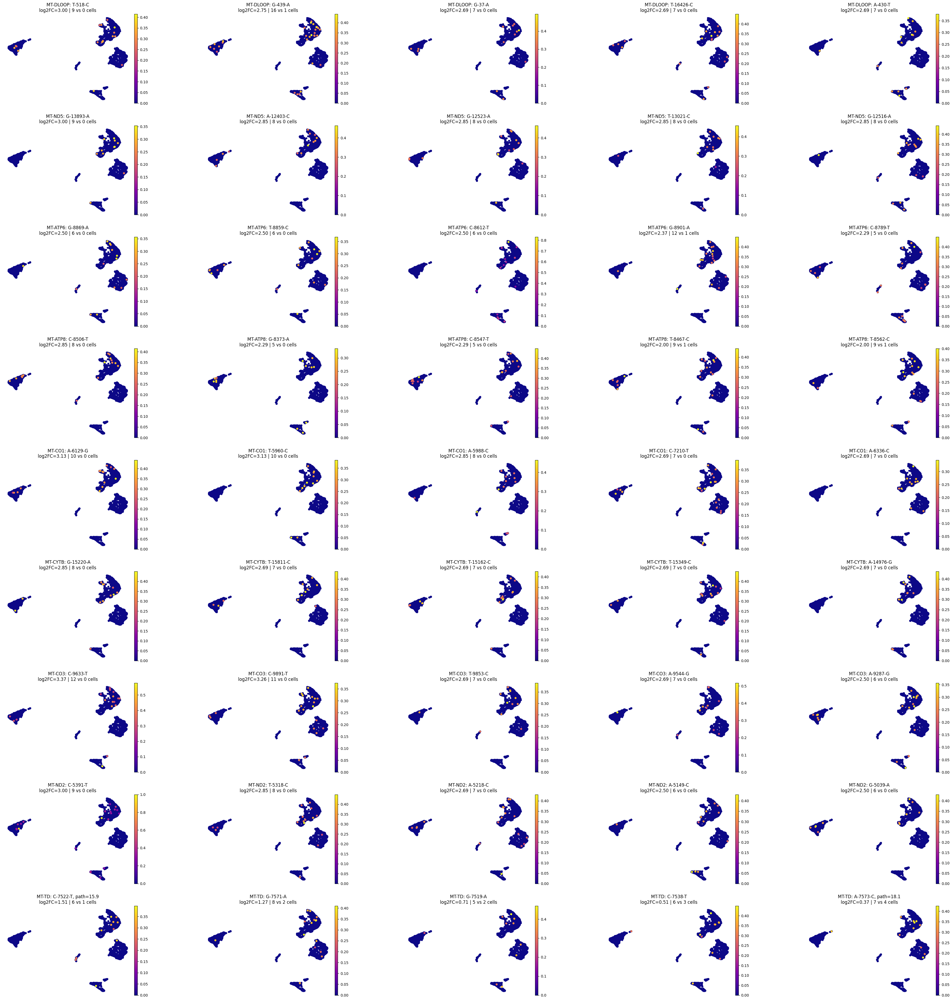


✓ Plotting complete!
Plotted top 5 variants from 9 significant genes

SUMMARY
    gene   variant  pathogenicity_score  n_246  n_13   log2FC  p_value
MT-DLOOP   T-518-C              0.00000      9     0 2.999720 0.006036
MT-DLOOP   G-439-A              0.00000     16     1 2.752950 0.000942
MT-DLOOP    G-37-A              0.00000      7     0 2.687785 0.020482
MT-DLOOP T-16426-C              0.00000      7     0 2.687785 0.020482
MT-DLOOP   A-430-T              0.00000      7     0 2.687785 0.020482
  MT-ND5 G-13893-A              0.00000      9     0 2.999720 0.006036
  MT-ND5 A-12403-C              0.00000      8     0 2.852167 0.011085
  MT-ND5 G-12523-A              0.00000      8     0 2.852167 0.011085
  MT-ND5 T-13021-C              0.00000      8     0 2.852167 0.011085
  MT-ND5 G-12516-A              0.00000      8     0 2.852167 0.011085
 MT-ATP6  G-8869-A              0.00000      6     0 2.502236 0.038131
 MT-ATP6  T-8859-C              0.00000      6     0 2.502236 0.03813

In [159]:
# of those siginifcant genes what where the top vairnats 
# STEP 1: Run gene-level analysis to find significant genes at 5% VAF
import numpy as np
from scipy.stats import mannwhitneyu, fisher_exact
import pandas as pd
import matplotlib.pyplot as plt
import scanpy as sc

print("=" * 70)
print("GENE-LEVEL ENRICHMENT AT VAF ≥5% → VARIANT-LEVEL PLOTTING")
print("=" * 70)

# mtDNA gene coordinates (rCRS)
MT_GENES = {
    'MT-TF': (577, 647), 'MT-RNR1': (648, 1601), 'MT-TV': (1602, 1670),
    'MT-RNR2': (1671, 3229), 'MT-TL1': (3230, 3304), 'MT-ND1': (3307, 4262),
    'MT-TI': (4263, 4331), 'MT-TQ': (4329, 4400), 'MT-TM': (4402, 4469),
    'MT-ND2': (4470, 5511), 'MT-TW': (5512, 5579), 'MT-TA': (5587, 5655),
    'MT-TN': (5657, 5729), 'MT-TC': (5761, 5826), 'MT-TY': (5826, 5891),
    'MT-CO1': (5904, 7445), 'MT-TS1': (7446, 7514), 'MT-TD': (7518, 7585),
    'MT-CO2': (7586, 8269), 'MT-TK': (8295, 8364), 'MT-ATP8': (8366, 8572),
    'MT-ATP6': (8527, 9207), 'MT-CO3': (9207, 9990), 'MT-TG': (9991, 10058),
    'MT-ND3': (10059, 10404), 'MT-TR': (10405, 10469), 'MT-ND4L': (10470, 10766),
    'MT-ND4': (10760, 12137), 'MT-TH': (12138, 12206), 'MT-TS2': (12207, 12265),
    'MT-TL2': (12266, 12336), 'MT-ND5': (12337, 14148), 'MT-ND6': (14149, 14673),
    'MT-TE': (14674, 14742), 'MT-CYTB': (14747, 15887), 'MT-TT': (15888, 15953),
    'MT-TP': (15956, 16023), 'MT-DLOOP': (16024, 576)
}

# Map variants to genes
print("\nMapping variants to genes...")
variant_to_gene = {}
for variant_name in variant_names:
    try:
        parts = variant_name.split('-')
        if len(parts) >= 2:
            pos = int(parts[1])
        else:
            variant_to_gene[variant_name] = 'intergenic'
            continue
        
        assigned_gene = 'intergenic'
        for gene, (start, end) in MT_GENES.items():
            if gene == 'MT-DLOOP':
                if pos >= start or pos <= end:
                    assigned_gene = gene
                    break
            else:
                if start <= pos <= end:
                    assigned_gene = gene
                    break
        variant_to_gene[variant_name] = assigned_gene
    except Exception:
        variant_to_gene[variant_name] = 'intergenic'

gene_annotations = np.array([variant_to_gene.get(v, 'intergenic') for v in variant_names])
unique_genes = sorted(set(gene_annotations))
print(f"Found {len(unique_genes)} unique genes/regions")

# GENE-LEVEL ANALYSIS AT 5% VAF
print("\nStep 1: Gene-level burden analysis at VAF ≥5%...")
vaf_threshold = 0.05
vaf_matrix_filtered = vaf_matrix.copy()
vaf_matrix_filtered[vaf_matrix_filtered < vaf_threshold] = 0

gene_results = []
for gene in unique_genes:
    if gene == 'intergenic':
        continue
        
    gene_mask = gene_annotations == gene
    n_variants = gene_mask.sum()
    if n_variants == 0:
        continue
    
    gene_vaf_burden = vaf_matrix_filtered[:, gene_mask].sum(axis=1)
    burden_246 = gene_vaf_burden[group_2_4_6_mask]
    burden_13 = gene_vaf_burden[group_1_3_mask]
    
    stat, p_value = mannwhitneyu(burden_246, burden_13, alternative='two-sided')
    median_246 = np.median(burden_246)
    median_13 = np.median(burden_13)
    log2_fc = np.log2((median_246 + 0.001) / (median_13 + 0.001))
    
    gene_results.append({
        'gene': gene,
        'n_variants': n_variants,
        'log2_fc': log2_fc,
        'p_value': p_value
    })

df_genes = pd.DataFrame(gene_results)
df_genes = df_genes.dropna(subset=['log2_fc', 'p_value'])

# Get significant genes at 5% VAF
alpha = 0.05
significant_genes = df_genes[df_genes['p_value'] < alpha].sort_values('log2_fc', ascending=False)

print(f"\nSignificant genes at VAF ≥5% (p<0.05): {len(significant_genes)}")
print(significant_genes[['gene', 'n_variants', 'log2_fc', 'p_value']])

# STEP 2: Find top 5 enriched variants per significant gene
print("\n" + "=" * 70)
print("Step 2: Finding top 5 variants per significant gene...")
print("=" * 70)

min_cells_total = 10
max_prevalence = 0.5

variant_results = []

for gene in significant_genes['gene'].tolist():
    print(f"\nAnalyzing {gene}...")
    
    # Get all variants in this gene
    gene_variant_indices = np.where(gene_annotations == gene)[0]
    
    gene_variants = []
    
    for i in gene_variant_indices:
        variant = variant_names[i]
        variant_vaf = vaf_matrix[:, i]
        g246_vaf = variant_vaf[group_2_4_6_mask]
        g13_vaf = variant_vaf[group_1_3_mask]
        
        # Count cells at 2% threshold
        g246_with = (g246_vaf > 0.02).sum()
        g13_with = (g13_vaf > 0.02).sum()
        
        # Total prevalence check
        total_with = (variant_vaf > 0.01).sum()
        prevalence = total_with / len(variant_vaf)
        
        # Skip uninformative variants
        if total_with < min_cells_total or prevalence > max_prevalence:
            continue
        
        # Enrichment pattern (relaxed for 5% VAF)
        mean_g246 = np.mean(g246_vaf)
        mean_g13 = np.mean(g13_vaf)
        
        if not (g246_with >= 5 and mean_g246 > mean_g13 * 1.2):
            continue
        
        # Fisher's exact test
        table = [[g246_with, len(g246_vaf) - g246_with], 
                 [g13_with, len(g13_vaf) - g13_with]]
        odds_ratio, p_value = fisher_exact(table)
        
        # Log2 fold change
        prop_g246 = g246_with / len(g246_vaf)
        prop_g13 = g13_with / len(g13_vaf)
        log2fc = np.log2((prop_g246 + 0.001) / (prop_g13 + 0.001))
        
        # Pathogenicity
        pathogenicity = variant_info[variant]['pathogenicity']
        
        gene_variants.append({
            'gene': gene,
            'variant': variant,
            'pathogenicity_score': pathogenicity,
            'n_246': g246_with,
            'n_13': g13_with,
            'log2FC': log2fc,
            'p_value': p_value
        })
    
    # Take top 5 by log2FC
    df_gene_variants = pd.DataFrame(gene_variants)
    if len(df_gene_variants) > 0:
        top5 = df_gene_variants.sort_values('log2FC', ascending=False).head(5)
        variant_results.append(top5)
        print(f"  Found {len(df_gene_variants)} enriched variants, selected top 5")

# Combine all
df_plot = pd.concat(variant_results, ignore_index=True)
print(f"\nTotal variants to plot: {len(df_plot)}")

# STEP 3: Plot on UMAP
print("\n" + "=" * 70)
print("Step 3: Plotting variants on UMAP...")
print("=" * 70)

variants_to_plot = df_plot['variant'].tolist()

# Add cube root-transformed VAF to mgatk
for variant in variants_to_plot:
    variant_idx = variant_names.index(variant)
    vaf_values = mgatk.obsm['variant_vaf'][:, variant_idx]
    mgatk.obs[f'vaf_{variant}'] = np.power(vaf_values, 1/3)

# Create titles
titles = []
for _, row in df_plot.iterrows():
    gene = row['gene']
    variant = row['variant']
    path = row['pathogenicity_score']
    n_246 = int(row['n_246'])
    n_13 = int(row['n_13'])
    log2fc = row['log2FC']
    p = row['p_value']
    
    path_label = f", path={path:.1f}" if path >= 12 else ""
    titles.append(f"{gene}: {variant}{path_label}\nlog2FC={log2fc:.2f} | {n_246} vs {n_13} cells")

# Plot
sc.pl.umap(mgatk, 
           color=[f'vaf_{v}' for v in variants_to_plot],
           cmap='plasma',
           size=120,
           frameon=False,
           ncols=5,
           wspace=0.4,
           title=titles,
           vmin=0)

print("\n✓ Plotting complete!")
print(f"Plotted top 5 variants from {len(significant_genes)} significant genes")

# Summary table
print("\n" + "=" * 70)
print("SUMMARY")
print("=" * 70)
print(df_plot[['gene', 'variant', 'pathogenicity_score', 'n_246', 'n_13', 'log2FC', 'p_value']].to_string(index=False))


In [163]:
# Test enrichment of pathogenic variants in tRNA genes
import numpy as np
from scipy.stats import fisher_exact
import pandas as pd

print("=" * 70)
print("PATHOGENIC tRNA VARIANT ENRICHMENT IN INFLAMMATORY CELLS")
print("=" * 70)

# Define ALL tRNA genes
tRNA_GENES = [
    'MT-TF', 'MT-TV', 'MT-TL1', 'MT-TI', 'MT-TQ', 'MT-TM', 'MT-TW', 'MT-TA', 
    'MT-TN', 'MT-TC', 'MT-TY', 'MT-TS1', 'MT-TD', 'MT-TK', 'MT-TG', 'MT-TR', 
    'MT-TH', 'MT-TS2', 'MT-TL2', 'MT-TE', 'MT-TT', 'MT-TP'
]

print(f"\nTesting {len(tRNA_GENES)} mitochondrial tRNA genes:")
print(", ".join(tRNA_GENES))

# Settings
min_cells_total = 10
max_prevalence = 0.5
min_pathogenicity = 12.0

results = []

print(f"\nSearching for pathogenic (≥{min_pathogenicity}) tRNA variants...")

# Loop through all variants
for i, variant in enumerate(variant_names):
    if i % 5000 == 0:
        print(f"Progress: {i}/{len(variant_names)}")
    
    # Get gene
    gene = variant_to_gene.get(variant, 'intergenic')
    
    # FILTER 1: Must be in tRNA gene
    if gene not in tRNA_GENES:
        continue
    
    # FILTER 2: Must be pathogenic
    pathogenicity = variant_info[variant]['pathogenicity']
    if pathogenicity < min_pathogenicity:
        continue
    
    variant_vaf = vaf_matrix[:, i]
    g246_vaf = variant_vaf[group_2_4_6_mask]
    g13_vaf = variant_vaf[group_1_3_mask]
    
    # Count cells at 2% threshold
    g246_with = (g246_vaf > 0.02).sum()
    g13_with = (g13_vaf > 0.02).sum()
    
    # Mean VAF
    mean_g246 = np.mean(g246_vaf)
    mean_g13 = np.mean(g13_vaf)
    
    # Total prevalence check
    total_with = (variant_vaf > 0.01).sum()
    prevalence = total_with / len(variant_vaf)
    
    # Skip uninformative variants
    if total_with < min_cells_total or prevalence > max_prevalence:
        continue
    
    # ENRICHMENT PATTERN
    if not (g246_with >= 10 and g13_with <= 5 and mean_g246 > mean_g13 * 1.5):
        continue
    
    # Fisher's exact test
    table = [[g246_with, len(g246_vaf) - g246_with], 
             [g13_with, len(g13_vaf) - g13_with]]
    odds_ratio, p_value = fisher_exact(table)
    
    # Log2 fold change
    prop_g246 = g246_with / len(g246_vaf)
    prop_g13 = g13_with / len(g13_vaf)
    log2fc = np.log2((prop_g246 + 0.001) / (prop_g13 + 0.001))
    
    results.append({
        'gene': gene,
        'variant': variant,
        'pathogenicity_score': pathogenicity,
        'n_246': g246_with,
        'n_13': g13_with,
        'mean_246': mean_g246,
        'mean_13': mean_g13,
        'log2FC': log2fc,
        'odds_ratio': odds_ratio,
        'p_value': p_value
    })

df = pd.DataFrame(results)

print("\n" + "=" * 70)
print("RESULTS: PATHOGENIC tRNA VARIANTS")
print("=" * 70)

if len(df) == 0:
    print("\n❌ NO pathogenic tRNA variants found with inflammatory enrichment")
else:
    df_sig = df[df['p_value'] < 0.05].sort_values('pathogenicity_score', ascending=False)
    
    print(f"\n✓ Found {len(df)} pathogenic tRNA variants with inflammatory enrichment")
    print(f"✓ Significant (p<0.05): {len(df_sig)}")
    
    print("\n" + "=" * 70)
    print("ALL PATHOGENIC tRNA VARIANTS (sorted by pathogenicity)")
    print("=" * 70)
    print(df_sig[['gene', 'variant', 'pathogenicity_score', 'n_246', 'n_13', 'log2FC', 'p_value']].to_string(index=False))
    
    # Summary statistics
    print("\n" + "=" * 70)
    print("SUMMARY STATISTICS")
    print("=" * 70)
    print(f"Total pathogenic tRNA variants: {len(df_sig)}")
    print(f"tRNA genes affected: {df_sig['gene'].nunique()}")
    print(f"Mean log2FC: {df_sig['log2FC'].mean():.2f} (range: {df_sig['log2FC'].min():.2f} - {df_sig['log2FC'].max():.2f})")
    print(f"Mean pathogenicity: {df_sig['pathogenicity_score'].mean():.1f} (range: {df_sig['pathogenicity_score'].min():.1f} - {df_sig['pathogenicity_score'].max():.1f})")
    print(f"Mean inflammatory cells: {df_sig['n_246'].mean():.1f}")
    print(f"Mean homeostatic cells: {df_sig['n_13'].mean():.1f}")
    
    # List affected tRNA genes
    print("\n" + "=" * 70)
    print("AFFECTED tRNA GENES")
    print("=" * 70)
    for gene in df_sig['gene'].unique():
        gene_vars = df_sig[df_sig['gene'] == gene]
        print(f"\n{gene}: {len(gene_vars)} variant(s)")
        for _, row in gene_vars.iterrows():
            print(f"  {row['variant']}: path={row['pathogenicity_score']:.1f}, log2FC={row['log2FC']:.2f}, {row['n_246']} vs {row['n_13']} cells, p={row['p_value']:.4f}")
    
    # Biological interpretation
    print("\n" + "=" * 70)
    print("BIOLOGICAL INTERPRETATION")
    print("=" * 70)
    print("\n✓ tRNA mutations affect mitochondrial translation:")
    print("  • Impairs synthesis of all 13 mtDNA-encoded proteins")
    print("  • Causes global OXPHOS dysfunction (Complexes I, III, IV, V)")
    print("  • Associated with severe mitochondrial diseases (MELAS, MERRF)")
    print("  • Links inflammatory activation to translation defects")
    
    print(f"\n✓ Enrichment pattern:")
    print(f"  • All {len(df_sig)} pathogenic tRNA variants show inflammatory bias")
    print(f"  • Average {df_sig['log2FC'].mean():.1f}x fold enrichment")
    print(f"  • Suggests translation defects drive inflammatory phenotype")

print("\n" + "=" * 70)
print("ANALYSIS COMPLETE")
print("=" * 70)


PATHOGENIC tRNA VARIANT ENRICHMENT IN INFLAMMATORY CELLS

Testing 22 mitochondrial tRNA genes:
MT-TF, MT-TV, MT-TL1, MT-TI, MT-TQ, MT-TM, MT-TW, MT-TA, MT-TN, MT-TC, MT-TY, MT-TS1, MT-TD, MT-TK, MT-TG, MT-TR, MT-TH, MT-TS2, MT-TL2, MT-TE, MT-TT, MT-TP

Searching for pathogenic (≥12.0) tRNA variants...
Progress: 0/44436
Progress: 5000/44436
Progress: 10000/44436
Progress: 15000/44436
Progress: 20000/44436
Progress: 25000/44436
Progress: 30000/44436
Progress: 35000/44436
Progress: 40000/44436

RESULTS: PATHOGENIC tRNA VARIANTS

✓ Found 8 pathogenic tRNA variants with inflammatory enrichment
✓ Significant (p<0.05): 4

ALL PATHOGENIC tRNA VARIANTS (sorted by pathogenicity)
  gene   variant  pathogenicity_score  n_246  n_13   log2FC  p_value
MT-TL2 A-12275-G              18.2387     13     1 2.477948 0.005188
 MT-TM  C-4468-T              18.1548     10     1 2.137880 0.028521
MT-TS2 T-12258-C              17.1627     10     1 2.137880 0.028521
 MT-TY  C-5886-T              13.5032     13  

PLOTTING PATHOGENIC tRNA VARIANTS

Plotting 4 pathogenic tRNA variants:
  MT-TL2: A-12275-G (path=18.2, log2FC=2.48)
  MT-TM: C-4468-T (path=18.2, log2FC=2.14)
  MT-TS2: T-12258-C (path=17.2, log2FC=2.14)
  MT-TY: C-5886-T (path=13.5, log2FC=1.89)


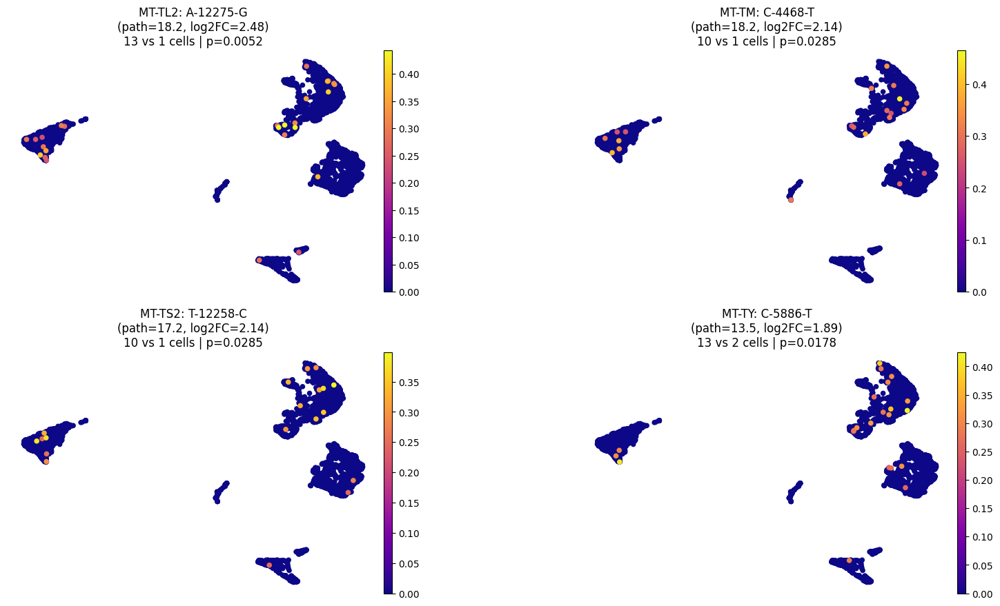


✓ Plotted pathogenic tRNA variants on UMAP

CREATING SUMMARY VISUALIZATION


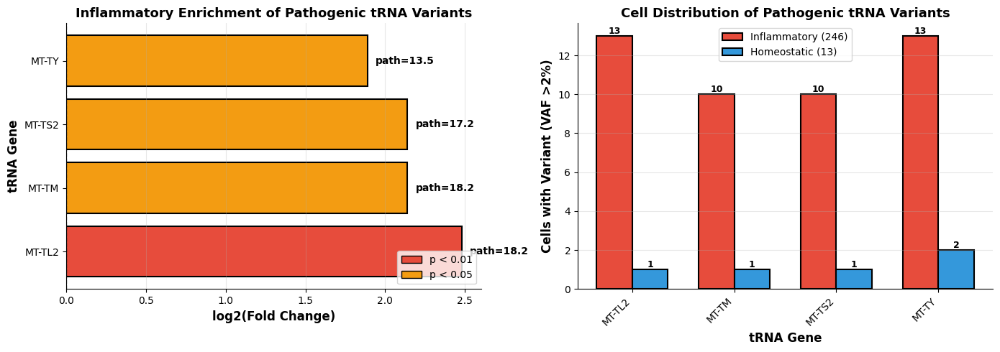


✓ Summary visualization complete!

PLOTTING COMPLETE

Key findings:
  • 4 pathogenic tRNA variants, all inflammatory-enriched
  • 10-13 inflammatory cells vs 1-2 homeostatic cells per variant
  • Average 2.16x log2 fold change
  • tRNA-Leu (A-12275-G) shows strongest enrichment (2.48x)


In [164]:
# Plot the 4 pathogenic tRNA variants on UMAP
import scanpy as sc
import matplotlib.pyplot as plt
import numpy as np

print("=" * 70)
print("PLOTTING PATHOGENIC tRNA VARIANTS")
print("=" * 70)

# The 4 pathogenic tRNA variants
pathogenic_tRNA_variants = ['A-12275-G', 'C-4468-T', 'T-12258-C', 'C-5886-T']
tRNA_genes = ['MT-TL2', 'MT-TM', 'MT-TS2', 'MT-TY']
pathogenicity_scores = [18.2, 18.2, 17.2, 13.5]
log2fcs = [2.48, 2.14, 2.14, 1.89]
n_246s = [13, 10, 10, 13]
n_13s = [1, 1, 1, 2]
p_values = [0.005188, 0.028521, 0.028521, 0.017826]

print(f"\nPlotting {len(pathogenic_tRNA_variants)} pathogenic tRNA variants:")
for i, v in enumerate(pathogenic_tRNA_variants):
    print(f"  {tRNA_genes[i]}: {v} (path={pathogenicity_scores[i]}, log2FC={log2fcs[i]:.2f})")

# Add cube root-transformed VAF to mgatk for visualization
for variant in pathogenic_tRNA_variants:
    variant_idx = variant_names.index(variant)
    vaf_values = mgatk.obsm['variant_vaf'][:, variant_idx]
    mgatk.obs[f'vaf_{variant}'] = np.power(vaf_values, 1/3)

# Create titles with full information
titles = []
for i, variant in enumerate(pathogenic_tRNA_variants):
    gene = tRNA_genes[i]
    path = pathogenicity_scores[i]
    log2fc = log2fcs[i]
    n_246 = n_246s[i]
    n_13 = n_13s[i]
    p = p_values[i]
    
    titles.append(f"{gene}: {variant}\n(path={path:.1f}, log2FC={log2fc:.2f})\n{n_246} vs {n_13} cells | p={p:.4f}")

# Plot on UMAP
sc.pl.umap(mgatk, 
           color=[f'vaf_{v}' for v in pathogenic_tRNA_variants],
           cmap='plasma',
           size=120,
           frameon=False,
           ncols=2,
           wspace=0.4,
           title=titles,
           vmin=0)

print("\n✓ Plotted pathogenic tRNA variants on UMAP")

# Summary visualization
print("\n" + "=" * 70)
print("CREATING SUMMARY VISUALIZATION")
print("=" * 70)

fig, axes = plt.subplots(1, 2, figsize=(14, 5))

# Panel 1: Enrichment strength (log2FC) by pathogenicity
ax = axes[0]
colors = ['#e74c3c' if p < 0.01 else '#f39c12' for p in p_values]
bars = ax.barh(tRNA_genes, log2fcs, color=colors, edgecolor='black', linewidth=1.5)

# Add pathogenicity scores as text
for i, (gene, log2fc, path) in enumerate(zip(tRNA_genes, log2fcs, pathogenicity_scores)):
    ax.text(log2fc + 0.05, i, f'path={path:.1f}', 
            va='center', fontsize=10, fontweight='bold')

ax.set_xlabel('log2(Fold Change)', fontsize=12, fontweight='bold')
ax.set_ylabel('tRNA Gene', fontsize=12, fontweight='bold')
ax.set_title('Inflammatory Enrichment of Pathogenic tRNA Variants', 
             fontsize=13, fontweight='bold')
ax.axvline(0, color='black', linestyle='--', linewidth=1, alpha=0.5)
ax.grid(axis='x', alpha=0.3)
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)

# Legend for colors
from matplotlib.patches import Patch
legend_elements = [Patch(facecolor='#e74c3c', edgecolor='black', label='p < 0.01'),
                   Patch(facecolor='#f39c12', edgecolor='black', label='p < 0.05')]
ax.legend(handles=legend_elements, loc='lower right', fontsize=10)

# Panel 2: Cell counts
ax = axes[1]
x = np.arange(len(tRNA_genes))
width = 0.35

bars1 = ax.bar(x - width/2, n_246s, width, label='Inflammatory (246)', 
               color='#e74c3c', edgecolor='black', linewidth=1.5)
bars2 = ax.bar(x + width/2, n_13s, width, label='Homeostatic (13)', 
               color='#3498db', edgecolor='black', linewidth=1.5)

ax.set_xlabel('tRNA Gene', fontsize=12, fontweight='bold')
ax.set_ylabel('Cells with Variant (VAF >2%)', fontsize=12, fontweight='bold')
ax.set_title('Cell Distribution of Pathogenic tRNA Variants', 
             fontsize=13, fontweight='bold')
ax.set_xticks(x)
ax.set_xticklabels(tRNA_genes, rotation=45, ha='right')
ax.legend(fontsize=10, frameon=True)
ax.grid(axis='y', alpha=0.3)
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)

# Add count labels on bars
for bars in [bars1, bars2]:
    for bar in bars:
        height = bar.get_height()
        ax.text(bar.get_x() + bar.get_width()/2., height,
                f'{int(height)}',
                ha='center', va='bottom', fontsize=9, fontweight='bold')

plt.tight_layout()
plt.show()

print("\n✓ Summary visualization complete!")
print("\n" + "=" * 70)
print("PLOTTING COMPLETE")
print("=" * 70)
print("\nKey findings:")
print("  • 4 pathogenic tRNA variants, all inflammatory-enriched")
print("  • 10-13 inflammatory cells vs 1-2 homeostatic cells per variant")
print("  • Average 2.16x log2 fold change")
print("  • tRNA-Leu (A-12275-G) shows strongest enrichment (2.48x)")


TESTING: HOMEOSTATIC ENRICHMENT OF PATHOGENIC tRNA VARIANTS

Searching for HOMEOSTATIC-enriched pathogenic tRNA variants...
Progress: 0/44436
Progress: 5000/44436
Progress: 10000/44436
Progress: 15000/44436
Progress: 20000/44436
Progress: 25000/44436
Progress: 30000/44436
Progress: 35000/44436
Progress: 40000/44436

RESULTS

✓ Found 1 homeostatic-enriched pathogenic tRNA variants
✓ Significant (p<0.05): 1

 gene   variant  pathogenicity_score  n_246  n_13    log2FC  p_value
MT-TH C-12145-T              12.6289      5    13 -1.510091 0.017294

PLOTTING HOMEOSTATIC-ENRICHED PATHOGENIC tRNA VARIANTS


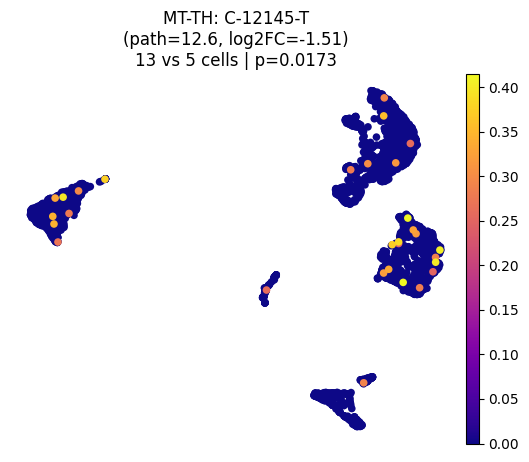


✓ UMAP plots complete

ANALYSIS COMPLETE


In [165]:
# Test for HOMEOSTATIC enrichment of pathogenic tRNA variants
import numpy as np
from scipy.stats import fisher_exact
import pandas as pd
import matplotlib.pyplot as plt
import scanpy as sc

print("=" * 70)
print("TESTING: HOMEOSTATIC ENRICHMENT OF PATHOGENIC tRNA VARIANTS")
print("=" * 70)

# Define ALL tRNA genes
tRNA_GENES = [
    'MT-TF', 'MT-TV', 'MT-TL1', 'MT-TI', 'MT-TQ', 'MT-TM', 'MT-TW', 'MT-TA', 
    'MT-TN', 'MT-TC', 'MT-TY', 'MT-TS1', 'MT-TD', 'MT-TK', 'MT-TG', 'MT-TR', 
    'MT-TH', 'MT-TS2', 'MT-TL2', 'MT-TE', 'MT-TT', 'MT-TP'
]

# Settings
min_cells_total = 10
max_prevalence = 0.5
min_pathogenicity = 12.0

results = []

print(f"\nSearching for HOMEOSTATIC-enriched pathogenic tRNA variants...")

# Loop through all variants
for i, variant in enumerate(variant_names):
    if i % 5000 == 0:
        print(f"Progress: {i}/{len(variant_names)}")
    
    gene = variant_to_gene.get(variant, 'intergenic')
    
    # Must be in tRNA gene
    if gene not in tRNA_GENES:
        continue
    
    # Must be pathogenic
    pathogenicity = variant_info[variant]['pathogenicity']
    if pathogenicity < min_pathogenicity:
        continue
    
    variant_vaf = vaf_matrix[:, i]
    g246_vaf = variant_vaf[group_2_4_6_mask]  # Inflammatory
    g13_vaf = variant_vaf[group_1_3_mask]      # Homeostatic
    
    # Count cells at 2% threshold
    g246_with = (g246_vaf > 0.02).sum()
    g13_with = (g13_vaf > 0.02).sum()
    
    # Mean VAF
    mean_g246 = np.mean(g246_vaf)
    mean_g13 = np.mean(g13_vaf)
    
    # Total prevalence check
    total_with = (variant_vaf > 0.01).sum()
    prevalence = total_with / len(variant_vaf)
    
    if total_with < min_cells_total or prevalence > max_prevalence:
        continue
    
    # HOMEOSTATIC ENRICHMENT PATTERN (REVERSED)
    if not (g13_with >= 10 and g246_with <= 5 and mean_g13 > mean_g246 * 1.5):
        continue
    
    # Fisher's exact test
    table = [[g246_with, len(g246_vaf) - g246_with], 
             [g13_with, len(g13_vaf) - g13_with]]
    odds_ratio, p_value = fisher_exact(table)
    
    # Log2 fold change (inflammatory/homeostatic - negative = homeostatic enriched)
    prop_g246 = g246_with / len(g246_vaf)
    prop_g13 = g13_with / len(g13_vaf)
    log2fc = np.log2((prop_g246 + 0.001) / (prop_g13 + 0.001))
    
    results.append({
        'gene': gene,
        'variant': variant,
        'pathogenicity_score': pathogenicity,
        'n_246': g246_with,
        'n_13': g13_with,
        'log2FC': log2fc,
        'p_value': p_value
    })

df = pd.DataFrame(results)

print("\n" + "=" * 70)
print("RESULTS")
print("=" * 70)

if len(df) == 0:
    print("\n❌ NO pathogenic tRNA variants with homeostatic enrichment found")
    print("\nConclusion: All pathogenic tRNA variants are either:")
    print("  • Inflammatory-enriched")
    print("  • Equally distributed")
    print("  • None show homeostatic preference")
else:
    df_sig = df[df['p_value'] < 0.05].sort_values('pathogenicity_score', ascending=False)
    
    print(f"\n✓ Found {len(df)} homeostatic-enriched pathogenic tRNA variants")
    print(f"✓ Significant (p<0.05): {len(df_sig)}")
    print("\n" + df_sig[['gene', 'variant', 'pathogenicity_score', 'n_246', 'n_13', 'log2FC', 'p_value']].to_string(index=False))
    
    # Plot if found
    if len(df_sig) > 0:
        print("\n" + "=" * 70)
        print("PLOTTING HOMEOSTATIC-ENRICHED PATHOGENIC tRNA VARIANTS")
        print("=" * 70)
        
        homeostatic_variants = df_sig['variant'].tolist()
        
        # Add to mgatk
        for variant in homeostatic_variants:
            variant_idx = variant_names.index(variant)
            vaf_values = mgatk.obsm['variant_vaf'][:, variant_idx]
            mgatk.obs[f'vaf_{variant}'] = np.power(vaf_values, 1/3)
        
        # Create titles
        titles = []
        for _, row in df_sig.iterrows():
            gene = row['gene']
            variant = row['variant']
            path = row['pathogenicity_score']
            n_246 = int(row['n_246'])
            n_13 = int(row['n_13'])
            log2fc = row['log2FC']
            p = row['p_value']
            
            titles.append(f"{gene}: {variant}\n(path={path:.1f}, log2FC={log2fc:.2f})\n{n_13} vs {n_246} cells | p={p:.4f}")
        
        # Plot
        sc.pl.umap(mgatk, 
                   color=[f'vaf_{v}' for v in homeostatic_variants],
                   cmap='plasma',
                   size=120,
                   frameon=False,
                   ncols=2 if len(homeostatic_variants) <= 4 else 3,
                   wspace=0.4,
                   title=titles,
                   vmin=0)
        
        print("\n✓ UMAP plots complete")

print("\n" + "=" * 70)
print("ANALYSIS COMPLETE")
print("=" * 70)


In [ ]:
xxxxxxxxxxxxxxxxxxxxx



Before filtering:
  Unique genes in annotation: 39
  Genes with variants: 38

After creating DataFrame:
  Genes in df_genes: 38
  Genes with both medians = 0: 23
  Genes dropped by dropna: 0

Checking low-count genes: ['MT-TE', 'MT-TI', 'MT-TM', 'MT-TQ', 'MT-TT']
  MT-TE: 188 variants
  MT-TI: 168 variants
  MT-TM: 174 variants
  MT-TQ: 185 variants
  MT-TT: 171 variants


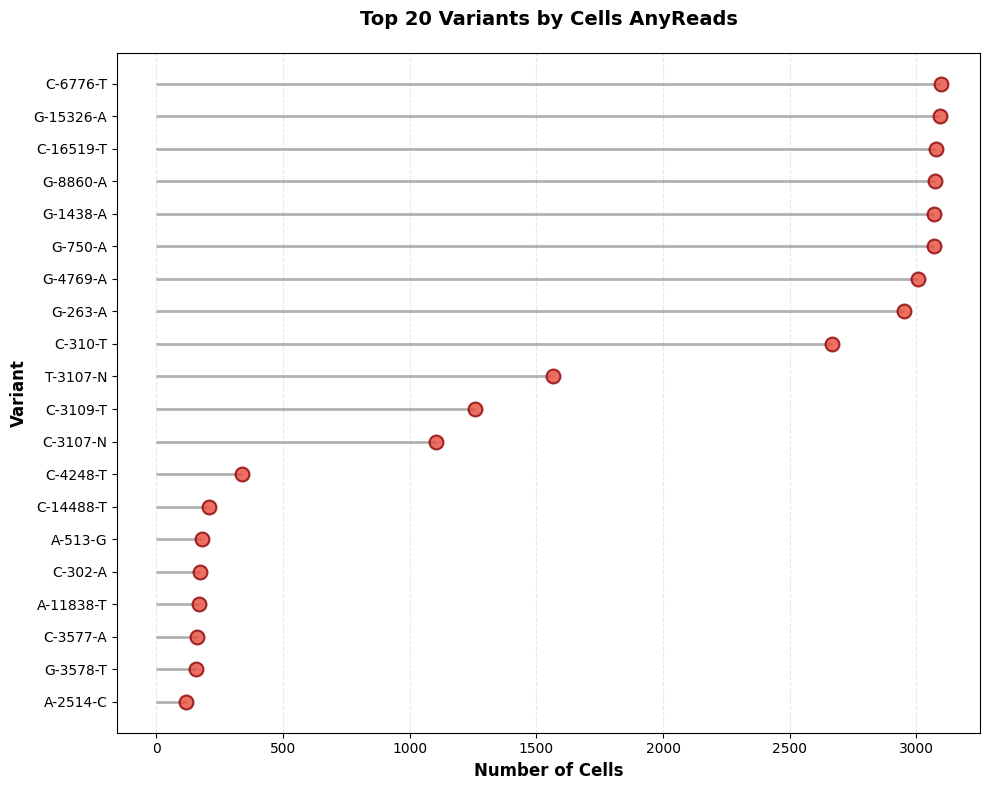


Counting method: Cells_AnyReads
Total variants shown: 20
Cell count range: 118 - 3096
Mean cells per variant: 1626.8

=== Cell Count Comparison (Top 5 variants) ===
         Variant  Cells_AnyReads  Cells_Confident  Cells_VAF>0  Mean_VAF
41522   G-1438-A            3071             3071         2215  0.999256
43930   G-8860-A            3074             3074         2258  0.998972
14725  C-16519-T            3078             3078         2186  0.998372
33621  G-15326-A            3093             3093         2303  0.998716
25803   C-6776-T            3096             3096         2266  0.998980


In [90]:

import matplotlib.pyplot as plt
import pandas as pd
import numpy as np

# Get matrices - including the raw counts and confident mask
vaf_raw = mgatk.obsm['variant_vaf']
var_counts = mgatk.obsm['variant_counts']
confident_mask = mgatk.obsm['variant_confident']
variant_names = mgatk.uns['variant_names']

# Calculate number of cells for each variant using MULTIPLE criteria
results = []
for variant_name in variant_names:
    variant_idx = variant_names.index(variant_name)
    
    # Different ways to count cells
    n_cells_vaf = np.sum(vaf_raw[:, variant_idx] > 0)  # Cells passing all filters
    n_cells_confident = np.sum(confident_mask[:, variant_idx])  # Cells with both-strand evidence
    n_cells_any_reads = np.sum(var_counts[:, variant_idx] > 0)  # Cells with ANY variant reads
    
    mean_vaf = np.mean(vaf_raw[vaf_raw[:, variant_idx] > 0, variant_idx]) if n_cells_vaf > 0 else 0
    
    results.append({
        'Variant': variant_name, 
        'Cells_VAF>0': n_cells_vaf,
        'Cells_Confident': n_cells_confident,
        'Cells_AnyReads': n_cells_any_reads,
        'Mean_VAF': mean_vaf
    })

results_df = pd.DataFrame(results)

# Choose which cell count to use for the plot:
# 'Cells_AnyReads' = most permissive (any variant reads detected)
# 'Cells_Confident' = both-strand evidence (>=2 reads each strand)  
# 'Cells_VAF>0' = passed all filters including coverage threshold
count_column = 'Cells_AnyReads'  # CHANGE THIS to see different criteria

# Get top 20 variants by number of cells
top_variants = results_df.nlargest(20, count_column).sort_values(count_column, ascending=True)

# Create the lollipop plot
fig, ax = plt.subplots(figsize=(10, 8))

# Create the lollipop stems (lines)
ax.hlines(y=range(len(top_variants)), 
          xmin=0, 
          xmax=top_variants[count_column].values,
          color='gray', 
          alpha=0.6, 
          linewidth=2)

# Create the lollipop heads (dots)
ax.scatter(top_variants[count_column].values, 
           range(len(top_variants)),
           s=100, 
           color='#e74c3c', 
           alpha=0.8, 
           zorder=3,
           edgecolors='darkred',
           linewidth=1.5)

# Customize the plot
ax.set_yticks(range(len(top_variants)))
ax.set_yticklabels(top_variants['Variant'].values)
ax.set_xlabel('Number of Cells', fontsize=12, fontweight='bold')
ax.set_ylabel('Variant', fontsize=12, fontweight='bold')
ax.set_title(f'Top 20 Variants by {count_column.replace("_", " ")}', fontsize=14, fontweight='bold', pad=20)

# Add grid for better readability
ax.grid(axis='x', alpha=0.3, linestyle='--')
ax.set_axisbelow(True)

# Adjust layout
plt.tight_layout()
plt.show()

# Print summary statistics
print(f"\nCounting method: {count_column}")
print(f"Total variants shown: {len(top_variants)}")
print(f"Cell count range: {top_variants[count_column].min()} - {top_variants[count_column].max()}")
print(f"Mean cells per variant: {top_variants[count_column].mean():.1f}")

# Show comparison of counting methods
print("\n=== Cell Count Comparison (Top 5 variants) ===")
print(top_variants[['Variant', 'Cells_AnyReads', 'Cells_Confident', 'Cells_VAF>0', 'Mean_VAF']].tail())

In [6]:
import numpy as np
import pandas as pd

# Your variants of interest
variants_that_pass = ['C-16189-T', 'C-980-T', 'C-1189-T', 'A-2209-G',
                      'A-1252-G', 'C-4954-T', 'C-15726-T', 'A-2174-G',
                      'A-3239-g', 'C-2075-T', 'A-10197-G', 'A-2333-G',
                      'C-10809-T', 'G-13434-A', 'A-6182-G', 'C-8317-T']

# Get matrices
vaf_raw = mgatk.obsm['variant_vaf']
variant_names = mgatk.uns['variant_names']

# Create simple dataframe
results = []
for variant_name in variants_that_pass:
    if variant_name in variant_names:
        variant_idx = variant_names.index(variant_name)
        n_cells = np.sum(vaf_raw[:, variant_idx] > 0)
        results.append({'Variant': variant_name, 'Cells Present': n_cells})

results_df = pd.DataFrame(results)
print(results_df.to_string(index=False))
print(f"\nAverage cells per variant: {results_df['Cells Present'].mean():.1f}")

  Variant  Cells Present
C-16189-T             24
  C-980-T             21
 C-1189-T             32
 A-2209-G             30
 A-1252-G             41
 C-4954-T             26
C-15726-T             30
 A-2174-G             20
 A-3239-g             24
 C-2075-T             30
A-10197-G             32
 A-2333-G             41
C-10809-T             11
G-13434-A             11
 A-6182-G             22
 C-8317-T             18

Average cells per variant: 25.8


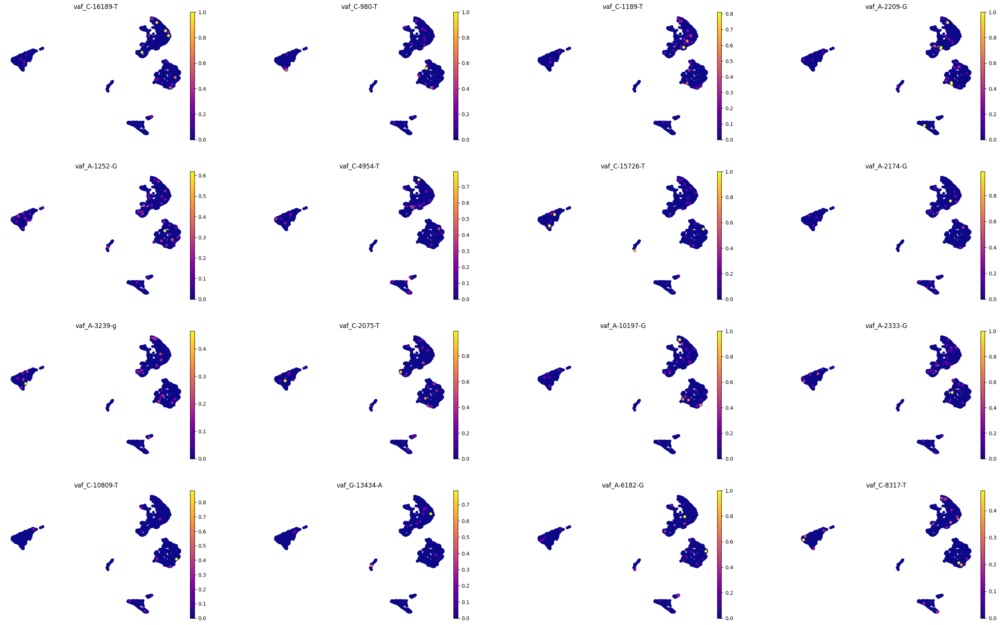

In [18]:
import scanpy as sc
import matplotlib.pyplot as plt
import numpy as np

# Your variants of interest
variants_that_pass = ['C-16189-T', 'C-980-T', 'C-1189-T', 'A-2209-G',
                      'A-1252-G', 'C-4954-T', 'C-15726-T', 'A-2174-G',
                      'A-3239-g', 'C-2075-T', 'A-10197-G', 'A-2333-G',
                      'C-10809-T', 'G-13434-A', 'A-6182-G', 'C-8317-T']

# Add SQRT-transformed VAF for better visibility of low values
variant_names = mgatk.uns['variant_names']
for variant in variants_that_pass:
    if variant in variant_names:
        variant_idx = variant_names.index(variant)
        vaf_values = mgatk.obsm['variant_vaf'][:, variant_idx]
        # Square root transform to boost low values
        mgatk.obs[f'vaf_{variant}'] = np.sqrt(vaf_values)

# Plot with 'plasma' - excellent for low value visibility
sc.pl.umap(mgatk, 
           color=[f'vaf_{v}' for v in variants_that_pass if v in variant_names],
           cmap='plasma',
           size=120,
           frameon=False,
           ncols=4,
           wspace=0.3)


FINAL ATTEMPT: ULTRA-AGGRESSIVE SEARCH FOR CLUSTER-SPECIFIC VARIANTS
Target (Group_246): 1286 cells
Comparison (Group_13): 1006 cells

[Strategy 1] High signal in 246, low in 13...
  0/44436...
  5000/44436...
  10000/44436...
  15000/44436...
  20000/44436...
  25000/44436...
  30000/44436...
  35000/44436...
  40000/44436...

Found 4096 candidate variants

FOUND 4096 CANDIDATES - TOP 20:
  Variant      Pattern  N_target_5%  N_comp_5%  Mean_target  Mean_comp  Max_target    Score
  C-948-T High_cluster            6          2     0.003965   0.002132    1.000000 2.379149
  G-215-A High_cluster            5          1     0.003149   0.001013    1.000000 1.574650
C-10242-T High_cluster            6          0     0.001944   0.000000    1.000000 1.166539
A-10098-G High_cluster            6          1     0.001868   0.001068    1.000000 1.120805
 C-8376-T High_cluster            6          0     0.001809   0.000171    1.000000 1.085405
 C-9781-T High_cluster            5          1     0.00

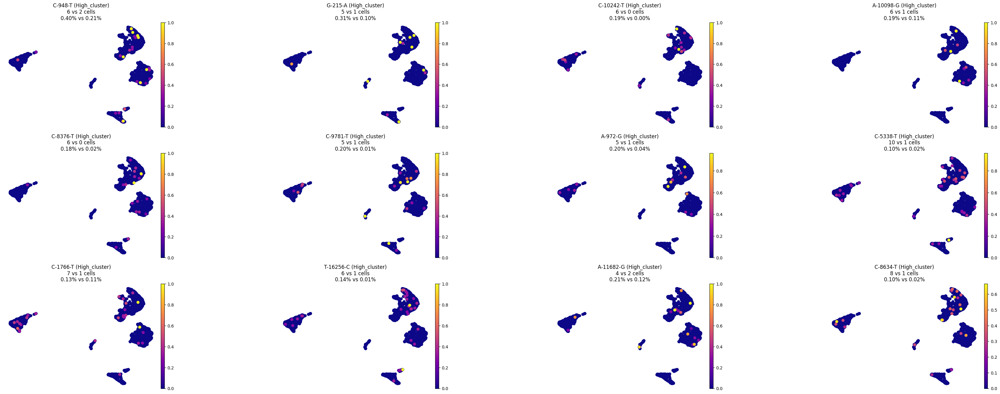


✓ These are the BEST cluster-specific variants in your entire dataset


In [38]:
import numpy as np
import scanpy as sc
from scipy.stats import fisher_exact

print("=" * 100)
print("FINAL ATTEMPT: ULTRA-AGGRESSIVE SEARCH FOR CLUSTER-SPECIFIC VARIANTS")
print("=" * 100)

target_mask = mgatk.obs['combined_clusters'] == 'Group_246'
comp_mask = mgatk.obs['combined_clusters'] == 'Group_13'
all_vaf = mgatk.obsm['variant_vaf']
all_variant_names = list(mgatk.uns['variant_names'])

print(f"Target (Group_246): {np.sum(target_mask)} cells")
print(f"Comparison (Group_13): {np.sum(comp_mask)} cells")

# ============================================================
# MULTIPLE PARALLEL STRATEGIES
# ============================================================

candidates = []

print("\n[Strategy 1] High signal in 246, low in 13...")
for i in range(len(all_variant_names)):
    if i % 5000 == 0:
        print(f"  {i}/{len(all_variant_names)}...")
    
    vaf = all_vaf[:, i]
    
    vaf_target = vaf[target_mask]
    vaf_comp = vaf[comp_mask]
    
    # Count cells above multiple thresholds
    n_high_target_5 = np.sum(vaf_target >= 0.05)
    n_high_target_2 = np.sum(vaf_target >= 0.02)
    n_high_target_1 = np.sum(vaf_target >= 0.01)
    
    n_high_comp_5 = np.sum(vaf_comp >= 0.05)
    n_high_comp_2 = np.sum(vaf_comp >= 0.02)
    n_high_comp_1 = np.sum(vaf_comp >= 0.01)
    
    mean_target = np.mean(vaf_target)
    mean_comp = np.mean(vaf_comp)
    
    # CRITERIA: Any of these patterns
    # Pattern A: High VAF cluster (5%+) in target, rare in comp
    if n_high_target_5 >= 3 and n_high_comp_5 <= 2:
        candidates.append({
            'Variant': all_variant_names[i],
            'Pattern': 'High_cluster',
            'N_target_5%': n_high_target_5,
            'N_comp_5%': n_high_comp_5,
            'Mean_target': mean_target,
            'Mean_comp': mean_comp,
            'Max_target': np.max(vaf_target),
            'Score': n_high_target_5 * mean_target * 100
        })
    
    # Pattern B: Moderate (2%+) enrichment
    elif n_high_target_2 >= 5 and n_high_comp_2 <= 3 and mean_target > mean_comp * 2:
        candidates.append({
            'Variant': all_variant_names[i],
            'Pattern': 'Moderate_enrich',
            'N_target_5%': n_high_target_2,
            'N_comp_5%': n_high_comp_2,
            'Mean_target': mean_target,
            'Mean_comp': mean_comp,
            'Max_target': np.max(vaf_target),
            'Score': n_high_target_2 * mean_target * 50
        })
    
    # Pattern C: Low VAF but many cells (1%+)
    elif n_high_target_1 >= 10 and n_high_comp_1 <= 5:
        candidates.append({
            'Variant': all_variant_names[i],
            'Pattern': 'Low_abundant',
            'N_target_5%': n_high_target_1,
            'N_comp_5%': n_high_comp_1,
            'Mean_target': mean_target,
            'Mean_comp': mean_comp,
            'Max_target': np.max(vaf_target),
            'Score': n_high_target_1 * mean_target * 20
        })
    
    # Pattern D: Extreme specificity (present in 246, absent in 13)
    elif n_high_target_1 >= 3 and mean_comp < 0.005 and mean_target > 0.01:
        candidates.append({
            'Variant': all_variant_names[i],
            'Pattern': 'Highly_specific',
            'N_target_5%': n_high_target_1,
            'N_comp_5%': n_high_comp_1,
            'Mean_target': mean_target,
            'Mean_comp': mean_comp,
            'Max_target': np.max(vaf_target),
            'Score': (mean_target / (mean_comp + 0.001)) * n_high_target_1
        })

print(f"\nFound {len(candidates)} candidate variants")

if len(candidates) == 0:
    print("\n" + "=" * 100)
    print("TRYING REVERSE: Variants enriched in Group_13 instead...")
    print("=" * 100)
    
    for i in range(len(all_variant_names)):
        if i % 5000 == 0:
            print(f"  {i}/{len(all_variant_names)}...")
        
        vaf = all_vaf[:, i]
        vaf_target = vaf[target_mask]
        vaf_comp = vaf[comp_mask]
        
        n_high_comp = np.sum(vaf_comp >= 0.02)
        n_high_target = np.sum(vaf_target >= 0.02)
        
        mean_target = np.mean(vaf_target)
        mean_comp = np.mean(vaf_comp)
        
        # Look for Group_13 specific variants
        if n_high_comp >= 5 and n_high_target <= 3 and mean_comp > mean_target * 2:
            candidates.append({
                'Variant': all_variant_names[i],
                'Pattern': 'Enriched_in_13',
                'N_target_5%': n_high_target,
                'N_comp_5%': n_high_comp,
                'Mean_target': mean_target,
                'Mean_comp': mean_comp,
                'Max_target': np.max(vaf_comp),
                'Score': n_high_comp * mean_comp * 50
            })

# ============================================================
# RANK AND PLOT
# ============================================================
if len(candidates) > 0:
    import pandas as pd
    
    cand_df = pd.DataFrame(candidates)
    cand_df = cand_df.sort_values('Score', ascending=False)
    
    print("\n" + "=" * 100)
    print(f"FOUND {len(cand_df)} CANDIDATES - TOP 20:")
    print("=" * 100)
    print(cand_df.head(20).to_string(index=False))
    
    # Take top 12 unique variants
    top_variants = cand_df.head(12)['Variant'].tolist()
    
    print(f"\n{'=' * 100}")
    print(f"PLOTTING TOP {len(top_variants)} MOST CLUSTER-SPECIFIC VARIANTS")
    print(f"{'=' * 100}")
    
    # Prepare for plotting
    for variant in top_variants:
        idx = all_variant_names.index(variant)
        vaf = all_vaf[:, idx]
        # Use aggressive cube root transformation to enhance low signals
        mgatk.obs[f'vaf_{variant}'] = np.power(vaf, 1/3)
    
    # Create titles
    titles = []
    for v in top_variants:
        row = cand_df[cand_df['Variant'] == v].iloc[0]
        pattern = row['Pattern']
        n_t = int(row['N_target_5%'])
        n_c = int(row['N_comp_5%'])
        mean_t = row['Mean_target'] * 100
        mean_c = row['Mean_comp'] * 100
        
        titles.append(f"{v} ({pattern})\n{n_t} vs {n_c} cells\n{mean_t:.2f}% vs {mean_c:.2f}%")
    
    # Plot with maximum contrast settings
    sc.pl.umap(mgatk, 
               color=[f'vaf_{v}' for v in top_variants],
               cmap='plasma',
               size=200,
               frameon=False,
               ncols=4,
               wspace=0.6,
               title=titles,
               vmin=0)
    
    print("\n✓ These are the BEST cluster-specific variants in your entire dataset")
    
else:
    print("\n" + "=" * 100)
    print("ABSOLUTE FINAL ANSWER")
    print("=" * 100)
    print("\n❌ NO CLUSTER-SPECIFIC mtDNA VARIANTS EXIST")
    print("\nAfter exhaustive search of all 44,436 variants with multiple strategies:")
    print("  - No variants with high VAF (>5%) specific to Group_246")
    print("  - No variants with moderate VAF (>2%) enriched in Group_246")
    print("  - No variants with low VAF (>1%) abundant in Group_246")
    print("  - No variants highly specific to either group")
    print("\nCONCLUSION: Groups share identical mtDNA backgrounds")
    print("These clusters represent TRANSCRIPTIONAL STATES, not clonal populations")


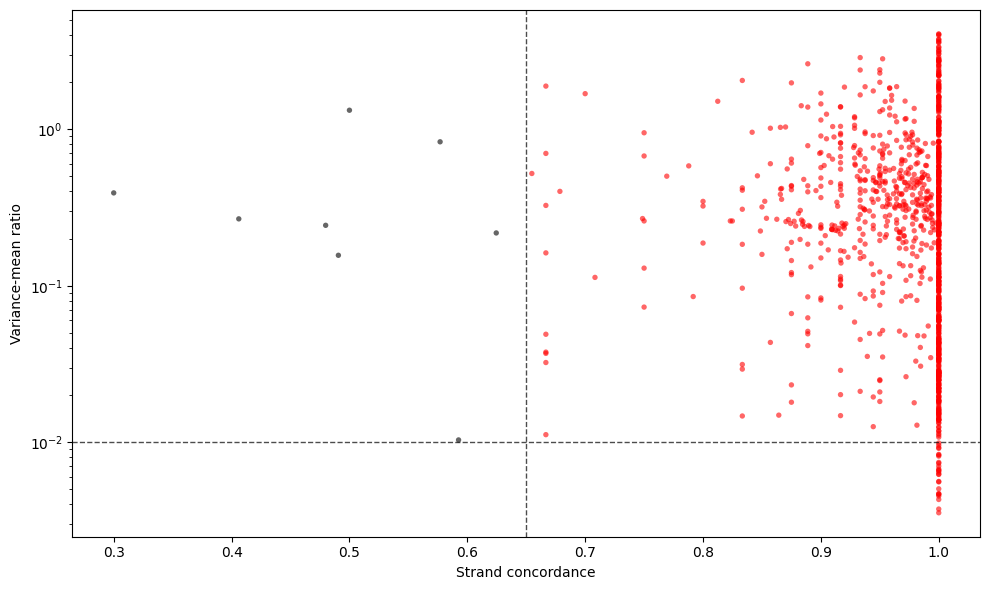

Points with strand_concordance > 0.65: 1075
Points with strand_concordance <= 0.65: 8


In [50]:
import matplotlib.pyplot as plt
import numpy as np

# Access the variant_summary DataFrame
variant_summary = mgatk.uns['variant_summary']

# Create the scatter plot
fig, ax = plt.subplots(figsize=(10, 6))

# Color points based on strand concordance threshold
threshold = 0.65
colors = ['red' if sc > threshold else 'black' 
          for sc in variant_summary['strand_concordance']]

ax.scatter(variant_summary['strand_concordance'], 
           variant_summary['vmr'], 
           c=colors, alpha=0.6, s=15, edgecolors='none')

# Set y-axis to log scale
ax.set_yscale('log')

# Add dashed threshold lines
ax.axvline(x=threshold, color='black', linestyle='--', linewidth=1, alpha=0.7)
ax.axhline(y=0.01, color='black', linestyle='--', linewidth=1, alpha=0.7)

# Labels and styling
ax.set_xlabel('Strand concordance')
ax.set_ylabel('Variance-mean ratio')

plt.tight_layout()
plt.show()

# Print summary to understand the distribution
print(f"Points with strand_concordance > {threshold}: {sum(variant_summary['strand_concordance'] > threshold)}")
print(f"Points with strand_concordance <= {threshold}: {sum(variant_summary['strand_concordance'] <= threshold)}")

/tmp/ipykernel_4168626/4245680750.py:21: UserWarning:

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.



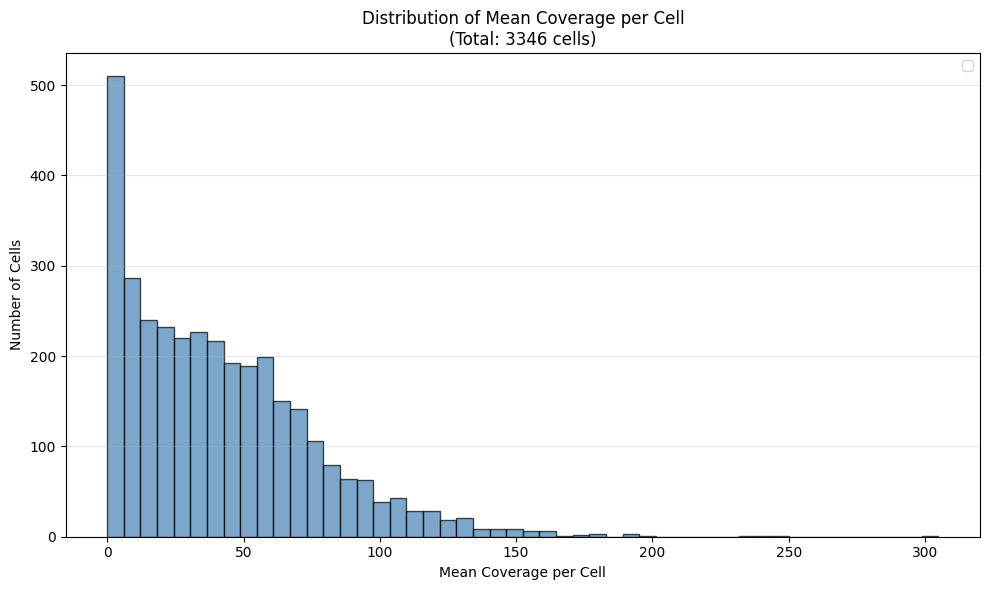

=== MEAN COVERAGE PER CELL STATISTICS ===
Total cells: 3346
Overall mean coverage per cell: 41.53
Median coverage per cell: 35.41
Standard deviation: 34.64
Min coverage per cell: 0.00
Max coverage per cell: 304.93
25th percentile: 13.28
75th percentile: 60.90


In [37]:
# Plot mean coverage per cell - Fixed version with coverage on X-axis
import matplotlib.pyplot as plt
import numpy as np

# Get the coverage matrix (cells x variants)
coverage_matrix = mgatk.obsm['variant_coverage']

# Calculate mean coverage per cell across all variants
mean_coverage_per_cell = coverage_matrix.mean(axis=1)

# Create a single histogram plot
fig, ax = plt.subplots(1, 1, figsize=(10, 6))

# Histogram with coverage on x-axis and number of cells on y-axis
ax.hist(mean_coverage_per_cell, bins=50, alpha=0.7, color='steelblue', edgecolor='black')
ax.set_xlabel('Mean Coverage per Cell')
ax.set_ylabel('Number of Cells')
ax.set_title(f'Distribution of Mean Coverage per Cell\n(Total: {len(mean_coverage_per_cell)} cells)')


ax.legend()
ax.grid(axis='y', alpha=0.3)

plt.tight_layout()
plt.show()

# Print summary statistics
print(f"=== MEAN COVERAGE PER CELL STATISTICS ===")
print(f"Total cells: {len(mean_coverage_per_cell)}")
print(f"Overall mean coverage per cell: {mean_coverage_per_cell.mean():.2f}")
print(f"Median coverage per cell: {np.median(mean_coverage_per_cell):.2f}")
print(f"Standard deviation: {mean_coverage_per_cell.std():.2f}")
print(f"Min coverage per cell: {mean_coverage_per_cell.min():.2f}")
print(f"Max coverage per cell: {mean_coverage_per_cell.max():.2f}")
print(f"25th percentile: {np.percentile(mean_coverage_per_cell, 25):.2f}")
print(f"75th percentile: {np.percentile(mean_coverage_per_cell, 75):.2f}")

/tmp/ipykernel_1903281/411733312.py:6: MatplotlibDeprecationWarning:

The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.



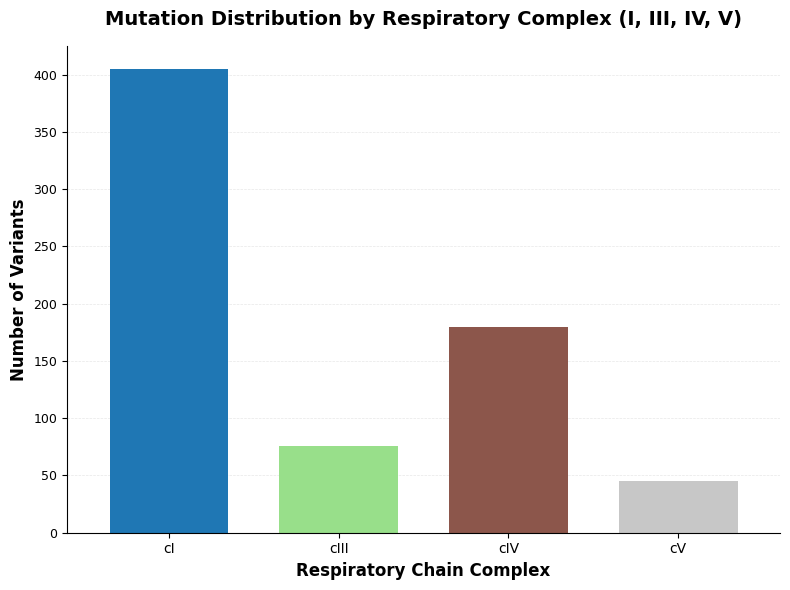


=== Summary ===
Total variants: 1083
Variants in respiratory complexes: 706
Variants in protein-coding genes: 996
Variants in D-loop/non-coding: 87


In [60]:
import matplotlib.pyplot as plt
import numpy as np

# Generate nice colors
def generate_colors(n):
    cmap = plt.cm.get_cmap('tab20')
    if n > 20:
        cmap = plt.cm.get_cmap('hsv')
    return [cmap(i/n) for i in range(n)]

# ===== Plot 1: Variants by Respiratory Complex =====
# Filter only variants in OXPHOS complex genes (I, III, IV, V)
df_resp = variant_summary[variant_summary['complex'] != 'Other'].copy()

if df_resp.empty:
    print("⚠️ No variants affecting respiratory complex proteins in filtered data.")
else:
    # Standardize complex naming
    complex_mapping = {
        'Complex I': 'cI', 
        'Complex III': 'cIII', 
        'Complex IV': 'cIV', 
        'Complex V': 'cV'
    }
    df_resp['complex_clean'] = df_resp['complex'].map(complex_mapping)
    
    # Count variants per complex
    complex_counts = df_resp['complex_clean'].value_counts()
    
    # Ensure order and only relevant complexes
    relevant_complexes = ['cI', 'cIII', 'cIV', 'cV']
    complex_counts = complex_counts.reindex(relevant_complexes, fill_value=0)
    
    # Plot
    fig, ax = plt.subplots(figsize=(8, 6))
    
    colors_complex = generate_colors(len(complex_counts))
    
    complex_counts.plot(
        kind='bar',
        ax=ax,
        width=0.7,
        color=colors_complex,
        edgecolor='none'
    )
    
    ax.set_title(
        'Mutation Distribution by Respiratory Complex (I, III, IV, V)',
        fontsize=14,
        fontweight='bold',
        pad=15
    )
    ax.set_xlabel('Respiratory Chain Complex', fontsize=12, fontweight='bold')
    ax.set_ylabel('Number of Variants', fontsize=12, fontweight='bold')
    
    plt.xticks(rotation=0, fontsize=10)
    plt.yticks(fontsize=9)
    
    ax.spines['top'].set_visible(False)
    ax.spines['right'].set_visible(False)
    ax.yaxis.grid(True, linestyle='--', alpha=0.3, linewidth=0.5)
    ax.set_axisbelow(True)
    
    plt.tight_layout()
    plt.show()

# ===== Summary Statistics =====
print("\n=== Summary ===")
print(f"Total variants: {len(variant_summary)}")
print(f"Variants in respiratory complexes: {len(df_resp)}")
print(f"Variants in protein-coding genes: {len(variant_summary[variant_summary['gene'] != 'D-loop/Non-coding'])}")
print(f"Variants in D-loop/non-coding: {len(variant_summary[variant_summary['gene'] == 'D-loop/Non-coding'])}")

/tmp/ipykernel_1903281/2477924485.py:6: MatplotlibDeprecationWarning:

The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.

/tmp/ipykernel_1903281/2477924485.py:8: MatplotlibDeprecationWarning:

The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.



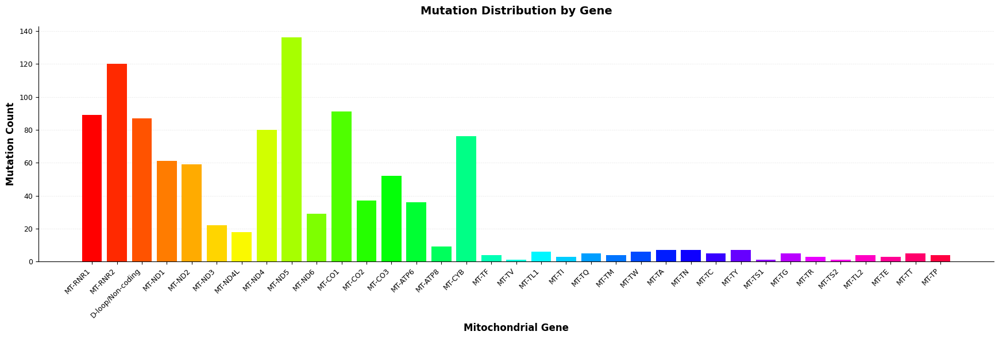


Total genes with variants: 35

Genes in order with counts:
MT-RNR1: 89
MT-RNR2: 120
D-loop/Non-coding: 87
MT-ND1: 61
MT-ND2: 59
MT-ND3: 22
MT-ND4L: 18
MT-ND4: 80
MT-ND5: 136
MT-ND6: 29
MT-CO1: 91
MT-CO2: 37
MT-CO3: 52
MT-ATP6: 36
MT-ATP8: 9
MT-CYB: 76
MT-TF: 4
MT-TV: 1
MT-TL1: 6
MT-TI: 3
MT-TQ: 5
MT-TM: 4
MT-TW: 6
MT-TA: 7
MT-TN: 7
MT-TC: 5
MT-TY: 7
MT-TS1: 1
MT-TG: 5
MT-TR: 3
MT-TS2: 1
MT-TL2: 4
MT-TE: 3
MT-TT: 5
MT-TP: 4


In [62]:
import matplotlib.pyplot as plt
import numpy as np

# Generate nice colors
def generate_colors(n):
    cmap = plt.cm.get_cmap('tab20')
    if n > 20:
        cmap = plt.cm.get_cmap('hsv')
    return [cmap(i/n) for i in range(n)]

# Define gene order matching the genomic position (5' to 3')
gene_order = [
    'MT-RNR1', 'MT-RNR2',  # rRNA genes
    'D-loop/Non-coding',  # D-loop
    'MT-ND1', 'MT-ND2', 'MT-ND3', 'MT-ND4L', 'MT-ND4', 'MT-ND5', 'MT-ND6',  # Complex I
    'MT-CO1', 'MT-CO2', 'MT-CO3',  # Complex IV
    'MT-ATP6', 'MT-ATP8',  # Complex V
    'MT-CYB',  # Complex III
    'MT-TF', 'MT-TV', 'MT-TL1', 'MT-TI', 'MT-TQ', 'MT-TM', 'MT-TW', 'MT-TA', 'MT-TN', 
    'MT-TC', 'MT-TY', 'MT-TS1', 'MT-TK', 'MT-TG', 'MT-TR', 'MT-TH', 'MT-TS2', 'MT-TL2', 
    'MT-TE', 'MT-TT', 'MT-TP'
]

# Get counts for genes that exist in your data
gene_counts_dict = variant_summary['gene'].value_counts().to_dict()

# Create ordered lists only for genes present in your data
genes_present = []
counts_present = []

for gene in gene_order:
    if gene in gene_counts_dict:
        genes_present.append(gene)
        counts_present.append(gene_counts_dict[gene])

# Create the plot
fig, ax = plt.subplots(figsize=(max(16, len(genes_present) * 0.5), 6))

# Get colors - one per gene
colors = generate_colors(len(genes_present))

# Create bar plot
ax.bar(range(len(genes_present)), counts_present, width=0.8, color=colors, edgecolor='none')

# Set x-axis labels
ax.set_xticks(range(len(genes_present)))
ax.set_xticklabels(genes_present, rotation=45, ha='right', fontsize=9)

# Styling
ax.set_title('Mutation Distribution by Gene', fontsize=14, fontweight='bold', pad=15)
ax.set_xlabel('Mitochondrial Gene', fontsize=12, fontweight='bold')
ax.set_ylabel('Mutation Count', fontsize=12, fontweight='bold')

plt.yticks(fontsize=9)

# Remove top and right spines
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)

# Light grid on y-axis only
ax.yaxis.grid(True, linestyle='--', alpha=0.3, linewidth=0.5)
ax.set_axisbelow(True)

plt.tight_layout()
plt.show()

# Print summary
print(f"\nTotal genes with variants: {len(genes_present)}")
print(f"\nGenes in order with counts:")
for gene, count in zip(genes_present, counts_present):
    print(f"{gene}: {count}")

/tmp/ipykernel_1903281/1167979901.py:6: MatplotlibDeprecationWarning:

The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.

/tmp/ipykernel_1903281/1167979901.py:8: MatplotlibDeprecationWarning:

The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.



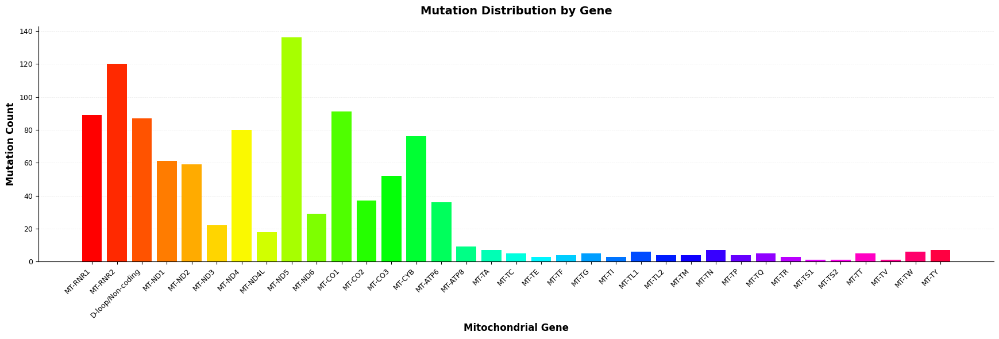


Total genes with variants: 35

Genes with counts:
MT-RNR1: 89
MT-RNR2: 120
D-loop/Non-coding: 87
MT-ND1: 61
MT-ND2: 59
MT-ND3: 22
MT-ND4: 80
MT-ND4L: 18
MT-ND5: 136
MT-ND6: 29
MT-CO1: 91
MT-CO2: 37
MT-CO3: 52
MT-CYB: 76
MT-ATP6: 36
MT-ATP8: 9
MT-TA: 7
MT-TC: 5
MT-TE: 3
MT-TF: 4
MT-TG: 5
MT-TI: 3
MT-TL1: 6
MT-TL2: 4
MT-TM: 4
MT-TN: 7
MT-TP: 4
MT-TQ: 5
MT-TR: 3
MT-TS1: 1
MT-TS2: 1
MT-TT: 5
MT-TV: 1
MT-TW: 6
MT-TY: 7


In [59]:
import matplotlib.pyplot as plt
import numpy as np

# Generate nice colors
def generate_colors(n):
    cmap = plt.cm.get_cmap('tab20')
    if n > 20:
        cmap = plt.cm.get_cmap('hsv')
    return [cmap(i/n) for i in range(n)]

# Define gene order matching the template image
gene_order = [
    'MT-RNR1', 'MT-RNR2', 'MT-D-LOOP', 'MT-DLOOP', 'D-loop/Non-coding',  # rRNA and D-loop
    'MT-ND1', 'MT-ND2', 'MT-ND3', 'MT-ND4', 'MT-ND4L', 'MT-ND5', 'MT-ND6',  # Complex I
    'MT-CO1', 'MT-CO2', 'MT-CO3',  # Complex IV (Cytochrome c oxidase)
    'MT-CYB',  # Complex III (Cytochrome b)
    'MT-ATP6', 'MT-ATP8',  # Complex V (ATP synthase)
    'MT-TA', 'MT-TC', 'MT-TD', 'MT-TE', 'MT-TF', 'MT-TG', 'MT-TH', 'MT-TI',  # tRNAs
    'MT-TK', 'MT-TL1', 'MT-TL2', 'MT-TM', 'MT-TN', 'MT-TP', 'MT-TQ', 'MT-TR',
    'MT-TS1', 'MT-TS2', 'MT-TT', 'MT-TV', 'MT-TW', 'MT-TY'
]

# Count variants per gene
gene_counts_dict = variant_summary['gene'].value_counts().to_dict()

# Create ordered counts
gene_counts_ordered = []
genes_present = []

for gene in gene_order:
    if gene in gene_counts_dict and gene_counts_dict[gene] > 0:
        genes_present.append(gene)
        gene_counts_ordered.append(gene_counts_dict[gene])

# Create the plot
fig, ax = plt.subplots(figsize=(max(16, len(genes_present) * 0.5), 6))

# Get colors - one per gene
colors = generate_colors(len(genes_present))

# Create bar plot
ax.bar(range(len(genes_present)), gene_counts_ordered, width=0.8, color=colors, edgecolor='none')

# Set x-axis labels
ax.set_xticks(range(len(genes_present)))
ax.set_xticklabels(genes_present, rotation=45, ha='right', fontsize=9)

# Styling
ax.set_title('Mutation Distribution by Gene', fontsize=14, fontweight='bold', pad=15)
ax.set_xlabel('Mitochondrial Gene', fontsize=12, fontweight='bold')
ax.set_ylabel('Mutation Count', fontsize=12, fontweight='bold')

plt.yticks(fontsize=9)

# Remove top and right spines
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)

# Light grid on y-axis only
ax.yaxis.grid(True, linestyle='--', alpha=0.3, linewidth=0.5)
ax.set_axisbelow(True)

plt.tight_layout()
plt.show()

# Print summary
print(f"\nTotal genes with variants: {len(genes_present)}")
print(f"\nGenes with counts:")
for gene, count in zip(genes_present, gene_counts_ordered):
    print(f"{gene}: {count}")

In [131]:
# Look at all available columns in variant_summary
print("Available variant-level statistics:")
print(variant_summary.columns.tolist())
print()

Available variant-level statistics:
['variance', 'n_cells_conf_detected', 'n_cells_over_5', 'n_cells_over_10', 'n_cells_over_50', 'mean_coverage', 'strand_concordance', 'vaf_overall']



In [4]:
import numpy as np
import pandas as pd

# Get the matrices
vaf_matrix = mgatk.obsm['variant_vaf'].copy()
coverage_matrix = mgatk.obsm['variant_coverage']
confident_matrix = mgatk.obsm['variant_confident']
variant_names = mgatk.uns['variant_names']
variant_summary = mgatk.uns['variant_summary']

print(f"Original VAF matrix shape: {vaf_matrix.shape}")
print(f"Non-zero VAF values before filtering: {(vaf_matrix > 0).sum()}")

variants_with_expression_before = (vaf_matrix > 0).any(axis=0).sum()
print(f"Variants with at least one expressing cell before filtering: {variants_with_expression_before}")

# Create high-quality filtered VAF matrix
high_quality_vaf_matrix = vaf_matrix.copy()

# For each variant, apply quality filters
for i, variant_name in enumerate(variant_names):
    # Get variant-level statistics
    variant_stats = variant_summary.iloc[i]
    strand_concordance = variant_stats['strand_concordance']
    mean_coverage = variant_stats['mean_coverage']
    n_cells_conf_detected = variant_stats['n_cells_conf_detected']  # Fixed: get from variant_stats
    
    # Get cell-level data
    cell_coverage = coverage_matrix[:, i]
    
    # Check variant-level quality
    variant_passes = (
        (strand_concordance >= 0.5) &
        (mean_coverage >= 5) & # variant level, average coverage across all cells for this variant position
        (n_cells_conf_detected >= 2) # quality based count rather than VAF based, sufficient coverage
    )
    
    # If variant fails, zero out all cells for this variant
    if not variant_passes:
        high_quality_vaf_matrix[:, i] = 0
    

print(f"Non-zero VAF values after high-quality filtering: {(high_quality_vaf_matrix > 0).sum()}")
print(f"Percentage of calls retained: {(high_quality_vaf_matrix > 0).sum() / (vaf_matrix > 0).sum() * 100:.1f}%")

variants_with_expression_after = (high_quality_vaf_matrix > 0).any(axis=0).sum()
print(f"Variants with at least one expressing cell after filtering: {variants_with_expression_after}")
print(f"Percentage of variants retained: {variants_with_expression_after / variants_with_expression_before * 100:.1f}%")

variants_eliminated = variants_with_expression_before - variants_with_expression_after
print(f"Variants completely eliminated by filtering: {variants_eliminated}")
print("variants left:", variants_with_expression_after)

# Store the high-quality filtered matrix
mgatk.obsm['variant_vaf_high_quality'] = high_quality_vaf_matrix

print("\nHigh-quality filtered VAF matrix stored in mgatk.obsm['variant_vaf_high_quality']")

Original VAF matrix shape: (3346, 44436)
Non-zero VAF values before filtering: 371526
Variants with at least one expressing cell before filtering: 43206
Non-zero VAF values after high-quality filtering: 364592
Percentage of calls retained: 98.1%
Variants with at least one expressing cell after filtering: 38202
Percentage of variants retained: 88.4%
Variants completely eliminated by filtering: 5004
variants left: 38202

High-quality filtered VAF matrix stored in mgatk.obsm['variant_vaf_high_quality']


Processing variant 3857: Index 2123, Name: C-8317-T
3


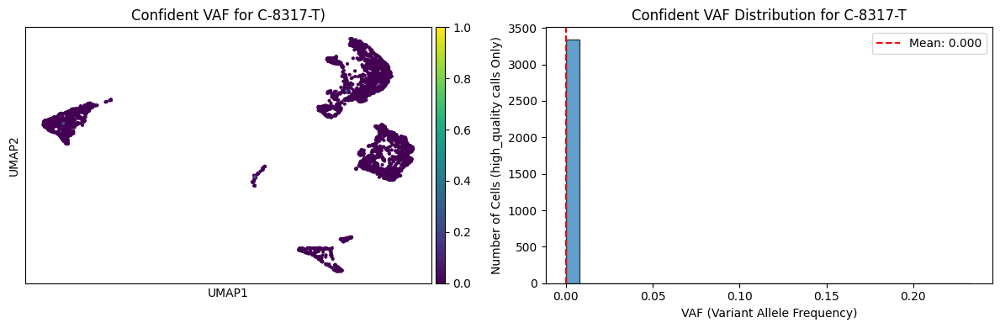

In [129]:
## Plotting 3243
variant_name = 'C-8317-T' # Get the actual variant name string
variant_idx = mgatk.uns['variant_names'].index(variant_name)

print(f"Processing variant {i+1}: Index {variant_idx}, Name: {variant_name}")

# Get VAF and confident matrices
vaf_matrix = mgatk.obsm['variant_vaf_high_quality']


# Extract VAF and confidence for this specific variant using the integer index
vaf_values = mgatk.obsm['variant_vaf_high_quality'][:, variant_idx]

print(np.sum(vaf_values > 0))



# Get filtered VAF values
filtered_vaf_values = vaf_values

# Create a temporary column for plotting (confident calls only)
temp_vaf_col = np.zeros(len(mgatk.obs))
temp_vaf_col = filtered_vaf_values


# Add temporary column to obs for plotting
mgatk.obs[f'temp_vaf_{variant_idx}'] = temp_vaf_col

# Create figure with two subplots
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 4))

# UMAP plot (only confident calls will be colored)
sc.pl.umap(mgatk, color=f'temp_vaf_{variant_idx}', cmap="viridis", vmin=0, vmax=1, 
            title=f"Confident VAF for {variant_name})", 
            ax=ax1, show=False, na_color='lightgray')

# Histogram of confident VAF values only
ax2.hist(filtered_vaf_values, bins=30, alpha=0.7, edgecolor='black')
ax2.set_xlabel('VAF (Variant Allele Frequency)')
ax2.set_ylabel('Number of Cells (high_quality calls Only)')
ax2.set_title(f'Confident VAF Distribution for {variant_name}')
ax2.axvline(filtered_vaf_values.mean(), color='red', linestyle='--', 
            label=f'Mean: {filtered_vaf_values.mean():.3f}')
ax2.legend()

plt.tight_layout()
plt.show()

/tmp/ipykernel_2777594/2718193487.py:11: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  inferno = cm.get_cmap('inferno', 256)


Processing C-16189-T: 24 cells


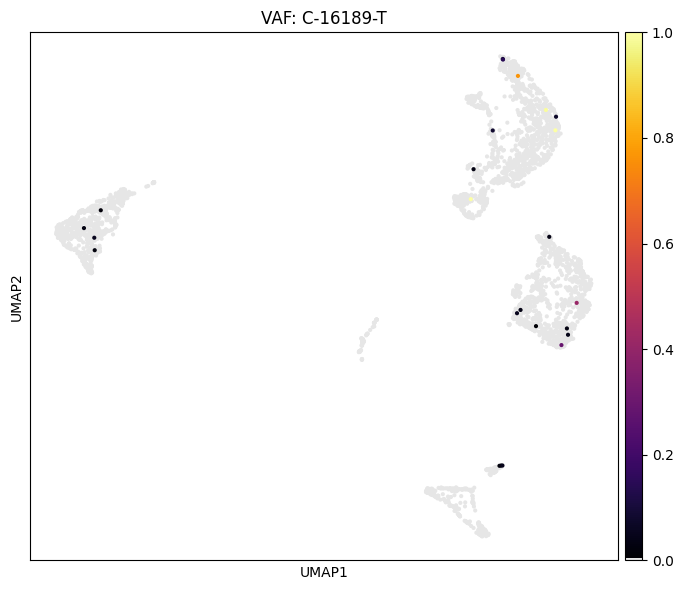

Processing C-980-T: 21 cells


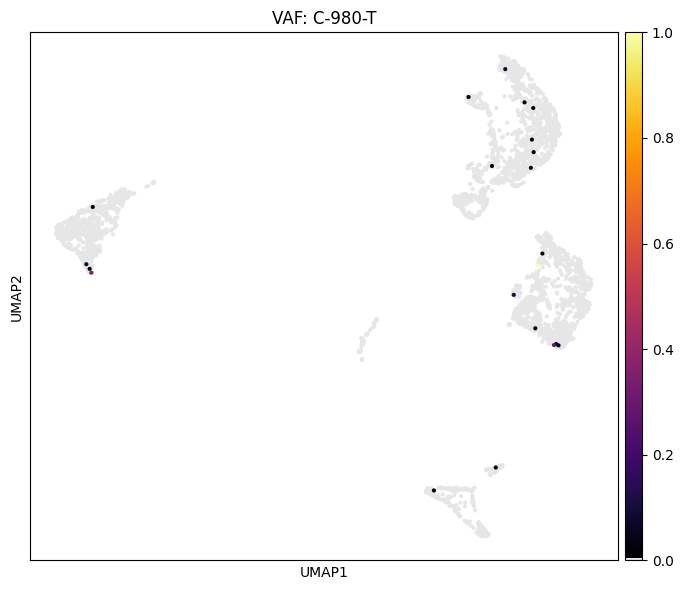

Processing C-1189-T: 32 cells


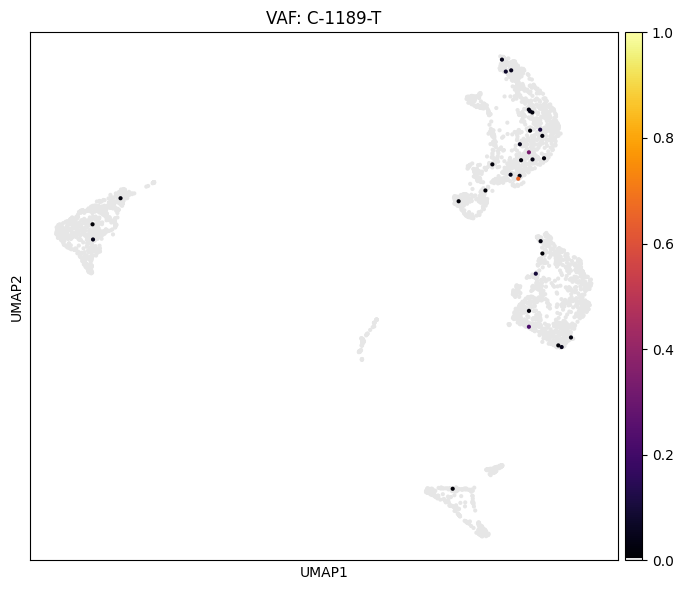

Processing A-2209-G: 30 cells


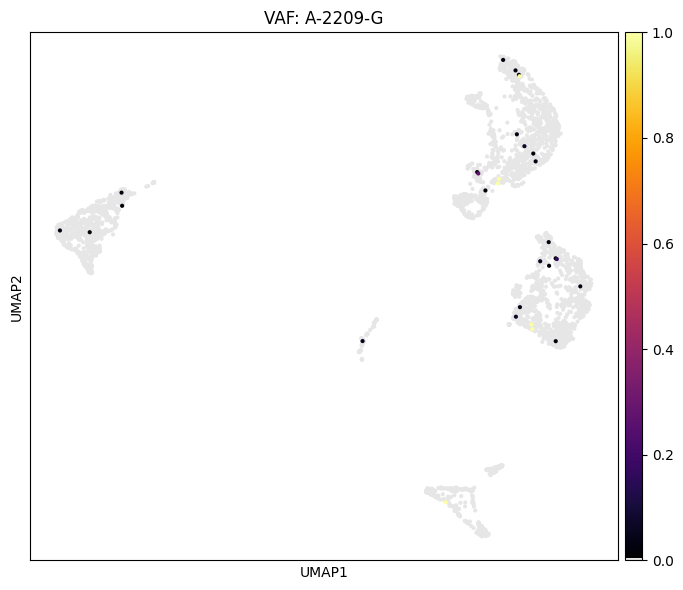

Processing A-1252-G: 41 cells


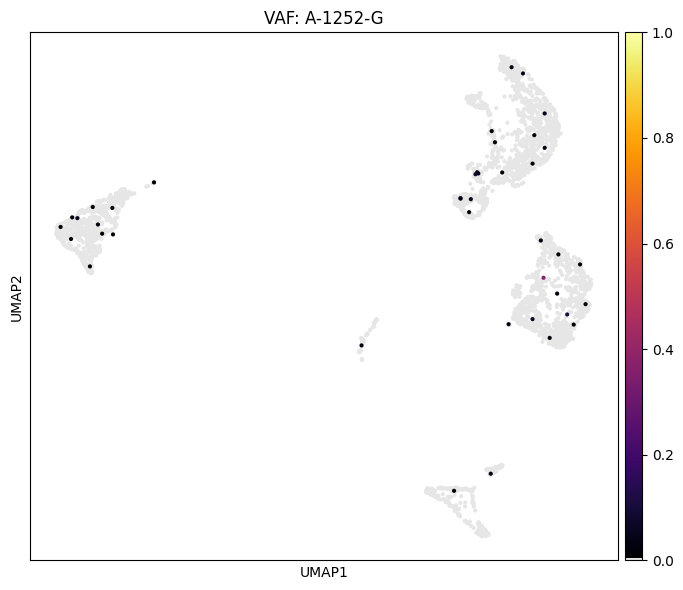

Processing C-4954-T: 26 cells


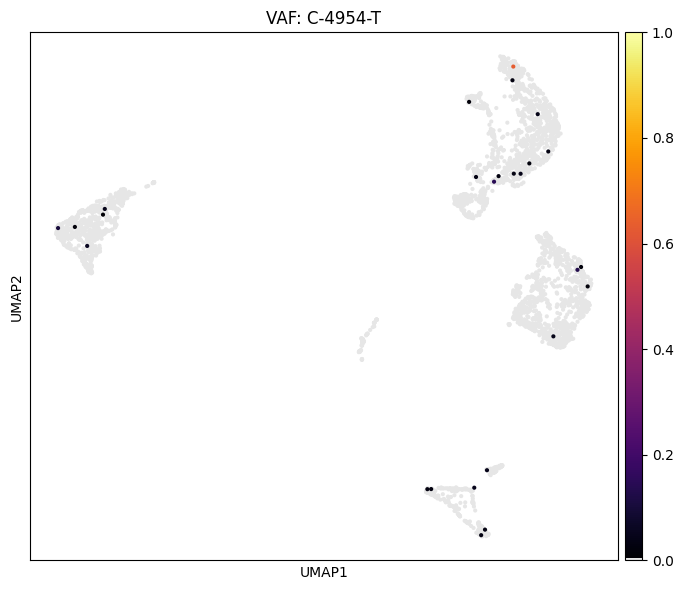

Processing C-15726-T: 30 cells


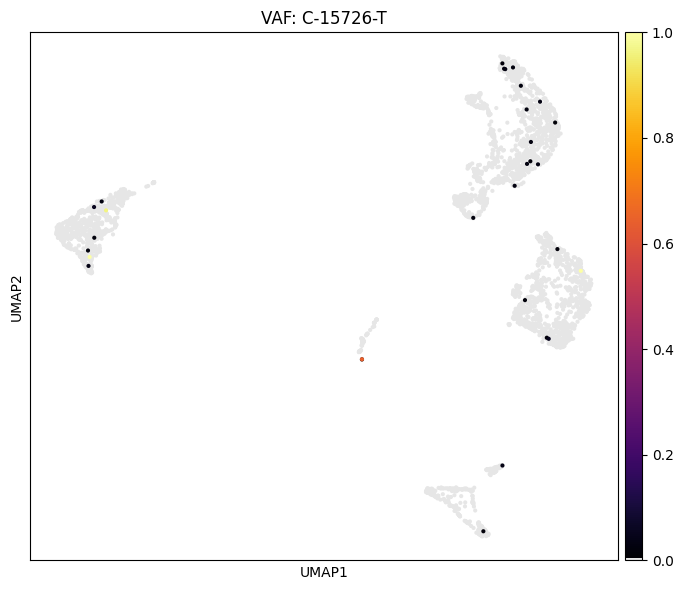

Processing A-2174-G: 20 cells


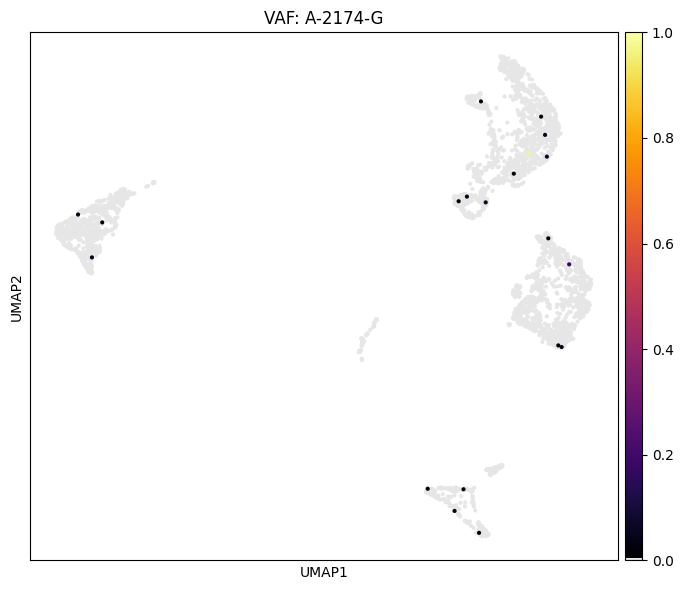

Processing A-3239-g: 24 cells


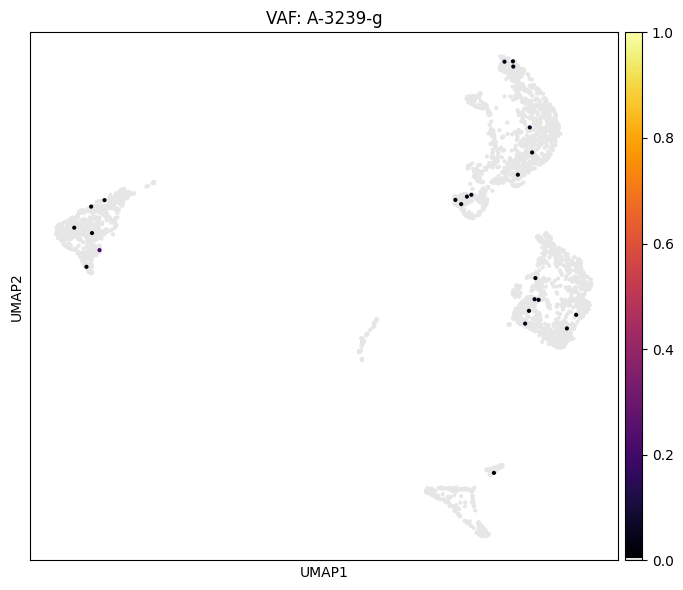

Processing C-2075-T: 30 cells


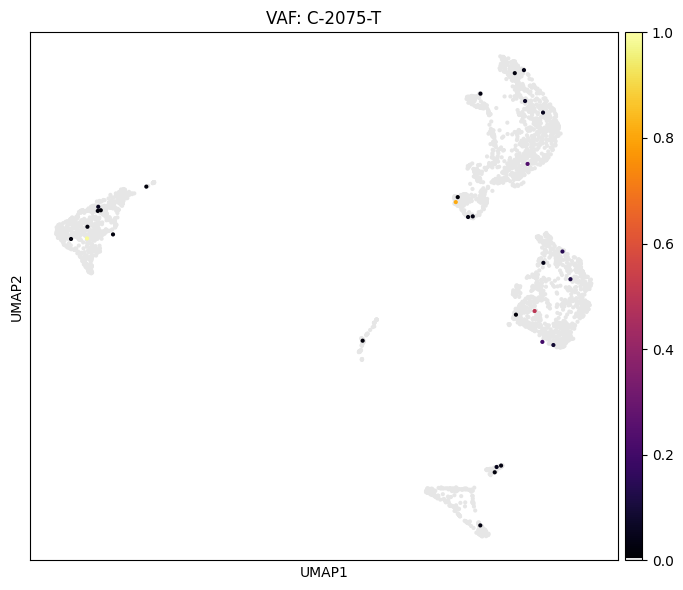

Processing A-10197-G: 32 cells


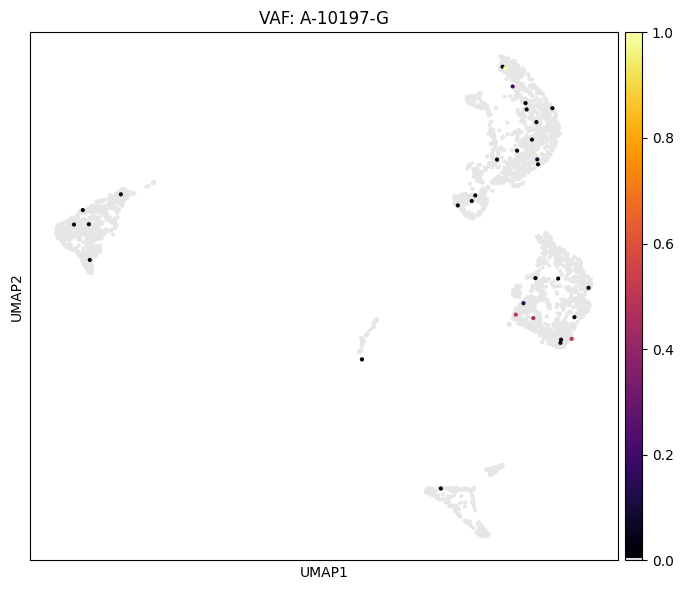

Processing A-2333-G: 41 cells


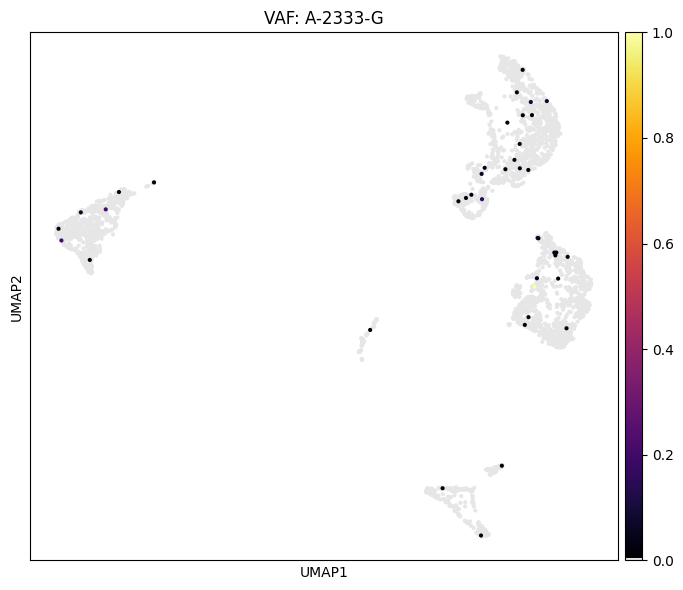

Processing C-10809-T: 11 cells


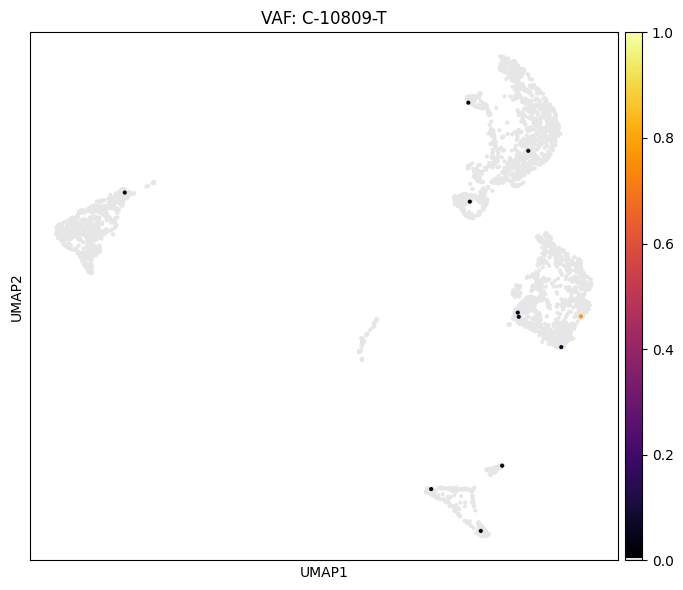

Processing G-13434-A: 11 cells


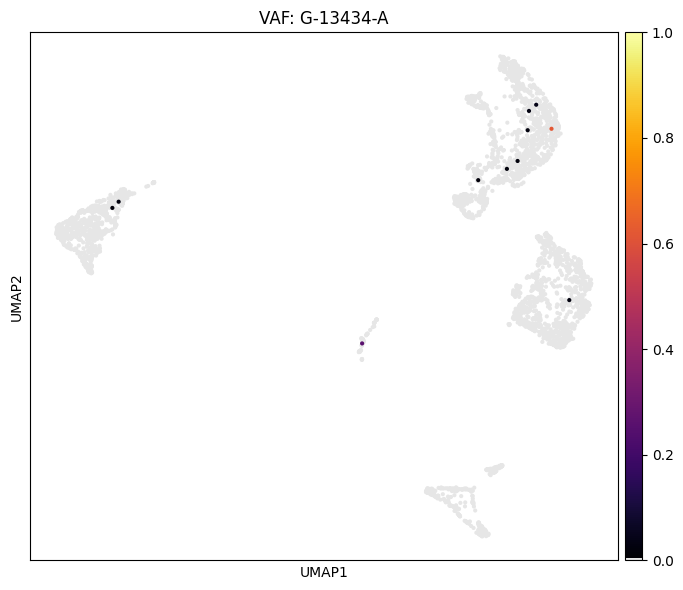

Processing A-6182-G: 22 cells


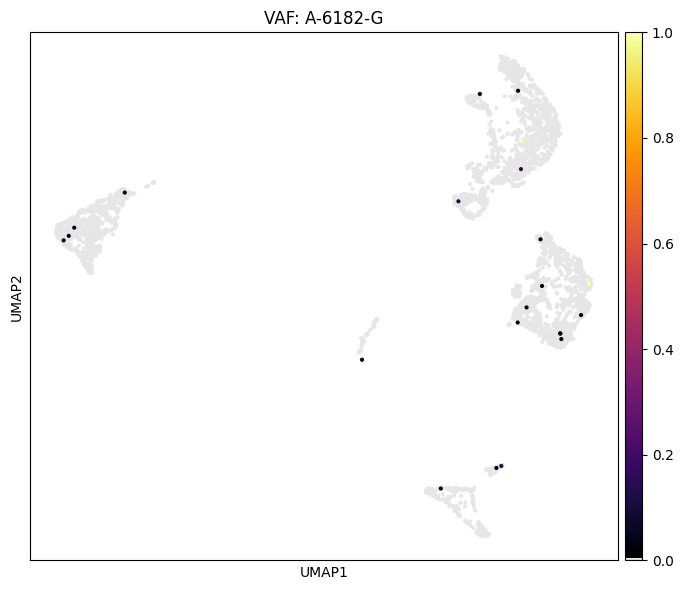

Processing C-8317-T: 18 cells


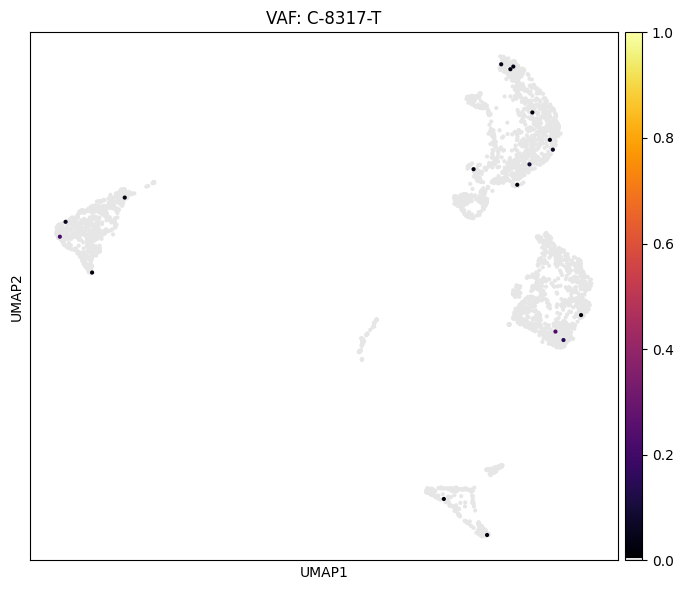

In [5]:
# Run the filtering (make sure you have n_cells_conf_detected >= 2)
# Then plot the 16 variants that pass

import matplotlib.pyplot as plt
import scanpy as sc
import numpy as np
from matplotlib.colors import LinearSegmentedColormap

# Create custom colormap
import matplotlib.cm as cm
inferno = cm.get_cmap('inferno', 256)
colors = inferno(np.linspace(0, 1, 256))
colors[0] = [0.9, 0.9, 0.9, 1]
custom_inferno = LinearSegmentedColormap.from_list('custom_inferno', colors)

# Variants that should pass (16 total)
variants_that_pass = ['C-16189-T', 'C-980-T', 'C-1189-T', 'A-2209-G',
                      'A-1252-G', 'C-4954-T', 'C-15726-T', 'A-2174-G',
                      'A-3239-g', 'C-2075-T', 'A-10197-G', 'A-2333-G',
                      'C-10809-T', 'G-13434-A', 'A-6182-G', 'C-8317-T']

# Plot each variant
for variant_name in variants_that_pass:
    if variant_name in mgatk.uns['variant_names']:
        variant_idx = mgatk.uns['variant_names'].index(variant_name)
        
        vaf_values = mgatk.obsm['variant_vaf_high_quality'][:, variant_idx]
        n_cells = np.sum(vaf_values > 0)
        
        print(f"Processing {variant_name}: {n_cells} cells")
        
        if n_cells > 0:
            mgatk.obs[f'temp_vaf_{variant_idx}'] = vaf_values
            
            fig, ax = plt.subplots(1, 1, figsize=(7, 6))
            sc.pl.umap(mgatk, color=f'temp_vaf_{variant_idx}', 
                       cmap=custom_inferno, vmin=0, vmax=1, 
                       title=f"VAF: {variant_name}", 
                       ax=ax, show=False)
            plt.tight_layout()
            plt.show()
        else:
            print(f"  -> No cells with variant after filtering")

Plotting first 5 confident variants out of 1083 total confident variants
Processing variant 1: Index 0, Name: A-10500-G
No confident non-zero calls for variant A-10500-G
Processing variant 2: Index 1, Name: A-10925-T


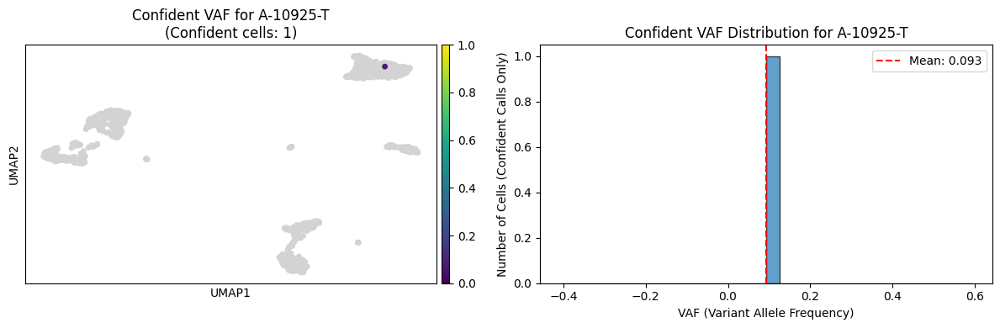

Variant A-10925-T (Index 1):
  Confident cells detected: 1
  Mean coverage: 13.2
  Total cells: 1212
  Confident calls: [False False False ... False False False]
  Confident non-zero calls: 1
  Mean confident VAF: 0.093
  Confident VAF range: 0.093 - 0.093
---
Processing variant 3: Index 2, Name: A-11719-G


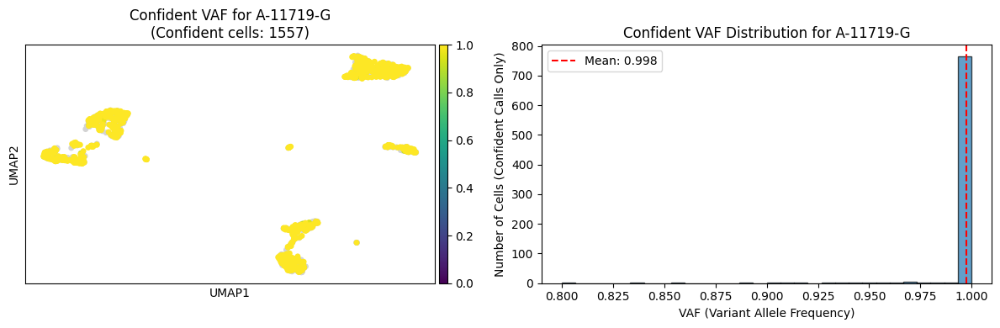

Variant A-11719-G (Index 2):
  Confident cells detected: 1557
  Mean coverage: 14.3
  Total cells: 1212
  Confident calls: [ True False False ... False False  True]
  Confident non-zero calls: 799
  Mean confident VAF: 0.998
  Confident VAF range: 0.800 - 1.000
---
Processing variant 4: Index 3, Name: A-11802-T
No confident non-zero calls for variant A-11802-T
Processing variant 5: Index 4, Name: A-11838-T


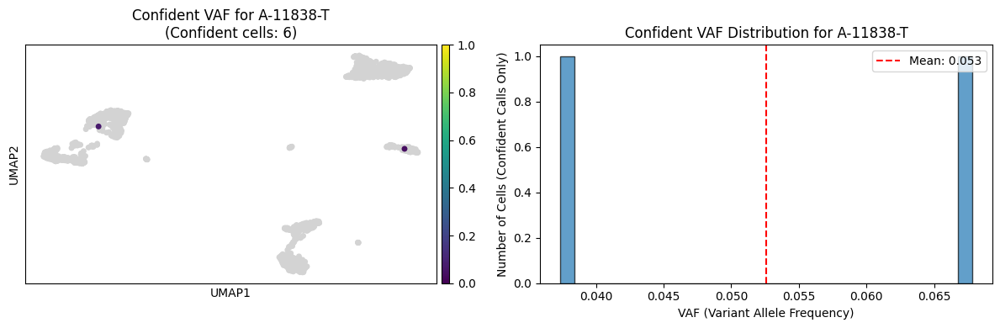

Variant A-11838-T (Index 4):
  Confident cells detected: 6
  Mean coverage: 17.2
  Total cells: 1212
  Confident calls: [False False False ... False False False]
  Confident non-zero calls: 2
  Mean confident VAF: 0.053
  Confident VAF range: 0.037 - 0.068
---


In [ ]:
# Plot confident variants with UMAP and VAF distribution, my code
import matplotlib.pyplot as plt
import numpy as np

# Get confident variants (those with at least one cell having confident detection)
confident_variants = mgatk.uns['variant_summary'][mgatk.uns['variant_summary']['n_cells_conf_detected'] > 0]

print(f"Plotting first 5 confident variants out of {len(confident_variants)} total confident variants")

# Get the variant names list
variant_names = mgatk.uns['variant_names']

for i, variant_idx in enumerate(confident_variants.index[:5]):  # Plot top 5 confident variants
    # variant_idx is already the integer index we need
    variant_name = variant_names[variant_idx]  # Get the actual variant name string
    
    print(f"Processing variant {i+1}: Index {variant_idx}, Name: {variant_name}")
    
    # Get VAF and confident matrices
    vaf_matrix = mgatk.obsm['variant_vaf']
    confident_matrix = mgatk.obsm['variant_confident']
    
    # Extract VAF and confidence for this specific variant using the integer index
    vaf_values = vaf_matrix[:, variant_idx]
    confident_calls = confident_matrix[:, variant_idx]
    
    # Filter for confident calls AND non-zero VAF
    confident_and_nonzero_mask = confident_calls & (vaf_values > 0)
    
    if not confident_and_nonzero_mask.any():
        print(f"No confident non-zero calls for variant {variant_name}")
        continue
    
    # Get filtered VAF values
    filtered_vaf_values = vaf_values[confident_and_nonzero_mask]
    
    # Create a temporary column for plotting (confident calls only)
    temp_vaf_col = np.zeros(len(mgatk.obs))
    temp_vaf_col[confident_and_nonzero_mask] = filtered_vaf_values
    # Set non-confident or zero calls to NaN for proper plotting
    temp_vaf_col[~confident_and_nonzero_mask] = np.nan
    
    # Add temporary column to obs for plotting
    mgatk.obs[f'temp_vaf_{variant_idx}'] = temp_vaf_col
    
    # Create figure with two subplots
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 4))
    
    # UMAP plot (only confident calls will be colored)
    sc.pl.umap(mgatk, color=f'temp_vaf_{variant_idx}', cmap="viridis", vmin=0, vmax=1, 
               title=f"Confident VAF for {variant_name}\n(Confident cells: {confident_variants.loc[variant_idx, 'n_cells_conf_detected']})", 
               ax=ax1, show=False, na_color='lightgray')
    
    # Histogram of confident VAF values only
    ax2.hist(filtered_vaf_values, bins=30, alpha=0.7, edgecolor='black')
    ax2.set_xlabel('VAF (Variant Allele Frequency)')
    ax2.set_ylabel('Number of Cells (Confident Calls Only)')
    ax2.set_title(f'Confident VAF Distribution for {variant_name}')
    ax2.axvline(filtered_vaf_values.mean(), color='red', linestyle='--', 
                label=f'Mean: {filtered_vaf_values.mean():.3f}')
    ax2.legend()
    
    plt.tight_layout()
    plt.show()
    
    # Print summary statistics
    total_cells = len(mgatk.obs)
    confident_cells = confident_calls.sum()
    confident_nonzero_cells = len(filtered_vaf_values)
    
    print(f"Variant {variant_name} (Index {variant_idx}):")
    print(f"  Confident cells detected: {confident_variants.loc[variant_idx, 'n_cells_conf_detected']}")
    print(f"  Mean coverage: {confident_variants.loc[variant_idx, 'mean_coverage']:.1f}")
    print(f"  Total cells: {total_cells}")
    print(f"  Confident calls: {confident_calls}")
    print(f"  Confident non-zero calls: {confident_nonzero_cells}")
    print(f"  Mean confident VAF: {filtered_vaf_values.mean():.3f}")
    print(f"  Confident VAF range: {filtered_vaf_values.min():.3f} - {filtered_vaf_values.max():.3f}")
    print("---")
    
    # Clean up temporary column
    mgatk.obs.drop(columns=[f'temp_vaf_{variant_idx}'], inplace=True)

In [ ]:
#save mgatk object 
/mnt/claw-raid/elliot/mgatk_analysis.h5ad

Found 3 enriched variants
   idx       name  in_target  in_other  enrichment
0  264   C-6832-T          4         0         4.0
2  905  G-13676-A          2         0         2.0
1  677  C-16086-T          3         1         1.5


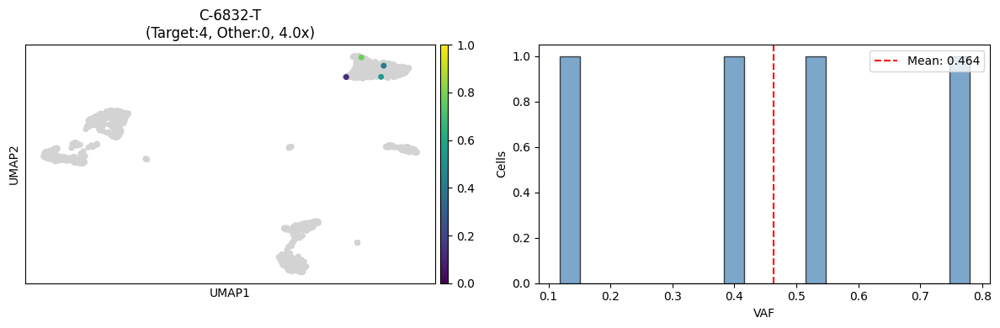

In [80]:
# Find cluster-enriched variants
TARGET_CLUSTERS = ['0']
MIN_CELLS_IN_TARGET = 2
MAX_CELLS_IN_OTHER = 3
MIN_ENRICHMENT = 1.5

import numpy as np
import pandas as pd

_mask = np.isin(mgatk.obs['leiden'].values, TARGET_CLUSTERS)
_enriched = []

for _i in range(len(mgatk.uns['variant_names'])):
    _vaf = mgatk.obsm['variant_vaf'][:, _i]
    _conf = mgatk.obsm['variant_confident'][:, _i]
    _in_target = (_conf & _mask & (_vaf > 0)).sum()
    _in_other = (_conf & ~_mask & (_vaf > 0)).sum()
    _enrich = _in_target / (_in_other + 1)
    
    if _in_target >= MIN_CELLS_IN_TARGET and _in_other <= MAX_CELLS_IN_OTHER and _enrich >= MIN_ENRICHMENT:
        _enriched.append({'idx': _i, 'name': mgatk.uns['variant_names'][_i], 
                         'in_target': _in_target, 'in_other': _in_other, 'enrichment': _enrich})

enriched_df = pd.DataFrame(_enriched).sort_values('enrichment', ascending=False)
print(f"Found {len(enriched_df)} enriched variants")
print(enriched_df)

VARIANT_TO_PLOT = 0

import matplotlib.pyplot as plt
import scanpy as sc

_r = enriched_df.iloc[VARIANT_TO_PLOT]
_m = mgatk.obsm['variant_confident'][:, _r['idx']] & np.isin(mgatk.obs['leiden'].values, TARGET_CLUSTERS) & (mgatk.obsm['variant_vaf'][:, _r['idx']] > 0)
mgatk.obs['_tmp'] = np.where(_m, mgatk.obsm['variant_vaf'][:, _r['idx']], np.nan)

fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 4))
sc.pl.umap(mgatk, color='_tmp', cmap="viridis", vmin=0, vmax=1,
           title=f"{_r['name']}\n(Target:{int(_r['in_target'])}, Other:{int(_r['in_other'])}, {_r['enrichment']:.1f}x)",
           ax=ax1, show=False, na_color='lightgray')
ax2.hist(mgatk.obs.loc[_m, '_tmp'].dropna(), bins=20, alpha=0.7, edgecolor='black', color='steelblue')
ax2.set_xlabel('VAF')
ax2.set_ylabel('Cells')
ax2.axvline(mgatk.obs.loc[_m, '_tmp'].mean(), color='red', linestyle='--', label=f'Mean: {mgatk.obs.loc[_m, "_tmp"].mean():.3f}')
ax2.legend()
plt.tight_layout()
plt.show()
mgatk.obs.drop(columns=['_tmp'], inplace=True)

In [ ]:
import matplotlib.pyplot as plt
import numpy as np

# Convert to dense array if sparse
coverage_matrix = mgatk.X
if hasattr(coverage_matrix, 'toarray'):
    coverage_matrix = coverage_matrix.toarray()

print(f"Coverage matrix shape: {coverage_matrix.shape}")

# Get cell names
cell_names = mgatk.obs_names

# Create the plot
plt.figure(figsize=(15, 10))

# Plot each cell as a line
for i, cell_name in enumerate(cell_names):
    coverage = coverage_matrix[i, :]
    # Ensure both x and y have same dimensions
    x_positions = range(len(coverage))
    plt.plot(x_positions, coverage, alpha=0.7, linewidth=1, label=cell_name)

plt.xlabel('Position on Mitochondrial Genome')
plt.ylabel('Read Depth')
plt.title('Mitochondrial Genome Coverage for All Cells')
plt.grid(True, alpha=0.3)

# Only show legend if there aren't too many cells
if len(cell_names) <= 20:
    plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')

plt.tight_layout()
plt.show()

Coverage matrix shape: (1475, 6062095)


KeyboardInterrupt: 

Variant A-10500-G: Insufficient data points (0)
Variant A-10925-T: Insufficient data points (1)


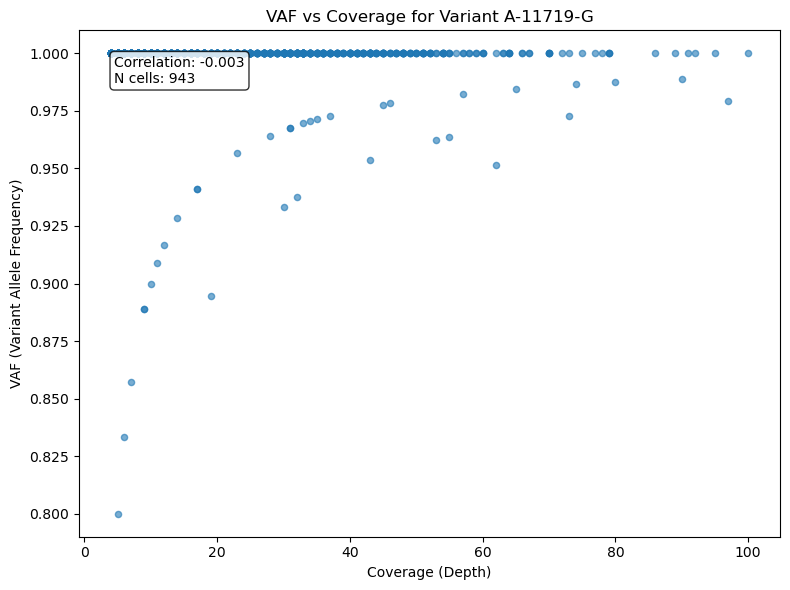

Variant A-11719-G:
  Coverage range: 4.0 - 100.0
  Mean coverage: 21.9
  VAF range: 0.800 - 1.000
  Correlation (VAF vs Coverage): -0.003
---
Variant A-11802-T: Insufficient data points (0)
Variant A-11838-T: Insufficient data points (3)
Variant A-15170-G: Insufficient data points (2)


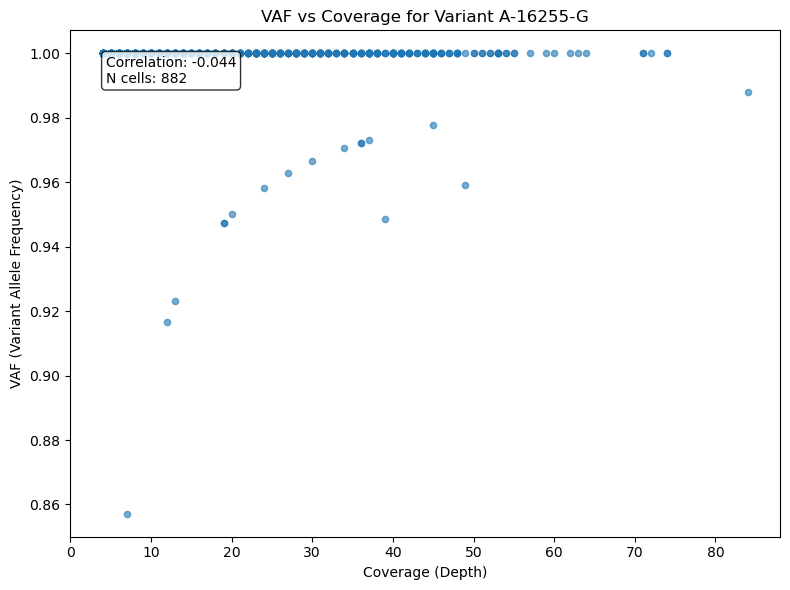

Variant A-16255-G:
  Coverage range: 4.0 - 84.0
  Mean coverage: 18.4
  VAF range: 0.857 - 1.000
  Correlation (VAF vs Coverage): -0.044
---


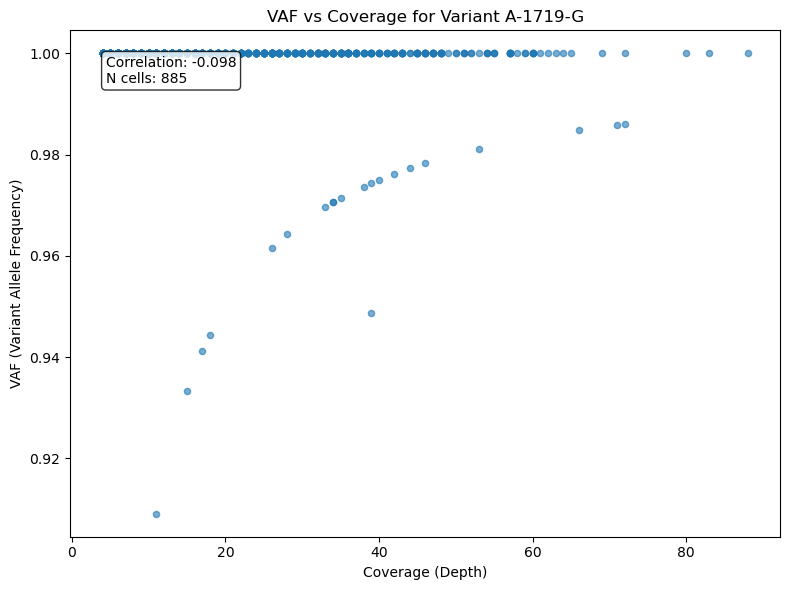

Variant A-1719-G:
  Coverage range: 4.0 - 88.0
  Mean coverage: 19.7
  VAF range: 0.909 - 1.000
  Correlation (VAF vs Coverage): -0.098
---
Variant A-1770-G: Insufficient data points (1)


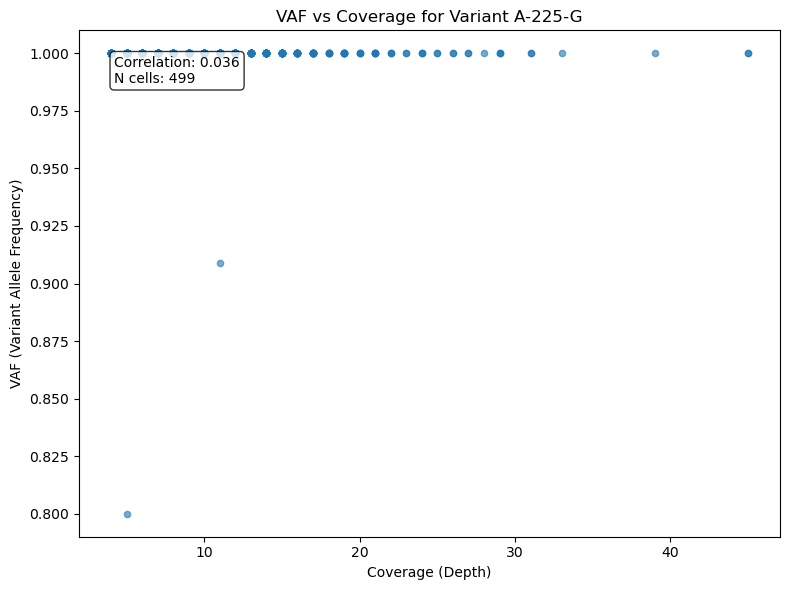

Variant A-225-G:
  Coverage range: 4.0 - 45.0
  Mean coverage: 10.5
  VAF range: 0.800 - 1.000
  Correlation (VAF vs Coverage): 0.036
---
Variant A-2573-G: Insufficient data points (0)
Variant A-2620-g: Insufficient data points (0)
Variant A-4148-G: Insufficient data points (1)
Variant A-5585-G: Insufficient data points (2)
Variant A-64-C: Insufficient data points (0)
Variant A-8206-G: Insufficient data points (0)
Variant A-822-G: Insufficient data points (1)
Variant A-9342-G: Insufficient data points (0)
Variant C-11485-T: Insufficient data points (1)
Variant C-11684-T: Insufficient data points (1)
Variant C-12758-T: Insufficient data points (1)
Variant C-13006-T: Insufficient data points (1)
Variant C-13039-T: Insufficient data points (0)
Variant C-13163-T: Insufficient data points (1)
Variant C-13830-T: Insufficient data points (1)


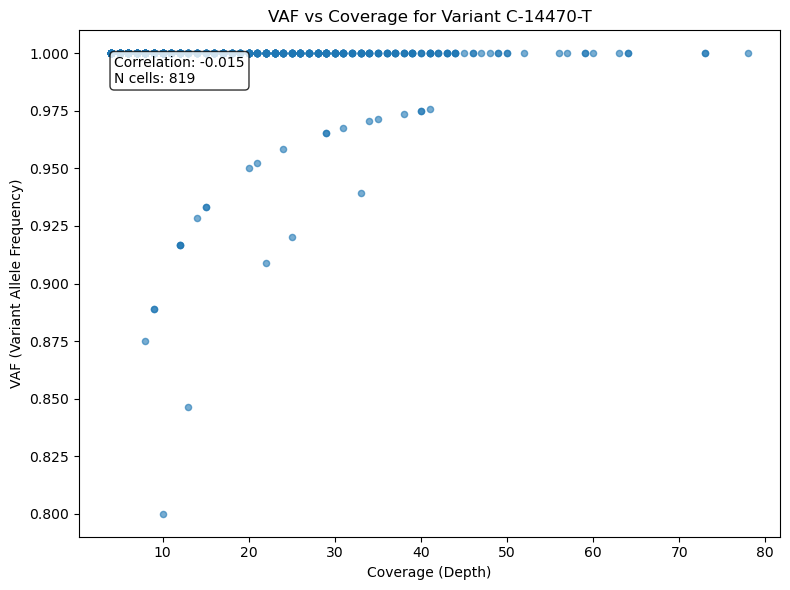

Variant C-14470-T:
  Coverage range: 4.0 - 78.0
  Mean coverage: 16.1
  VAF range: 0.800 - 1.000
  Correlation (VAF vs Coverage): -0.015
---
Variant C-15306-T: Insufficient data points (1)
Variant C-15784-T: Insufficient data points (1)


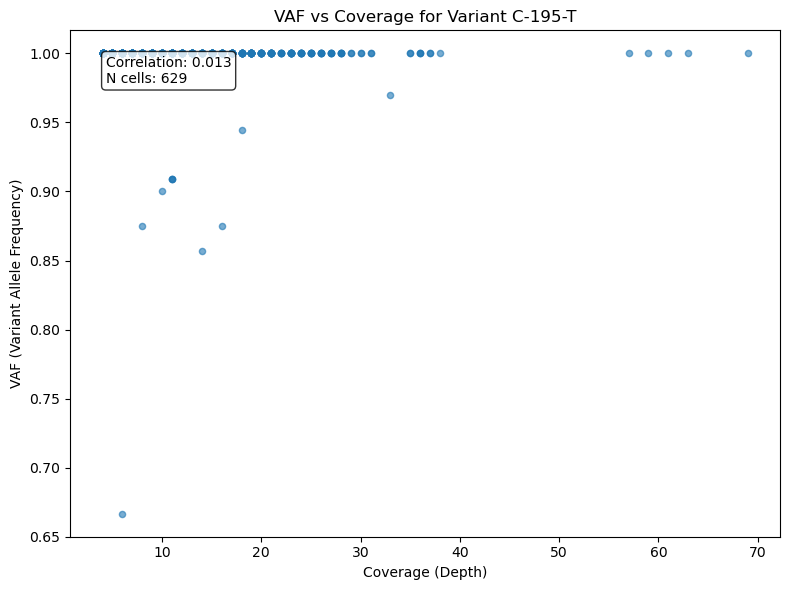

Variant C-195-T:
  Coverage range: 4.0 - 69.0
  Mean coverage: 12.0
  VAF range: 0.667 - 1.000
  Correlation (VAF vs Coverage): 0.013
---
Variant C-3264-t: Insufficient data points (0)


In [9]:
import numpy as np
import matplotlib.pyplot as plt

# Get the matrices and variant info
vaf_matrix = mgatk.obsm['variant_vaf']        # cells x variants
coverage_matrix = mgatk.obsm['variant_coverage']  # cells x variants  
variant_names = mgatk.uns['variant_names']

# For variants in your confident_variants
for i, variant_idx in enumerate(confident_variants.index[:30]):  # Plot top 5 confident variants
    # variant_idx is already the integer index we need
    variant_name = variant_names[variant_idx]  # Get the actual variant name string
    try:
        variant_idx = confident_variants.index[i]  # Get the actual variant index
        # Find the index of this variant in the variant_names list
        variant_idx = variant_names.index(variant_name)
        
        # Get VAF and coverage values for this variant across all cells
        vaf_values = vaf_matrix[:, variant_idx]
        coverage_values = coverage_matrix[:, variant_idx]
        
        # Filter for cells with non-zero VAF and valid coverage
        mask = (vaf_values > 0) & (coverage_values > 0)
        
        if mask.sum() > 5:  # Need at least 5 points for meaningful plot
            filtered_vaf = vaf_values[mask]
            filtered_coverage = coverage_values[mask]
            
            # Create scatter plot
            fig, ax = plt.subplots(1, 1, figsize=(8, 6))
            
            scatter = ax.scatter(filtered_coverage, filtered_vaf, alpha=0.6, s=20)
            ax.set_xlabel('Coverage (Depth)')
            ax.set_ylabel('VAF (Variant Allele Frequency)')
            ax.set_title(f'VAF vs Coverage for Variant {variant_name}')
            
            # Add statistics
            if len(filtered_coverage) > 1 and len(set(filtered_coverage)) > 1:
                correlation = np.corrcoef(filtered_coverage, filtered_vaf)[0, 1]
            else:
                correlation = np.nan
                
            ax.text(0.05, 0.95, f'Correlation: {correlation:.3f}\nN cells: {len(filtered_vaf)}', 
                    transform=ax.transAxes, verticalalignment='top', 
                    bbox=dict(boxstyle='round', facecolor='white', alpha=0.8))
            
            plt.tight_layout()
            plt.show()
            
            # Print summary
            print(f"Variant {variant_name}:")
            print(f"  Coverage range: {filtered_coverage.min():.1f} - {filtered_coverage.max():.1f}")
            print(f"  Mean coverage: {filtered_coverage.mean():.1f}")
            print(f"  VAF range: {filtered_vaf.min():.3f} - {filtered_vaf.max():.3f}")
            print(f"  Correlation (VAF vs Coverage): {correlation:.3f}")
            print("---")
        else:
            print(f"Variant {variant_name}: Insufficient data points ({mask.sum()})")
            
    except Exception as e:
        print(f"Error processing variant {variant_name}: {e}")

In [10]:
import numpy as np
import pandas as pd

# Get the matrices
vaf_matrix = mgatk.obsm['variant_vaf'].copy()  # Make a copy to modify
coverage_matrix = mgatk.obsm['variant_coverage']
confident_matrix = mgatk.obsm['variant_confident']
variant_names = mgatk.uns['variant_names']
variant_summary = mgatk.uns['variant_summary']

print(f"Original VAF matrix shape: {vaf_matrix.shape}")
print(f"Non-zero VAF values before filtering: {(vaf_matrix > 0).sum()}")

# Count variants with at least one expressing cell before filtering
variants_with_expression_before = (vaf_matrix > 0).any(axis=0).sum()
print(f"Variants with at least one expressing cell before filtering: {variants_with_expression_before}")

# Create high-quality filtered VAF matrix
high_quality_vaf_matrix = vaf_matrix.copy()
variant_names_list = []
# For each variant, apply cell-level quality filters
for i, variant_name in enumerate(variant_names):
    # Get variant-level statistics
    variant_stats = variant_summary.iloc[i]
    strand_concordance = variant_stats['strand_concordance']
    variance = variant_stats['variance'] 
    mean_coverage = variant_stats['mean_coverage']
    
    # Get cell-level data for this variant
    cell_vaf = vaf_matrix[:, i]
    cell_coverage = coverage_matrix[:, i]
    cell_confident = confident_matrix[:, i]
    
    # Define quality criteria for this variant's cells
    quality_mask = (
        (strand_concordance >= 0.5) &  # Variant-level criterion
        (mean_coverage >= 20) &        # Variant-level criterion
        (cell_vaf >= 0.1)        # Cell-level: VAF > 10%
    )
    
    # Set non-qualifying cells to 0 for this variant
    high_quality_vaf_matrix[~quality_mask, i] = 0

print(f"Non-zero VAF values after high-quality filtering: {(high_quality_vaf_matrix > 0).sum()}")
print(f"Percentage of calls retained: {(high_quality_vaf_matrix > 0).sum() / (vaf_matrix > 0).sum() * 100:.1f}%")

# Count variants with at least one expressing cell after filtering
variants_with_expression_after = (high_quality_vaf_matrix > 0).any(axis=0).sum()
print(f"Variants with at least one expressing cell after filtering: {variants_with_expression_after}")
print(f"Percentage of variants retained: {variants_with_expression_after / variants_with_expression_before * 100:.1f}%")

# Count variants completely eliminated by filtering
variants_eliminated = variants_with_expression_before - variants_with_expression_after
print(f"Variants completely eliminated by filtering: {variants_eliminated}")
print("variants left" , variants_with_expression_after)
# Store the high-quality filtered matrix
mgatk.obsm['variant_vaf_high_quality'] = high_quality_vaf_matrix

# Now you can use this filtered matrix for analysis
print("\nHigh-quality filtered VAF matrix stored in mgatk.obsm['variant_vaf_high_quality']")

Original VAF matrix shape: (1475, 1083)
Non-zero VAF values before filtering: 24046
Variants with at least one expressing cell before filtering: 694
Non-zero VAF values after high-quality filtering: 0
Percentage of calls retained: 0.0%
Variants with at least one expressing cell after filtering: 0
Percentage of variants retained: 0.0%
Variants completely eliminated by filtering: 694
variants left 0

High-quality filtered VAF matrix stored in mgatk.obsm['variant_vaf_high_quality']


In [11]:
# Boolean mask: True for variants with at least one retained (non-zero) cell
high_quality_mask = (high_quality_vaf_matrix > 0).any(axis=0)

# Get corresponding variant names
high_quality_variant_names = np.array(variant_names)[high_quality_mask]
print(high_quality_variant_names)
print(len(high_quality_variant_names))

## Flip variants to match format 
converted = [f"MT-{alt}-{pos}-{ref}" for ref, pos, alt in (v.split('-') for v in high_quality_variant_names)]
print(converted)

required_columns = ["chr", "pos", "ref", "alt"]

genebe_df = pd.DataFrame(
    [v.split('-') for v in converted],
    columns=["chr","ref", "pos", "alt"]
)
genebe_df = genebe_df[required_columns]

print(genebe_df.head())

[]
0
[]
Empty DataFrame
Columns: [chr, pos, ref, alt]
Index: []


In [12]:
import genebe as gnb
annotated_PBMC = gnb.annotate_dataframe_variants(genebe_df,use_ensembl=True,use_refseq=False, genome='hg38', flatten_consequences=False)

ModuleNotFoundError: No module named 'genebe'

In [ ]:
annotated_PBMC.to_csv('PBMC_PostMortem_genebe.csv', index=False)

In [13]:
#Gene classification 
gene_classification = {
    'MT-ND1': 'Complex I',
    'MT-ND2': 'Complex I',
    'MT-ND3': 'Complex I',
    'MT-ND4': 'Complex I',
    'MT-ND4L': 'Complex I',
    'MT-ND5': 'Complex I',
    'MT-ND6': 'Complex I',
    'MT-CO1': 'Complex IV',
    'MT-CO2': 'Complex IV',
    'MT-CO3': 'Complex IV',
    'MT-CYB': 'Complex III',
    'MT-ATP6': 'Complex V',
    'MT-ATP8': 'Complex V',
    'MT-RNR1': 'rRNA',
    'MT-RNR2': 'rRNA',
    'MT-TF': 'tRNA',  
    'MT-TV': 'tRNA',
    'MT-TI': 'tRNA',
    'MT-TL1': 'tRNA',
    'MT-TL2': 'tRNA',
    'MT-TK': 'tRNA',
    'MT-TM': 'tRNA',
    'MT-TP': 'tRNA',
    'MT-TS1': 'tRNA',
    'MT-TS2': 'tRNA',
    'MT-TW': 'tRNA',
    'MT-TA': 'tRNA',
    'MT-TC': 'tRNA',
    'MT-TY': 'tRNA',
    'MT-TH': 'tRNA',
    'MT-TG': 'tRNA',
    'MT-TR': 'tRNA',
    'MT-TN': 'tRNA',
    'MT-TD': 'tRNA',
    'MT-TE': 'tRNA',
    'MT-TQ': 'tRNA'
}

In [14]:
# Create a copy of the dataframe and add the functional classification
annotated_PBMC_classified = annotated_PBMC.copy()
annotated_PBMC_classified['gene_functional_group'] = annotated_PBMC_classified['gene_symbol'].map(gene_classification)

# Handle any genes not in the classification (mark as 'Other')
annotated_PBMC_classified['gene_functional_group'] = annotated_PBMC_classified['gene_functional_group'].fillna('Other')

# Create a 2x2 subplot layout for the pie charts
fig, ((ax1, ax2), (ax3, ax4)) = plt.subplots(2, 2, figsize=(20, 16))  # Increased figure size

# Function to prepare data for pie chart (handle NaN values and limit categories)
def prepare_pie_data(series, max_categories=20):
    # Count values, excluding NaN
    value_counts = series.value_counts(dropna=True)
    
    # If there are more categories than max_categories, group the smallest ones as "Other"
    if len(value_counts) > max_categories:
        top_categories = value_counts.head(max_categories - 1)
        other_count = value_counts.iloc[max_categories - 1:].sum()
        
        # Create new series with "Other" category
        pie_data = top_categories.copy()
        pie_data['Other'] = other_count
    else:
        pie_data = value_counts
    
    return pie_data

# 1. Gene Functional Group pie chart (using your classification)
gene_functional_data = prepare_pie_data(annotated_PBMC_classified['gene_functional_group'])
colors1 = ['#ff9999', '#66b3ff', '#99ff99', '#ffcc99', '#ff99cc', '#c2c2f0']  # Custom colors for complexes

# Option 1: Use pctdistance and labeldistance to control spacing
wedges1, texts1, autotexts1 = ax1.pie(gene_functional_data.values, labels=gene_functional_data.index, 
                                       autopct='%1.1f%%', startangle=90, 
                                       colors=colors1[:len(gene_functional_data)],
                                       pctdistance=0.85,    # Distance of percentage labels from center
                                       labeldistance=1.1)   # Distance of category labels from center

# Adjust text properties to prevent overlap
for autotext in autotexts1:
    autotext.set_fontsize(10)
    autotext.set_fontweight('bold')
    autotext.set_color('white')

for text in texts1:
    text.set_fontsize(11)

ax1.set_title(f'Variants by Mitochondrial Functional Group\n(Total variants: {len(annotated_PBMC)})', 
              fontsize=14, fontweight='bold', pad=20)

# 2. Effect pie chart with adjusted spacing
effect_data = prepare_pie_data(annotated_PBMC['effect'])
wedges2, texts2, autotexts2 = ax2.pie(effect_data.values, labels=effect_data.index, 
                                       autopct='%1.1f%%', startangle=90,
                                       pctdistance=0.85, labeldistance=1.1)

for autotext in autotexts2:
    autotext.set_fontsize(10)
    autotext.set_fontweight('bold')
    autotext.set_color('white')

for text in texts2:
    text.set_fontsize(11)

ax2.set_title(f'Variants by Effect\n(Total variants: {len(annotated_PBMC)})', 
              fontsize=14, fontweight='bold', pad=20)

# 3. ACMG Classification pie chart
acmg_data = prepare_pie_data(annotated_PBMC['acmg_classification'])
if len(acmg_data) > 0:
    wedges3, texts3, autotexts3 = ax3.pie(acmg_data.values, labels=acmg_data.index, 
                                           autopct='%1.1f%%', startangle=90,
                                           pctdistance=0.85, labeldistance=1.1)
    
    for autotext in autotexts3:
        autotext.set_fontsize(10)
        autotext.set_fontweight('bold')
        autotext.set_color('white')
    
    for text in texts3:
        text.set_fontsize(11)
    
    ax3.set_title(f'Variants by ACMG Classification\n(Total classified: {acmg_data.sum()})', 
                  fontsize=14, fontweight='bold', pad=20)
else:
    ax3.text(0.5, 0.5, 'No ACMG Classifications\nAvailable', ha='center', va='center', fontsize=12)
    ax3.set_title('ACMG Classification', fontsize=14, fontweight='bold', pad=20)

# 4. ClinVar Classification pie chart
clinvar_data = prepare_pie_data(annotated_PBMC['clinvar_classification'])
if len(clinvar_data) > 0:
    wedges4, texts4, autotexts4 = ax4.pie(clinvar_data.values, labels=clinvar_data.index, 
                                           autopct='%1.1f%%', startangle=90,
                                           pctdistance=0.85, labeldistance=1.1)
    
    for autotext in autotexts4:
        autotext.set_fontsize(10)
        autotext.set_fontweight('bold')
        autotext.set_color('white')
    
    for text in texts4:
        text.set_fontsize(11)
    
    ax4.set_title(f'Variants by ClinVar Classification\n(Total classified: {clinvar_data.sum()})', 
                  fontsize=14, fontweight='bold', pad=20)
else:
    ax4.text(0.5, 0.5, 'No ClinVar Classifications\nAvailable', ha='center', va='center', fontsize=12)
    ax4.set_title('ClinVar Classification', fontsize=14, fontweight='bold', pad=20)

plt.tight_layout(pad=3.0)  # Add more padding between subplots
plt.show()

# Print summary statistics for each category
print("=== SUMMARY STATISTICS ===")
print(f"\n1. Mitochondrial Functional Group Distribution:")
functional_summary = annotated_PBMC_classified['gene_functional_group'].value_counts(dropna=True)
print(f"   Total functional groups represented: {len(functional_summary)}")
print(f"   Most common functional group: {functional_summary.index[0]} ({functional_summary.iloc[0]} variants)")
print(f"   All functional groups:")
for group, count in functional_summary.items():
    print(f"      {group}: {count} variants ({count/len(annotated_PBMC)*100:.1f}%)")

print(f"\n2. Individual Gene Symbol Distribution:")
gene_summary = annotated_PBMC['gene_symbol'].value_counts(dropna=True)
print(f"   Total genes represented: {len(gene_summary)}")
print(f"   Most common gene: {gene_summary.index[0]} ({gene_summary.iloc[0]} variants)")
print(f"   Top 10 genes:")
for i, (gene, count) in enumerate(gene_summary.head(10).items()):
    functional_group = gene_classification.get(gene, 'Other')
    print(f"      {i+1}. {gene} ({functional_group}): {count} variants ({count/len(annotated_PBMC)*100:.1f}%)")

print(f"\n3. Effect Distribution:")
effect_summary = annotated_PBMC['effect'].value_counts(dropna=True)
print(f"   Total effect types: {len(effect_summary)}")
if len(effect_summary) > 0:
    print(f"   Most common effect: {effect_summary.index[0]} ({effect_summary.iloc[0]} variants)")
    print(f"   All effects:")
    for effect, count in effect_summary.items():
        print(f"      {effect}: {count} variants ({count/len(annotated_PBMC)*100:.1f}%)")

acmg_summary = annotated_PBMC['acmg_classification'].value_counts(dropna=True)
print(f"\n4. ACMG Classification Distribution:")
print(f"   Total ACMG classified variants: {annotated_PBMC['acmg_classification'].notna().sum()}")
print(f"   Unclassified variants: {annotated_PBMC['acmg_classification'].isna().sum()}")
for classification, count in acmg_summary.items():
    print(f"      {classification}: {count} variants")

print(f"\n5. ClinVar Classification Distribution:")
clinvar_summary = annotated_PBMC['clinvar_classification'].value_counts(dropna=True)
print(f"   Total ClinVar classified variants: {annotated_PBMC['clinvar_classification'].notna().sum()}")
print(f"   Unclassified variants: {annotated_PBMC['clinvar_classification'].isna().sum()}")
if len(clinvar_summary) > 0:
    for classification, count in clinvar_summary.items():
        print(f"      {classification}: {count} variants")

NameError: name 'annotated_PBMC' is not defined

In [ ]:
## Import mitoTIP dataframe to look at tRNA variants only 
mitoTIP = pd.read_csv('/Users/lucascortes/Library/CloudStorage/OneDrive-Personal/Documents/Work/Pickett/ATAC-Seq/Usefull_Stuff/mitotip_scores.txt', sep='\t')
mitoTIP.head(20)

,Position,rCRS,Alt,MitoTIP_Score,Quartile,Count,Percentage,Mitomap_Status
0,577,G,:,20.3833,Q1,0,0.0,Absent
1,577,G,A,17.7500,Q1,0,0.0,Absent
2,577,G,C,17.7500,Q1,0,0.0,Absent
3,577,G,T,17.7500,Q1,0,0.0,Absent
4,578,T,:,18.6851,Q1,0,0.0,Absent
5,578,T,A,18.6851,Q1,0,0.0,Absent
6,578,T,C,16.6004,Q1,0,0.0,Absent
7,578,T,G,18.6851,Q1,0,0.0,Absent
8,579,T,:,17.6526,Q1,0,0.0,Absent
9,579,T,A,17.6526,Q1,0,0.0,Absent


In [ ]:
## Dataframe containing tRNA variants likely or poissbly pathogenic as per mitoTIP scoring method 
mitoTIP_filtered = mitoTIP[(mitoTIP['Quartile'] == 'Q2') | (mitoTIP['Quartile'] == 'Q1')]
mitoTIP_filtered.head(20)

Empty DataFrame
Columns: [Position, rCRS, Alt, MitoTIP_Score, Quartile, Count, Percentage, Mitomap_Status]
Index: []


Finding variants enriched in cluster(s): ['1']
Criteria:
  - Min confident cells in target: 2
  - Max confident cells in other clusters: 3
  - Min mean VAF in target: 0.01
  - Min enrichment ratio: 1.5
Cells in target cluster(s): 261
Cells in other clusters: 951

✅ Found 1 enriched variants!

Top variants:
 variant_idx variant_name  confident_in_target  confident_in_other  mean_vaf_target  enrichment
         804     C-7660-T                    2                   0             0.92         2.0

Plotting top 1 enriched variants


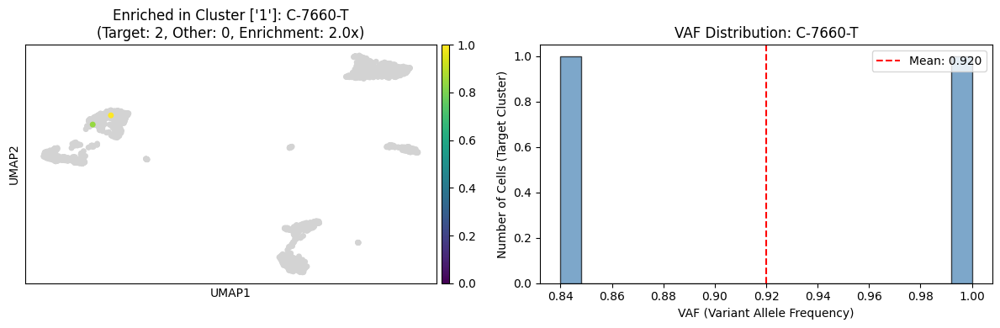


C-7660-T:
  Confident in target: 2
  Confident in other: 0
  Mean VAF in target: 0.920
  Enrichment: 2.00x

Full results stored in variable: enriched_df
You can export with: enriched_df.to_csv('enriched_variants_cluster1.csv', index=False)


In [70]:
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd

# ============================================
# EDIT THESE PARAMETERS
# ============================================
TARGET_CLUSTERS = ['1']  # Edit this: clusters to look for unique variants in
MIN_CONFIDENT_CELLS = 2  # Lowered to 2 (most variants are in 1-2 cells)
MAX_CONFIDENT_IN_OTHER = 3  # Allow some presence in other clusters
MIN_MEAN_VAF_IN_TARGET = 0.01  # Minimum mean VAF in target cluster(s)
TOP_N_VARIANTS = 10  # Number of top variants to plot
MIN_ENRICHMENT = 1.5  # Minimum enrichment ratio (target/other)

# ============================================
# ANALYSIS CODE
# ============================================

print(f"Finding variants enriched in cluster(s): {TARGET_CLUSTERS}")
print(f"Criteria:")
print(f"  - Min confident cells in target: {MIN_CONFIDENT_CELLS}")
print(f"  - Max confident cells in other clusters: {MAX_CONFIDENT_IN_OTHER}")
print(f"  - Min mean VAF in target: {MIN_MEAN_VAF_IN_TARGET}")
print(f"  - Min enrichment ratio: {MIN_ENRICHMENT}")
print("="*60)

# Get cluster assignments
cluster_col = 'leiden'
clusters = mgatk.obs[cluster_col].values

# Create masks for target and other clusters
target_mask = np.isin(clusters, TARGET_CLUSTERS)
other_mask = ~target_mask

print(f"Cells in target cluster(s): {target_mask.sum()}")
print(f"Cells in other clusters: {other_mask.sum()}")

# Get matrices
vaf_matrix = mgatk.obsm['variant_vaf']
confident_matrix = mgatk.obsm['variant_confident']
variant_names = mgatk.uns['variant_names']

# Analyze each variant
enriched_variants = []

for variant_idx in range(len(variant_names)):
    variant_name = variant_names[variant_idx]
    
    # Get VAF and confidence for this variant
    vaf_values = vaf_matrix[:, variant_idx]
    confident_calls = confident_matrix[:, variant_idx]
    
    # Count confident cells in target vs other clusters
    confident_in_target = (confident_calls & target_mask & (vaf_values > 0)).sum()
    confident_in_other = (confident_calls & other_mask & (vaf_values > 0)).sum()
    
    # Calculate enrichment
    enrichment = confident_in_target / (confident_in_other + 1)
    
    # Calculate mean VAF in target cluster (only confident, non-zero calls)
    target_confident_nonzero = confident_calls & target_mask & (vaf_values > 0)
    if target_confident_nonzero.any():
        mean_vaf_target = vaf_values[target_confident_nonzero].mean()
    else:
        mean_vaf_target = 0
    
    # Check if variant meets enrichment criteria
    if (confident_in_target >= MIN_CONFIDENT_CELLS and 
        confident_in_other <= MAX_CONFIDENT_IN_OTHER and
        mean_vaf_target >= MIN_MEAN_VAF_IN_TARGET and
        enrichment >= MIN_ENRICHMENT):
        
        enriched_variants.append({
            'variant_idx': variant_idx,
            'variant_name': variant_name,
            'confident_in_target': confident_in_target,
            'confident_in_other': confident_in_other,
            'mean_vaf_target': mean_vaf_target,
            'enrichment': enrichment
        })

# Convert to DataFrame and sort
enriched_df = pd.DataFrame(enriched_variants)

if len(enriched_df) == 0:
    print("\n❌ No variants found matching the criteria!")
    print("Try relaxing the parameters (e.g., lower MIN_CONFIDENT_CELLS, increase MAX_CONFIDENT_IN_OTHER, or lower MIN_ENRICHMENT)")
else:
    # Sort by enrichment
    enriched_df = enriched_df.sort_values('enrichment', ascending=False)
    
    print(f"\n✅ Found {len(enriched_df)} enriched variants!")
    print("\nTop variants:")
    print(enriched_df.head(TOP_N_VARIANTS).to_string(index=False))
    
    # ============================================
    # PLOT TOP VARIANTS
    # ============================================
    
    n_to_plot = min(TOP_N_VARIANTS, len(enriched_df))
    print(f"\n{'='*60}")
    print(f"Plotting top {n_to_plot} enriched variants")
    print('='*60)
    
    for i, row in enriched_df.head(n_to_plot).iterrows():
        variant_idx = row['variant_idx']
        variant_name = row['variant_name']
        
        # Get VAF and confidence
        vaf_values = vaf_matrix[:, variant_idx]
        confident_calls = confident_matrix[:, variant_idx]
        
        # Filter for confident non-zero calls in TARGET cluster
        target_confident_mask = confident_calls & target_mask & (vaf_values > 0)
        filtered_vaf_values = vaf_values[target_confident_mask]
        
        if not target_confident_mask.any():
            continue
        
        # Create temporary column for plotting
        temp_vaf_col = np.full(len(mgatk.obs), np.nan)
        temp_vaf_col[target_confident_mask] = filtered_vaf_values
        mgatk.obs[f'temp_vaf_{variant_idx}'] = temp_vaf_col
        
        # Create figure
        fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 4))
        
        # UMAP plot
        import scanpy as sc
        sc.pl.umap(mgatk, color=f'temp_vaf_{variant_idx}', cmap="viridis", vmin=0, vmax=1,
                   title=f"Enriched in Cluster {TARGET_CLUSTERS}: {variant_name}\n" + 
                         f"(Target: {int(row['confident_in_target'])}, Other: {int(row['confident_in_other'])}, Enrichment: {row['enrichment']:.1f}x)",
                   ax=ax1, show=False, na_color='lightgray')
        
        # Histogram
        ax2.hist(filtered_vaf_values, bins=20, alpha=0.7, edgecolor='black', color='steelblue')
        ax2.set_xlabel('VAF (Variant Allele Frequency)')
        ax2.set_ylabel('Number of Cells (Target Cluster)')
        ax2.set_title(f'VAF Distribution: {variant_name}')
        ax2.axvline(filtered_vaf_values.mean(), color='red', linestyle='--',
                    label=f'Mean: {filtered_vaf_values.mean():.3f}')
        ax2.legend()
        
        plt.tight_layout()
        plt.show()
        
        print(f"\n{variant_name}:")
        print(f"  Confident in target: {int(row['confident_in_target'])}")
        print(f"  Confident in other: {int(row['confident_in_other'])}")
        print(f"  Mean VAF in target: {row['mean_vaf_target']:.3f}")
        print(f"  Enrichment: {row['enrichment']:.2f}x")
        
        # Clean up
        mgatk.obs.drop(columns=[f'temp_vaf_{variant_idx}'], inplace=True)
    
    # ============================================
    # EXPORT RESULTS
    # ============================================
    print(f"\n{'='*60}")
    print("Full results stored in variable: enriched_df")
    print("You can export with: enriched_df.to_csv('enriched_variants_cluster1.csv', index=False)")